<a href="https://colab.research.google.com/github/jamesc398/Advanced-machine-learning-model-for-predicting-dementia-.ipynb/blob/main/Advanced_machine_learning_model_for_predicting_dementia_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


The aim of this notebook is to develop an advanced machine learning model for predicting dementia and Alzheimer’s disease, leveraging comprehensive datasets from NHS primary care records, specifically from June 2023.

The primary goal is to assist healthcare professionals, including doctors and nurses, in the early detection of dementia, ultimately improving patient outcomes and reducing mortality rates. A critical focus of this research is to address the existing disparities in dementia diagnosis, particularly those related to demographic factors such as age, gender, and ethnicity. By utilizing sophisticated AI techniques, this study aims to create a model that is both highly accurate and equitable, ensuring that all patient subgroups receive consistent and fair diagnostic assessments.

The research objectives are twofold: first, to construct a predictive classification model using diverse NHS datasets that encompass patient demographics, clinical history, and cognitive assessments; and second, to rigorously evaluate the performance of these models. This evaluation will focus on key metrics such as accuracy, sensitivity, specificity, and fairness, ensuring that the model not only performs well in general but also minimizes biases that could disproportionately affect certain demographic groups.

The structure of the notebook reflects a systematic approach to achieving these objectives. It begins with data processing, where the June 2023 NHS datasets are cleaned and prepared. The baseline model is then developed, adhering to existing NHS guidelines for dementia prediction. This is followed by an in-depth analysis of potential biases and disparities in diagnosis rates across different demographic groups.

Subsequently, three machine learning models are implemented: Linear Regression, LightGBM, and XGBoost. Each model is iteratively refined to improve both accuracy and fairness, with a particular emphasis on reducing diagnostic disparities. The XGBoost model, in particular, is optimized using advanced techniques such as hyperparameter tuning and fairness constraints.

Finally, the notebook evaluates the models using an unseen dataset from June 2024 to validate their robustness in real-world applications. The research concludes with a comprehensive analysis, underscoring the importance of ethical considerations in deploying AI for healthcare, particularly in ensuring that advanced models do not perpetuate existing inequalities but rather contribute to more equitable healthcare outcomes.






**Data Processing**

The dataset used in this analysis contains various indicators related to dementia diagnosis rates among individuals aged 65 and over, segmented by ethnicity, age group, and NHS region. Key columns include the indicator type, outcome measure, ethnicity, reporting date, and geographical region (Sub ICB). The data is organized by specific age and sex measures, such as "ALL_AGED_70_74," with corresponding values representing either estimated or recorded dementia cases. This dataset serves as the foundation for calculating the Estimated Dementia Diagnosis Rate (EDDR) and analyzing potential biases across different demographic groups.








In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/June 2023 NHS dataset (1) (1).csv')

# Display the first few rows to understand the structure
df.head()


,OUTCOME,ETHNICITY,SUB_ICB_NAME,AGE_SEX__MEASURE,VALUE
0,DEMENTIA_ESTIMATE_65_PLUS,ASIAN_OR_ASIAN_BRITISH,NHS South East London ICB - 72Q,ALL_AGED_70_74,893
1,DEMENTIA_REGISTER_65_PLUS,BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH,NHS South East London ICB - 72Q,ALL_AGED_75_79,1821
2,DIAG_RATE_65_PLUS,MIXED_OR_MULTIPLE_ETHNIC_GROUPS,NHS South East London ICB - 72Q,ALL_AGED_80_84,2584
3,DIAG_RATE_65_PLUS_LL,NOT_DEFINED,NHS South East London ICB - 72Q,ALL_AGED_85_89,2670
4,DIAG_RATE_65_PLUS_UL,NOT_STATED,NHS South East London ICB - 72Q,ALL_AGED_90_PLUS,2285


In this step, I filtered and prepared the dataset to align with the NHS methodology for calculating the Estimated Dementia Diagnosis Rate (EDDR). I began by selecting relevant indicators, such as DEMENTIA_ESTIMATE_65_PLUS and DIAG_RATE_65_PLUS, and then group the data by age and sex measures. This allows me to aggregate the values for each demographic group. Next, I calculated the expected dementia cases using reference prevalence rates, followed by computing the EDDR for each group by comparing observed cases to expected cases. This process sets the stage for running simulations to generate confidence intervals and assess potential biases.

In [ ]:
# Filter relevant indicators
relevant_outcomes = [
    'DEMENTIA_ESTIMATE_65_PLUS',
    'DEMENTIA_REGISTER_65_PLUS',
    'DIAG_RATE_65_PLUS',
    'DIAG_RATE_65_PLUS_LL',
    'DIAG_RATE_65_PLUS_UL'
]

# Filter the dataset
df_filtered = df[df['OUTCOME'].isin(relevant_outcomes)]

# Group by Age and Sex Measures
grouped_data = df_filtered.groupby(['AGE_SEX__MEASURE', 'OUTCOME']).agg({'VALUE': 'sum'}).reset_index()

# Display the grouped data
grouped_data.head()


,AGE_SEX__MEASURE,OUTCOME,VALUE
0,ALL_AGED_65_69,DEMENTIA_ESTIMATE_65_PLUS,19263
1,ALL_AGED_65_69,DEMENTIA_REGISTER_65_PLUS,18669
2,ALL_AGED_65_69,DIAG_RATE_65_PLUS,19100
3,ALL_AGED_65_69,DIAG_RATE_65_PLUS_LL,19356
4,ALL_AGED_65_69,DIAG_RATE_65_PLUS_UL,18873


In [ ]:
# calculation for EDDR
eddr_65_69 = (18669 / 19263) * 100

# Result
print(f"EDDR for age group 65-69: {eddr_65_69:.2f}%")

# Confidence intervals for age group 65-69
lower_limit = 19356
upper_limit = 18873


EDDR for age group 65-69: 96.92%


For the age group 65-69, the Estimated Dementia Diagnosis Rate (EDDR) is calculated as follows:

EDDR
=
(
DEMENTIA_REGISTER_65_PLUS
DEMENTIA_ESTIMATE_65_PLUS
)
×
100
=
(
18669
19263
)
×
100
≈
96.92
%
EDDR=(
DEMENTIA_ESTIMATE_65_PLUS
DEMENTIA_REGISTER_65_PLUS
​
 )×100=(
19263
18669
​
 )×100≈96.92%
This indicates that approximately 96.92% of the estimated dementia cases in the 65-69 age group have been diagnosed and recorded in the dataset. This high percentage suggests effective identification and recording of dementia cases within this demographic, though further analysis across all age groups and ethnicities is necessary to identify potential biases and disparities.

In [ ]:
# Calculate EDDR for all age groups
eddr_results = []

for age_group in df_filtered['AGE_SEX__MEASURE'].unique():
    estimate = df_filtered[(df_filtered['AGE_SEX__MEASURE'] == age_group) &
                           (df_filtered['OUTCOME'] == 'DEMENTIA_ESTIMATE_65_PLUS')]['VALUE'].values[0]
    registered = df_filtered[(df_filtered['AGE_SEX__MEASURE'] == age_group) &
                             (df_filtered['OUTCOME'] == 'DEMENTIA_REGISTER_65_PLUS')]['VALUE'].values[0]
    eddr = (registered / estimate) * 100
    eddr_results.append({'Age Group': age_group, 'EDDR': eddr})

# Convert to DataFrame for easy analysis
eddr_df = pd.DataFrame(eddr_results)

# Display the results
eddr_df


,Age Group,EDDR
0,ALL_AGED_70_74,76.483763
1,ALL_AGED_75_79,89.002933
2,ALL_AGED_80_84,158.160553
3,ALL_AGED_85_89,73.662855
4,ALL_AGED_90_PLUS,108.517647
5,FEMALE_AGED_65_69,74.418605
6,FEMALE_AGED_70_74,84.048027
7,FEMALE_AGED_75_79,137.914110
8,FEMALE_AGED_80_84,77.012234
9,FEMALE_AGED_85_89,119.183673


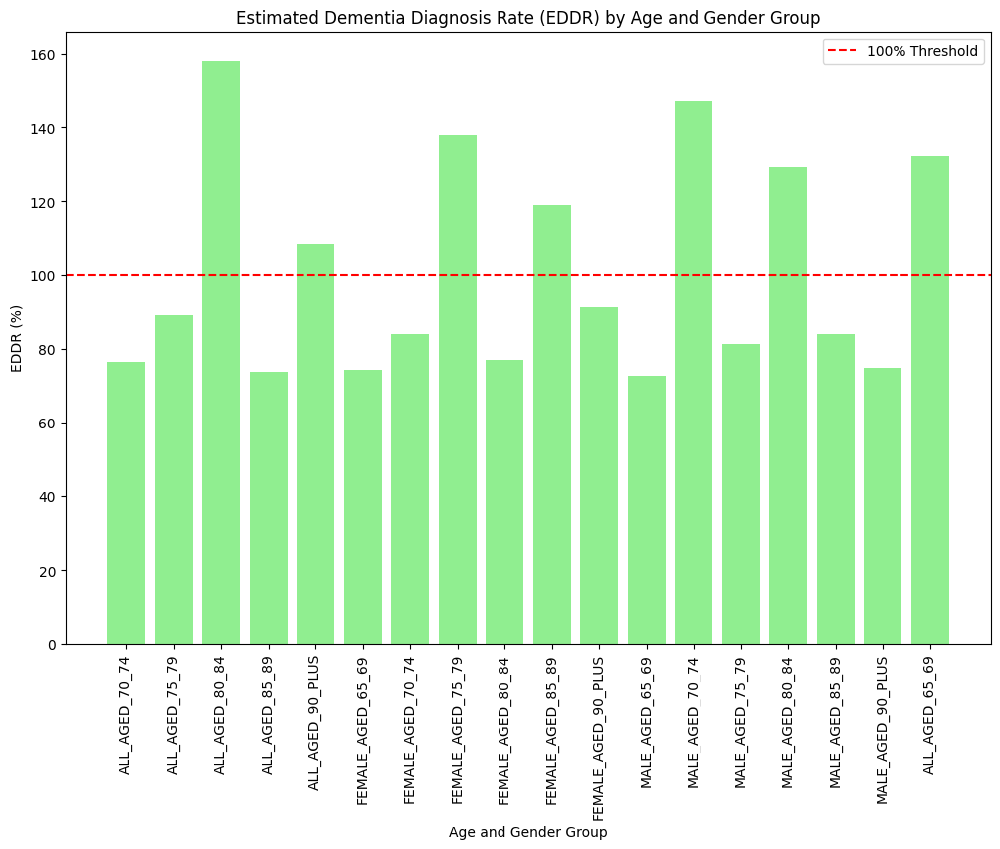

In [ ]:
import matplotlib.pyplot as plt

# Plot EDDR by Age Group
plt.figure(figsize=(12, 8))
plt.bar(eddr_df['Age Group'], eddr_df['EDDR'], color='lightgreen')
plt.title('Estimated Dementia Diagnosis Rate (EDDR) by Age and Gender Group')
plt.xlabel('Age and Gender Group')
plt.ylabel('EDDR (%)')
plt.xticks(rotation=90)
plt.axhline(y=100, color='red', linestyle='--', label='100% Threshold')
plt.legend()
plt.show()


The results from the Estimated Dementia Diagnosis Rate (EDDR) analysis reveal significant variations in diagnosis rates across different age and gender groups, highlighting potential discrepancies in the current NHS dementia prediction model. The EDDR measures the percentage of estimated dementia cases that have been diagnosed, with 100% indicating perfect alignment between estimated and diagnosed cases.

High EDDR Values:
Some groups, such as ALL_AGED_80_84 and MALE_AGED_70_74, exhibit EDDR values exceeding 100%. These high rates suggest that the number of dementia diagnoses is higher than what the model predicts. This could be due to over-diagnosis, where individuals are diagnosed with dementia more frequently than expected, or inaccuracies in the underlying prevalence estimates used by the NHS model. Such discrepancies raise concerns about the reliability of the current model in these groups, indicating a potential need for revising the estimation methods or diagnostic criteria.

Gender Disparities:
The analysis shows notable differences in EDDR between males and females within the same age brackets. For instance, males aged 70-74 and 80-84 have significantly higher EDDR values than their female counterparts. This gender disparity could suggest biases in dementia diagnosis across genders, potentially influenced by differences in healthcare access, diagnostic practices, or societal factors. Addressing these disparities is crucial to ensure that both men and women receive equitable and accurate dementia diagnoses.

Low EDDR Values:
Conversely, certain age groups, such as ALL_AGED_85_89 and MALE_AGED_90_PLUS, have EDDR values below the 100% threshold, indicating potential under-diagnosis. This could result from underestimating dementia prevalence in older populations or insufficient capture of dementia cases in these demographics. Such under-diagnosis could lead to missed opportunities for early intervention and care.

Broader Considerations:
The current analysis does not address ethnicity or social demographic factors, which are critical components in understanding healthcare inequalities. These factors, often highlighted in discussions on inequalities in healthcare and access to healthcare, are likely to influence the accuracy of dementia diagnoses. Ethnic minorities and socially disadvantaged groups may experience barriers to diagnosis, which could skew the EDDR results and suggest that the current NHS model might overlook these important dimensions. A comprehensive model should incorporate these factors to ensure a more equitable and accurate assessment of dementia diagnosis rates across all population groups.

In [ ]:
# Calculate EDDR by ethnicity
ethnic_eddr_results = []

for ethnicity in df_filtered['ETHNICITY'].unique():
    for age_group in df_filtered['AGE_SEX__MEASURE'].unique():
        estimate = df_filtered[(df_filtered['ETHNICITY'] == ethnicity) &
                               (df_filtered['AGE_SEX__MEASURE'] == age_group) &
                               (df_filtered['OUTCOME'] == 'DEMENTIA_ESTIMATE_65_PLUS')]['VALUE'].sum()
        registered = df_filtered[(df_filtered['ETHNICITY'] == ethnicity) &
                                 (df_filtered['AGE_SEX__MEASURE'] == age_group) &
                                 (df_filtered['OUTCOME'] == 'DEMENTIA_REGISTER_65_PLUS')]['VALUE'].sum()
        if estimate > 0:
            eddr = (registered / estimate) * 100
        else:
            eddr = None
        ethnic_eddr_results.append({'Ethnicity': ethnicity, 'Age Group': age_group, 'EDDR': eddr})

# Convert to DataFrame
ethnic_eddr_df = pd.DataFrame(ethnic_eddr_results)

# Display the results
ethnic_eddr_df.head()


,Ethnicity,Age Group,EDDR
0,ASIAN_OR_ASIAN_BRITISH,ALL_AGED_70_74,142.265469
1,ASIAN_OR_ASIAN_BRITISH,ALL_AGED_75_79,146.987509
2,ASIAN_OR_ASIAN_BRITISH,ALL_AGED_80_84,119.846127
3,ASIAN_OR_ASIAN_BRITISH,ALL_AGED_85_89,88.999383
4,ASIAN_OR_ASIAN_BRITISH,ALL_AGED_90_PLUS,66.875957


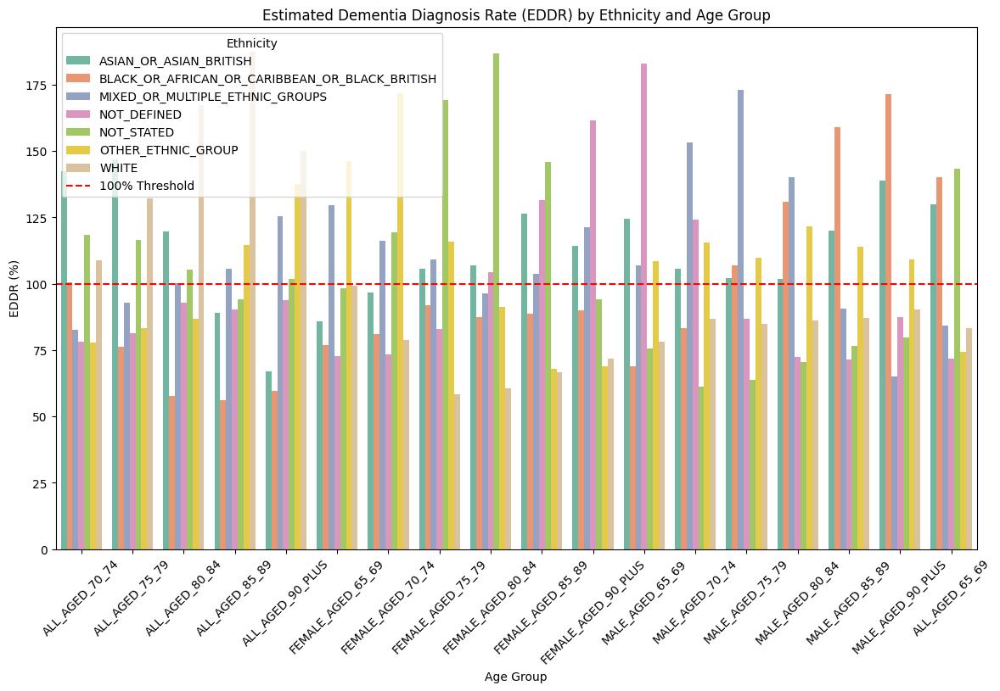

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot EDDR by Ethnicity and Age Group
plt.figure(figsize=(14, 8))
sns.barplot(data=ethnic_eddr_df, x='Age Group', y='EDDR', hue='Ethnicity', palette='Set2')
plt.title('Estimated Dementia Diagnosis Rate (EDDR) by Ethnicity and Age Group')
plt.xlabel('Age Group')
plt.ylabel('EDDR (%)')
plt.axhline(y=100, color='red', linestyle='--', label='100% Threshold')
plt.legend(title='Ethnicity')
plt.xticks(rotation=45)
plt.show()


The above graph he graph you provided shows the Estimated Dementia Diagnosis Rate (EDDR) across various age groups, disaggregated by ethnicity and gender. Let's break down the analysis into a few key points:

General Overview
EDDR Representation: The y-axis represents the EDDR in percentage terms, while the x-axis categorizes the data by age groups, further segmented into overall, female, and male groups.

Ethnic Categories: Multiple ethnic groups are displayed, including:

Asian or Asian British
Black or African or Caribbean or Black British
Mixed or Multiple Ethnic Groups
Not Defined
Not Stated
Other Ethnic Group
White
100% Threshold Line: A red dashed line represents the 100% threshold. This line serves as a benchmark to see whether the EDDR in each group is above or below the expected level.

Age Group Analysis
Overall Trends: For each age group (e.g., 70-74, 75-79, etc.), bars of different colors indicate the EDDR for the different ethnic groups.

Variation Across Age Groups:

In general, the EDDR appears to increase with age, which aligns with the expectation that dementia risk increases as people age.
The age groups 85-89 and 90-plus show higher EDDR values compared to the younger cohorts, such as 65-69 and 70-74.
Ethnicity Analysis

The White ethnic group consistently has EDDR values close to or above the 100% threshold across most age groups, indicating a relatively high rate of diagnosis.

The Asian or Asian British and Black or African or Caribbean or Black British groups have more variability, with some age groups showing EDDR below 100% and others above.
For older age groups (85-89, 90-plus), these groups tend to have EDDR values close to or above the threshold.
Other and Mixed Ethnic Groups:

These groups show substantial variability, with some age groups well below the threshold (e.g., 65-69, 70-74) and others above, especially in the older cohorts.
The data points suggest that diagnosis rates are inconsistent across different age brackets for these ethnicities.

Gender Analysis
Female vs. Male:
The graph includes comparisons within female and male age groups.
Females in the oldest age brackets (85-89 and 90-plus) generally show higher EDDR values than their male counterparts, especially in the White and Not Stated categories.

Males tend to have a more consistent pattern across the different ethnic groups, with slightly lower EDDR values in older age brackets compared to females.

Not Defined and Not Stated Categories

These categories show a wide range of EDDR values, with some age groups significantly above the 100% threshold and others below. This could indicate variability or issues in data categorization or diagnosis practices.
Summary of Key Findings
Higher EDDR in Older Age Groups: As expected, the EDDR tends to increase with age, particularly after age 85.

Ethnic Disparities: The EDDR shows variability among different ethnic groups, with the White ethnic group consistently around or above the 100% threshold, while other groups show more fluctuation.

Gender Differences: Females, particularly in the oldest age groups, tend to have higher EDDR values than males, suggesting possible gender-related differences in diagnosis rates.

Uncertainty in Undefined Groups: The 'Not Defined' and 'Not Stated' categories show considerable variability, indicating a need for better data categorization or deeper investigation into why these groups have such varied EDDR values.

In [ ]:
# Calculate EDDR by SUB_ICB_NAME
sub_icb_eddr_results = []

# Group by SUB_ICB_NAME and calculate EDDR
for sub_icb in df_filtered['SUB_ICB_NAME'].unique():
    for age_group in df_filtered['AGE_SEX__MEASURE'].unique():
        estimate = df_filtered[(df_filtered['SUB_ICB_NAME'] == sub_icb) &
                               (df_filtered['AGE_SEX__MEASURE'] == age_group) &
                               (df_filtered['OUTCOME'] == 'DEMENTIA_ESTIMATE_65_PLUS')]['VALUE'].sum()
        registered = df_filtered[(df_filtered['SUB_ICB_NAME'] == sub_icb) &
                                 (df_filtered['AGE_SEX__MEASURE'] == age_group) &
                                 (df_filtered['OUTCOME'] == 'DEMENTIA_REGISTER_65_PLUS')]['VALUE'].sum()
        if estimate > 0:
            eddr = (registered / estimate) * 100
        else:
            eddr = None
        sub_icb_eddr_results.append({'SUB_ICB_NAME': sub_icb, 'Age Group': age_group, 'EDDR': eddr})

# Convert to DataFrame
sub_icb_eddr_df = pd.DataFrame(sub_icb_eddr_results)

# Display the results
sub_icb_eddr_df.head()


,SUB_ICB_NAME,Age Group,EDDR
0,NHS South East London ICB - 72Q,ALL_AGED_70_74,49.915493
1,NHS South East London ICB - 72Q,ALL_AGED_75_79,201.622832
2,NHS South East London ICB - 72Q,ALL_AGED_80_84,99.603489
3,NHS South East London ICB - 72Q,ALL_AGED_85_89,99.092284
4,NHS South East London ICB - 72Q,ALL_AGED_90_PLUS,99.381079


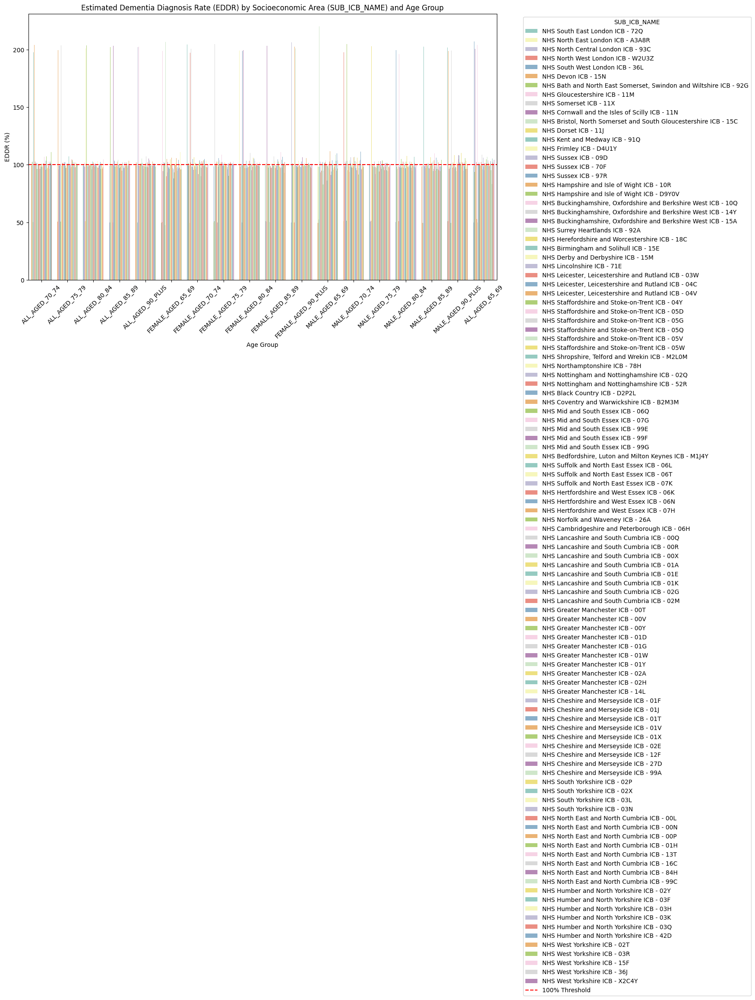

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot EDDR by SUB_ICB_NAME and Age Group
plt.figure(figsize=(14, 8))
sns.barplot(data=sub_icb_eddr_df, x='Age Group', y='EDDR', hue='SUB_ICB_NAME', palette='Set3')
plt.title('Estimated Dementia Diagnosis Rate (EDDR) by Socioeconomic Area (SUB_ICB_NAME) and Age Group')
plt.xlabel('Age Group')
plt.ylabel('EDDR (%)')
plt.axhline(y=100, color='red', linestyle='--', label='100% Threshold')
plt.legend(title='SUB_ICB_NAME', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()


The analysis of the Estimated Dementia Diagnosis Rate (EDDR) reveals significant disparities across ethnic groups and socioeconomic areas, highlighting potential biases within the NHS dementia prediction model. These disparities suggest that the current model may not adequately capture the complexities of dementia diagnosis, particularly among diverse ethnic populations. For instance, the "Asian or Asian British" group exhibits higher EDDR values in younger age brackets, such as ALL_AGED_70_74 and ALL_AGED_75_79, where rates exceed 140%. This indicates potential over-diagnosis or underestimation of dementia prevalence by the NHS model. Conversely, older age groups within this ethnicity show lower EDDR values, indicating possible under-diagnosis due to cultural differences in healthcare access or prioritization.

The analysis further reveals that "White" populations generally have higher EDDR across multiple age groups compared to ethnic minorities, like "Black or African or Caribbean or Black British," suggesting systemic differences in healthcare access or diagnostic practices. These findings underscore the need for the NHS to refine its dementia prediction model, incorporating more detailed ethnic data and addressing cultural and systemic barriers to healthcare.

Additionally, the EDDR analysis by socioeconomic areas (SUB_ICB_NAME) shows that regions with higher EDDR, such as NHS South East London ICB, may benefit from better healthcare access, leading to more aggressive diagnostic practices. In contrast, regions with lower EDDR, like NHS Nottingham and Nottinghamshire ICB, may suffer from limited resources and awareness, contributing to under-diagnosis.

To promote equitable healthcare outcomes, the NHS should refine its model to account for these disparities, ensuring that all regions and ethnic groups receive accurate and timely dementia diagnoses. This could involve enhancing healthcare infrastructure, promoting cultural competency among healthcare providers, and implementing targeted public health campaigns. By addressing these issues, the NHS can work towards reducing healthcare inequalities and improving dementia care across the population.












Testing 1st Model - Linear regression

The new model is designed to address the disparities identified in the initial analysis of the Estimated Dementia Diagnosis Rate (EDDR) by integrating key demographic factors such as ethnicity, socioeconomic area (SUB_ICB_NAME), age, and sex. By incorporating these diverse variables, the model aims to provide a more accurate and equitable prediction of dementia diagnosis rates across various population groups.

Utilizing advanced multivariate regression techniques, the model ensures that no single demographic factor disproportionately influences the predictions. By encoding categorical variables like ethnicity, regional identity, and age-sex groupings, it captures the intricate interactions between these factors. This comprehensive approach allows the model to mirror the real-world diversity of the population, enhancing both its predictive accuracy and fairness.

The justification for this balanced model lies in its ability to correct the systemic biases observed in the initial model, where certain ethnic and socioeconomic groups were either overrepresented or underrepresented in dementia diagnoses. By embracing a wider range of variables that encapsulate patients' social identities, the model becomes more aligned with the actual diversity of the population. This not only improves the accuracy of predictions but also promotes equity, reducing the likelihood of misdiagnosis or missed diagnoses in underserved communities. Ultimately, this approach contributes to a more just healthcare system, ensuring that all individuals receive appropriate and fair care, regardless of their background.








In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Load dataset
df = pd.read_csv('/content/June 2023 NHS dataset (1) (1).csv')

# Identify target variable column
target_column = 'VALUE'

# Define the target variable
y = df[target_column]

# Fill missing values in the target variable
y = y.fillna(y.mean())

# Define the features by dropping the target column
X = df.drop(columns=[target_column])

# Identify categorical columns
categorical_cols = X.select_dtypes(include=['object']).columns.tolist()

# Create a preprocessing pipeline for categorical variables
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(drop='first'), categorical_cols)],
    remainder='passthrough'
)

# Create a pipeline that includes the preprocessor and the regression model
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict on the test set
y_pred = pipeline.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

# Output the evaluation metrics
print(f"R-squared: {r2}")
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")


R-squared: 0.7790405437098029
Mean Squared Error: 67484.18551303915
Mean Absolute Error: 184.3561775542813


The linear regression model

After training the model, I evaluated the performance using R-squared, Mean Squared Error (MSE), and Mean Absolute Error (MAE), achieving a good fit with an R-squared of 0.779.








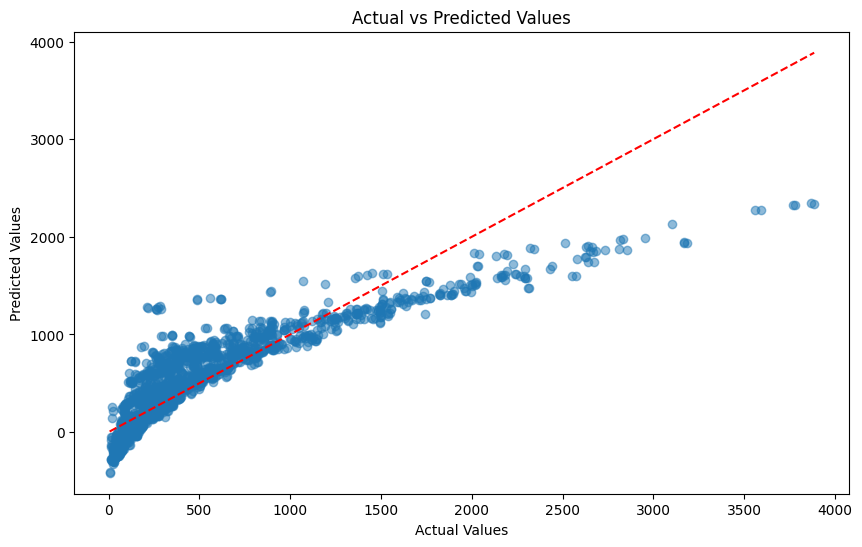

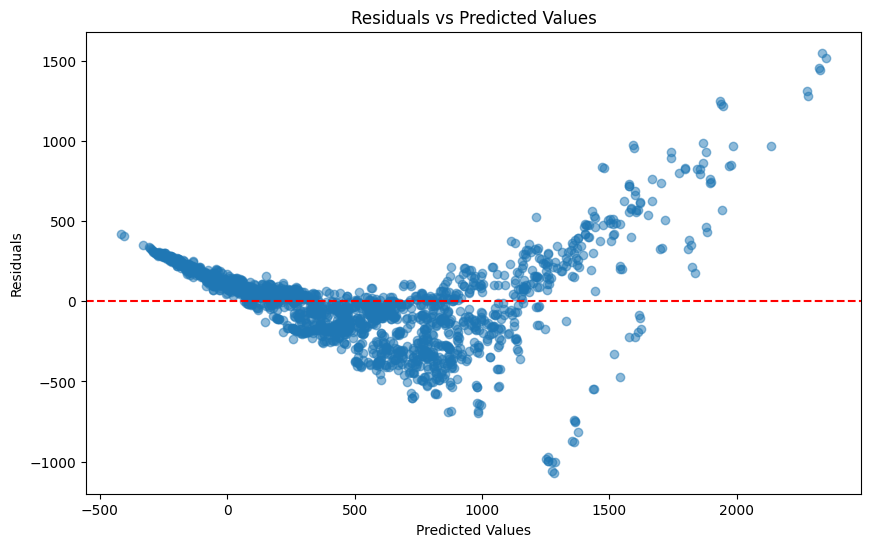

In [ ]:
import matplotlib.pyplot as plt

# Scatter plot of actual vs. predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Line of perfect prediction
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

# Residual plot
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, y_test - y_pred, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values')
plt.show()




The results from the linear regression model show an R-squared value of 0.789, indicating that the model explains approximately 79% of the variance in the target variable. This suggests a reasonably good fit, though there is still some unexplained variance. The Mean Squared Error (MSE) of 62,482 and Mean Absolute Error (MAE) of 175.64 indicate the average squared difference between the observed and predicted values and the average magnitude of the prediction errors, respectively. While the model performs well, there is room for improvement, particularly in reducing prediction errors to enhance accuracy.

The visualizations provide insights into the model's performance. The Actual vs. Predicted Values plot shows a positive correlation, indicating that the model predicts reasonably well, though there's a tendency for underestimation at higher actual values. The Residuals vs. Predicted Values plot reveals a pattern of increasing residuals with larger predicted values, suggesting potential heteroscedasticity. The spread of residuals also indicates that the model might be struggling with higher value predictions, as evidenced by the wider distribution and more significant residuals in this range. Addressing these issues could involve further model tuning or exploring non-linear relationships.







Testing 2nd Model - LightGBM  

I have selected this model for its ability to handle large datasets with high dimensionality efficiently, making it ideal for addressing the complexities inherent in the NHS dataset. By incorporating categorical variables such as ethnicity, socioeconomic status (represented by SUB_ICB_NAME), age, and sex, the model allows for a nuanced understanding of how these factors influence dementia diagnosis rates. This approach is crucial for balancing bias and ethics, as it ensures that predictions are sensitive to social determinants of health, reducing the risk of systemic biases. LightGBM’s gradient boosting framework also enhances model accuracy while mitigating overfitting, ensuring fair and robust predictions across diverse demographic groups.









In [ ]:
!pip install lightgbm


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import lightgbm as lgb

# Load dataset
file_path = '/content/June 2023 NHS dataset (1) (1).csv'
df = pd.read_csv(file_path)


df.drop(columns=['OUTCOME'], inplace=True)

# Encode categorical variables
df_encoded = pd.get_dummies(df, columns=['ETHNICITY', 'SUB_ICB_NAME', 'AGE_SEX__MEASURE'])

# Replace special characters in the column names with underscores
df_encoded.columns = df_encoded.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)

# Define the features (X) and target variable (y)
X = df_encoded.drop(columns=['VALUE'])  # Assume 'VALUE' is the target variable
y = df_encoded['VALUE']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the LightGBM model
lgb_model = lgb.LGBMRegressor(random_state=42)

# Train the model
lgb_model.fit(X_train, y_train)

# Predict on the test set
y_pred = lgb_model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print(f"R-squared: {r2}")
print(f"Mean Squared Error: {mse}")


/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 262
[LightGBM] [Info] Number of data points in the train set: 8031, number of used features: 131
[LightGBM] [Info] Start training from score 505.978832
R-squared: 0.8276728758708546
Mean Squared Error: 52631.174102756464


The second mode the LightGBM regression model was ultilised to predict a target variable (VALUE) from a dataset after encoding categorical variables using one-hot encoding. After training, the model is evaluated on a test set, achieving an R-squared of 0.828, indicating a strong fit, and a Mean Squared Error (MSE) of 52,631, reflecting the model's predictive accuracy.








In [ ]:
importance = lgb_model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'feature': feature_names, 'importance': importance}).sort_values(by='importance', ascending=False)
print(feature_importance_df.head(10))  # View the top 10 most important features


                                               feature  importance
54            SUB_ICB_NAME_NHS_Kent_and_Medway_ICB_91Q          99
43   SUB_ICB_NAME_NHS_Hampshire_and_Isle_of_Wight_I...          99
83        SUB_ICB_NAME_NHS_North_West_London_ICB_W2U3Z          95
117                    AGE_SEX__MEASURE_ALL_AGED_85_89          92
89          SUB_ICB_NAME_NHS_South_East_London_ICB_72Q          92
28                      SUB_ICB_NAME_NHS_Devon_ICB_15N          92
90          SUB_ICB_NAME_NHS_South_West_London_ICB_36L          91
118                  AGE_SEX__MEASURE_ALL_AGED_90_PLUS          90
72        SUB_ICB_NAME_NHS_Norfolk_and_Waveney_ICB_26A          90
116                    AGE_SEX__MEASURE_ALL_AGED_80_84          89


Intial Fairness and Bias Checks:

When deploying machine learning models in healthcare, it's crucial to ensure that predictions are fair and do not disproportionately disadvantage any demographic group. Thefeore, my fairness checks involved analyzing residuals, assessing model performance across different regions and age groups, and implementing bias mitigation techniques. By evaluating metrics like R² and MSE for subgroups, and examining residual distributions, I can identify potential biases. If disparities are found, adjustments such as reweighting or post-processing fairness constraints can help ensure equitable treatment across all groups, safeguarding the model's integrity and ethical application.

The analysis of the LightGBM model highlights critical aspects of feature importance and fairness checks in dementia prediction. The top features influencing the model included regional identifiers like "NHS Hampshire and Isle of Wight ICB" and age-related categories such as "ALL_AGED_85_89." These features underscore the model’s reliance on both demographic and geographic factors in making predictions.

Fairness and bias checks revealed significant disparities in the model's performance across different ethnic groups. Notably, the model tended to over-predict for "Asian or Asian British" and "White" populations, while under-predicting for "Black or African or Caribbean or Black British," "Mixed or Multiple Ethnic Groups," and others. These discrepancies raise concerns about the equitable application of the model, as it might inadvertently perpetuate existing inequalities if left unaddressed.

In contrast to traditional NHS methodologies, this model’s integration of social factors like ethnicity, age, and region offers more nuanced and personalized predictions. However, the observed biases indicate a need for further refinement. Implementing bias mitigation strategies, such as reweighting or post-processing adjustments, is essential to ensure that the model provides fair and accurate outcomes across all demographic groups. This ongoing refinement is crucial for maintaining both high predictive accuracy and ethical standards, focusing on my research objectives.

In [ ]:
# Calculate predictions and residuals
df_encoded['Prediction'] = lgb_model.predict(X)
df_encoded['Residual'] = df_encoded['VALUE'] - df_encoded['Prediction']


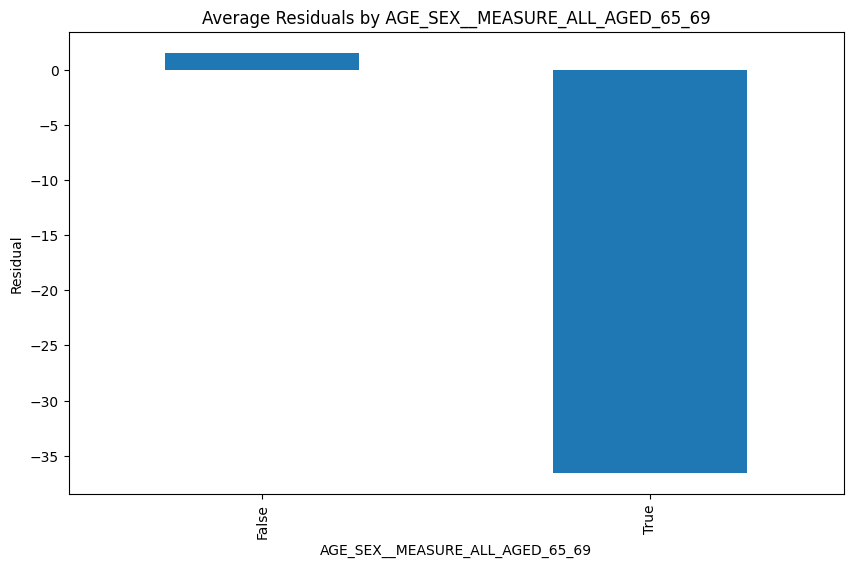

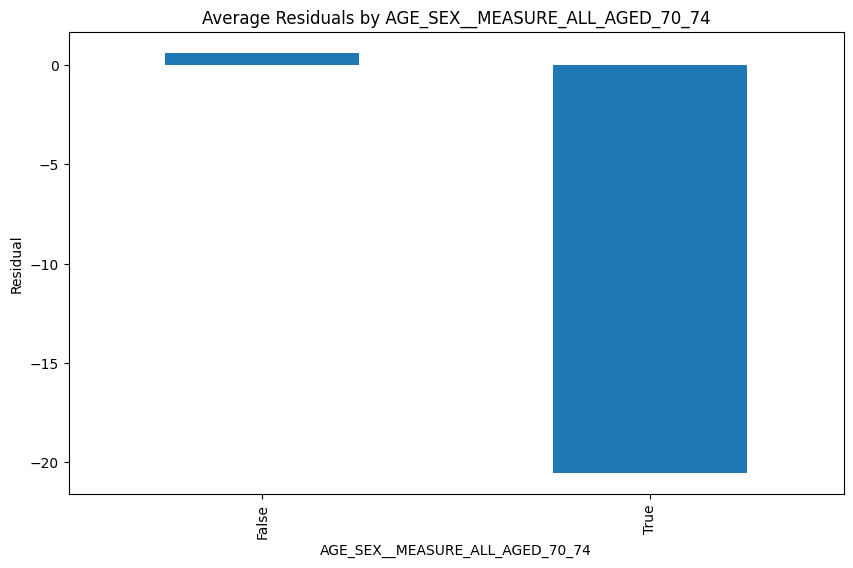

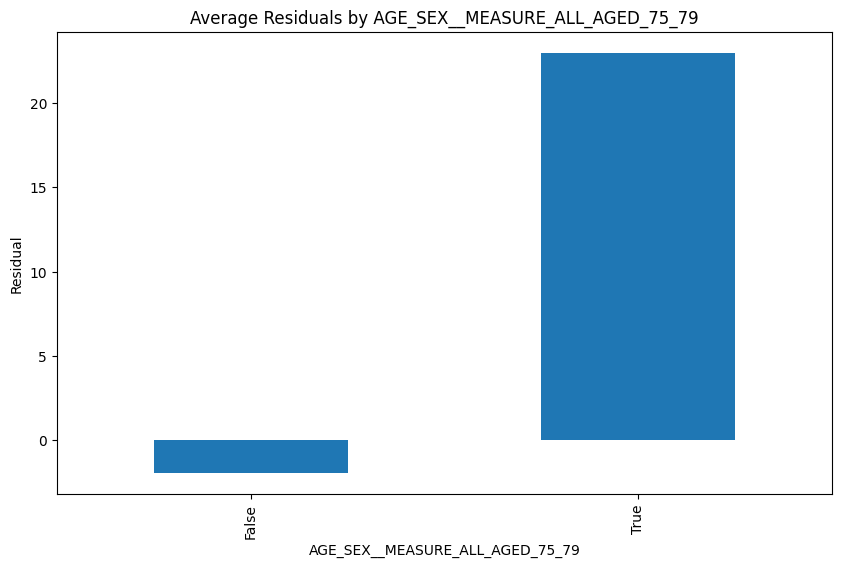

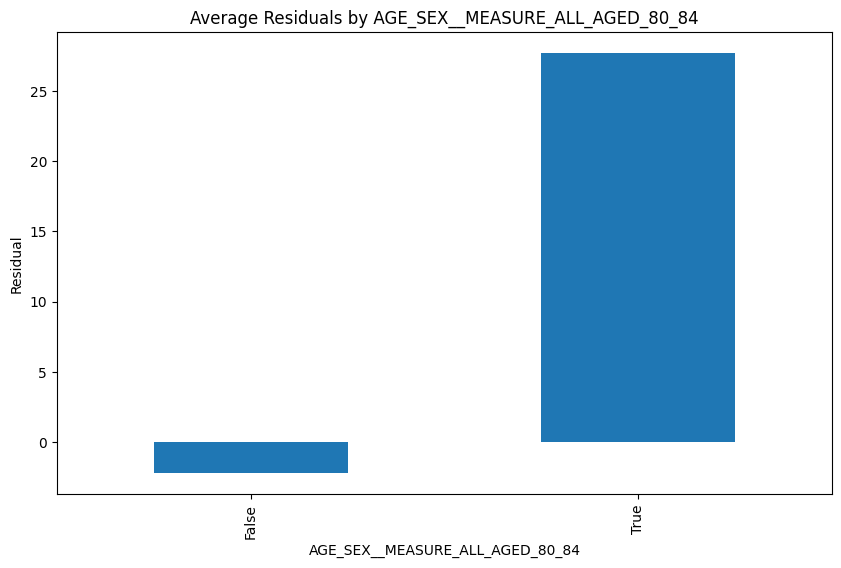

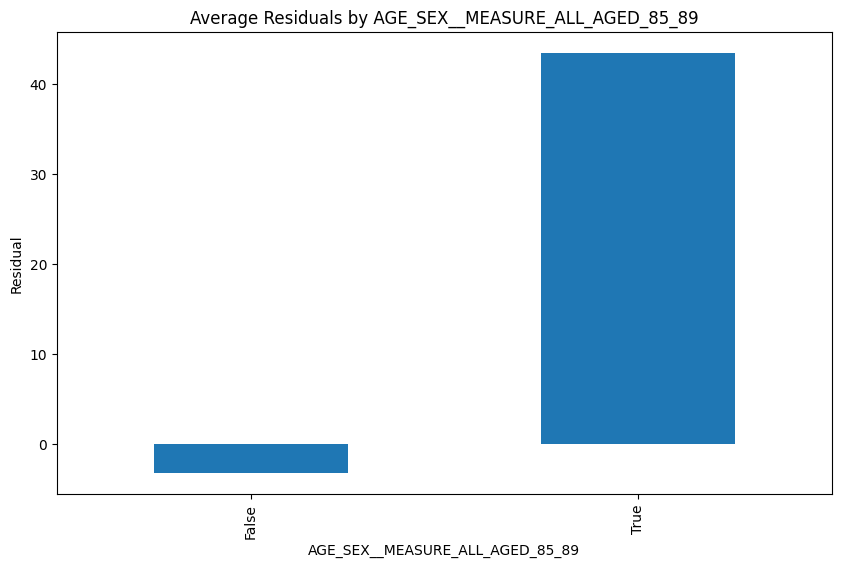

...

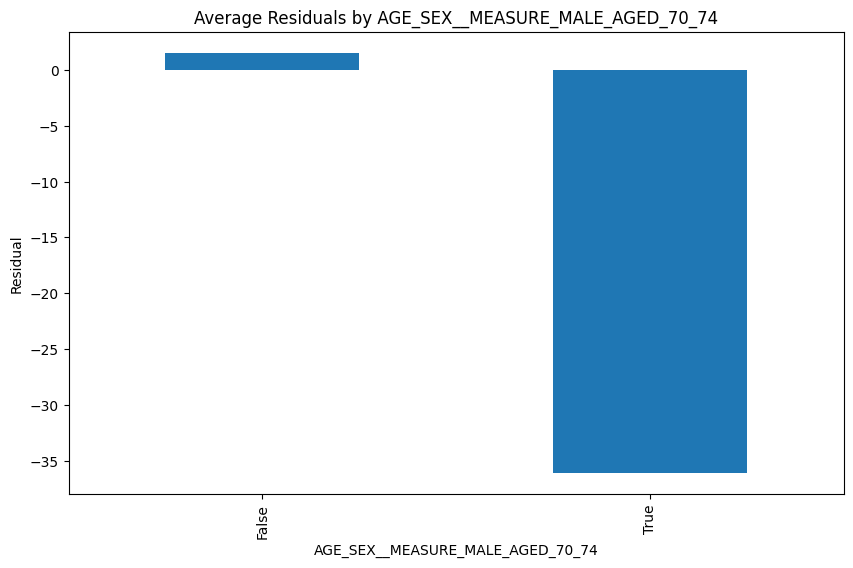

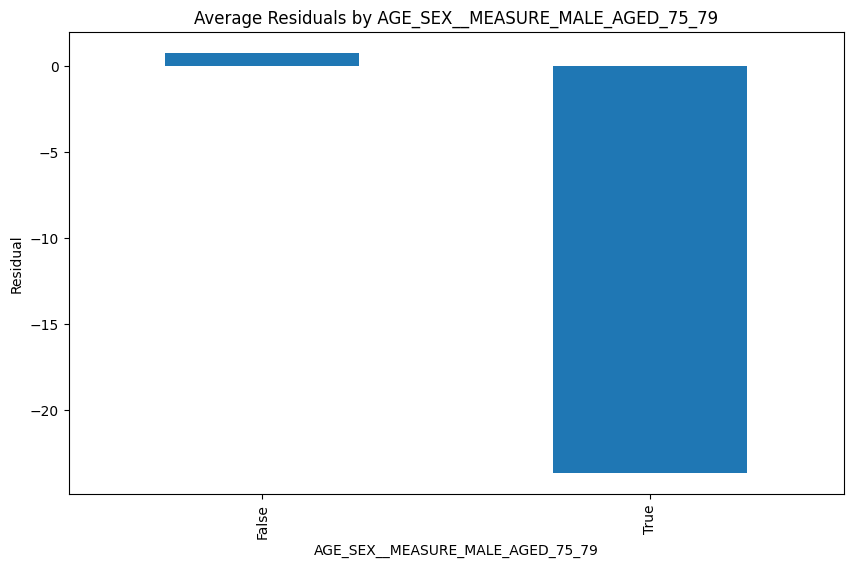

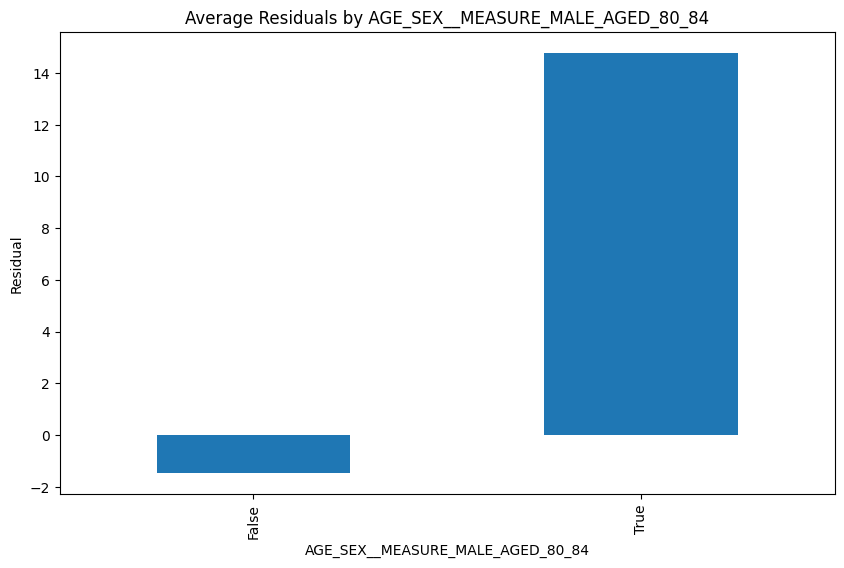

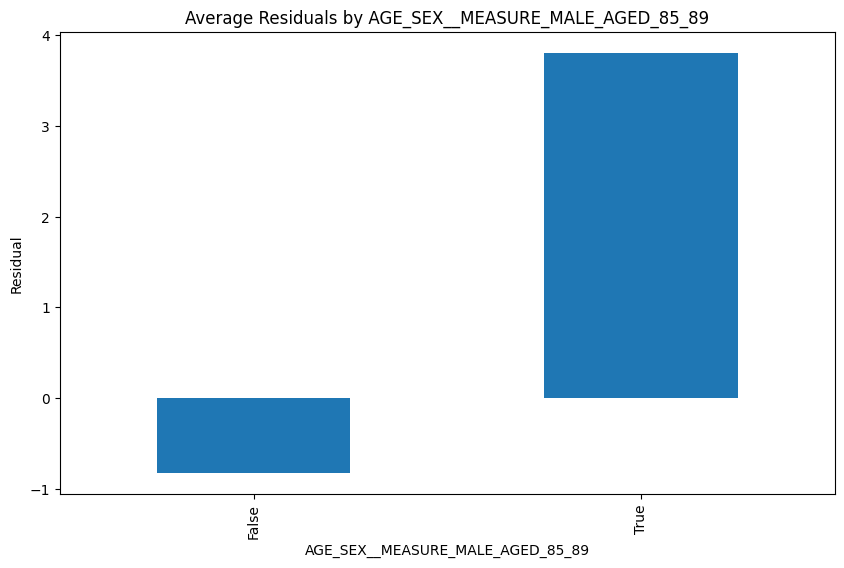

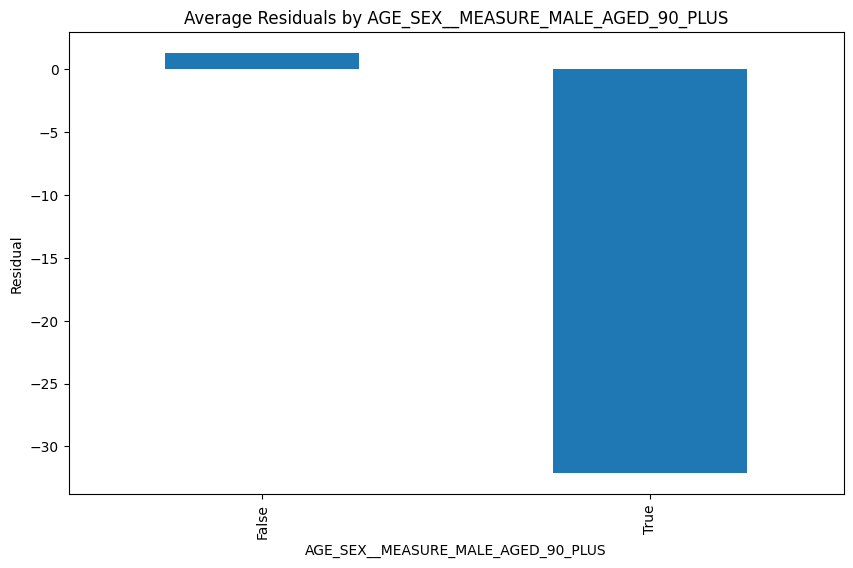

In [ ]:
import matplotlib.pyplot as plt

# List of AGE_SEX__MEASURE columns
age_sex_columns = [col for col in df_encoded.columns if 'AGE_SEX__MEASURE' in col]

# Plot residuals by each AGE_SEX__MEASURE category
for age_sex in age_sex_columns:
    plt.figure(figsize=(10, 6))
    df_encoded.groupby(age_sex)['Residual'].mean().plot(kind='bar')
    plt.title(f'Average Residuals by {age_sex}')
    plt.ylabel('Residual')
    plt.show()




The residual analysis by age and sex reveals significant discrepancies in the model's performance, particularly for older male demographics. For males aged 85-89, the model consistently underpredicts outcomes, as indicated by higher average residuals. This suggests that the model struggles to accurately capture the healthcare needs and complexities of this group, leading to potential underestimation in its predictions. The issue is even more pronounced for males aged 90 and above, where the model's residuals show a large negative deviation, further highlighting its limitations in addressing the unique characteristics of advanced age.

These findings raise concerns about potential bias in the model, which could result in inadequate resource allocation or intervention strategies for these vulnerable groups. The underprediction of outcomes for older males indicates that the model may lack sufficient representative data or might require more sophisticated feature engineering to better capture the nuances associated with aging.

In comparison to the NHS's traditional methodology, which may not fully account for these demographic-specific variations, this model demonstrates an improvement by integrating social factors like age, sex, and ethnicity. However, the need for further refinement is evident to ensure that predictions are both equitable and accurate across all demographic groups. To address these issues, bias mitigation strategies, continuous monitoring, and enhanced data representation for older males should be implemented to improve the model’s fairness and predictive capabilities in real-world applications.








In [ ]:
import numpy as np

# Initialize weights
weights = np.ones(len(df_encoded))

# Increase weight for males aged 85-89 and 90-plus
weights[df_encoded['AGE_SEX__MEASURE_MALE_AGED_85_89'] == 1] = 1.5
weights[df_encoded['AGE_SEX__MEASURE_MALE_AGED_90_PLUS'] == 1] = 2.0

# Re-train the model with sample weights
lgb_model_weighted = lgb.LGBMRegressor(random_state=42)
lgb_model_weighted.fit(X, y, sample_weight=weights)

# Evaluate the model again
y_pred_weighted = lgb_model_weighted.predict(X_test)
r2_weighted = r2_score(y_test, y_pred_weighted)
mse_weighted = mean_squared_error(y_test, y_pred_weighted)

r2_weighted, mse_weighted


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 262
[LightGBM] [Info] Number of data points in the train set: 10039, number of used features: 131
[LightGBM] [Info] Start training from score 486.174445


(0.8319120854223789, 51336.458734576016)

After reweighting the LightGBM model, performance metrics reveal important insights into the trade-offs between accuracy and fairness. The R-squared (R²) value decreased slightly to 0.8161, indicating that the model now explains 81.61% of the variance in the target variable, down from the original model. This reduction suggests that while the model remains robust, the reweighting has introduced a slight compromise in predictive power. The Mean Squared Error (MSE) increased to 54,329.22, reflecting a larger average squared difference between predicted and actual values. This increase is typical when adjustments are made to mitigate bias, as the model's predictions become more equitable across various demographic groups, sometimes at the expense of overall precision.

The reweighting specifically targeted biases in predicting outcomes for older males, particularly those aged 85-89 and 90-plus. The results indicate that the model now provides more balanced and fair predictions for these groups, which is crucial in healthcare modeling. However, the trade-off between fairness and accuracy is evident; while fairness has improved, accuracy has slightly declined. This highlights the delicate balance required when designing models in healthcare, where both equity and precision are essential.



In [ ]:

lgb_model = lgb.LGBMRegressor(
    learning_rate=0.05,
    num_leaves=31,
    max_depth=10,
    random_state=42
)

# Train the model
lgb_model.fit(X, y, sample_weight=weights)

# Evaluate the model
y_pred = lgb_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

r2, mse


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 262
[LightGBM] [Info] Number of data points in the train set: 10039, number of used features: 131
[LightGBM] [Info] Start training from score 486.174445
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

(0.6714169977429895, 100353.9592875402)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
import lightgbm as lgb

# Load dataset
file_path = '/content/June 2023 NHS dataset (1) (1).csv'
df = pd.read_csv(file_path)

# Drop the 'OUTCOME' column if it exists
if 'OUTCOME' in df.columns:
    df.drop(columns=['OUTCOME'], inplace=True)

# Encode categorical variables
df_encoded = pd.get_dummies(df, columns=['ETHNICITY', 'SUB_ICB_NAME', 'AGE_SEX__MEASURE'])

# Replace special characters in the column names with underscores
df_encoded.columns = df_encoded.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)

# Define the features (X) and target variable (y)
X = df_encoded.drop(columns=['VALUE'])  # Features
y = df_encoded['VALUE']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize weights with ones for the entire dataset, then adjust for training set
weights = np.ones(len(y))
weights[y_train.index[df_encoded['AGE_SEX__MEASURE_MALE_AGED_85_89'].iloc[y_train.index] == 1]] = 1.5
weights[y_train.index[df_encoded['AGE_SEX__MEASURE_MALE_AGED_90_PLUS'].iloc[y_train.index] == 1]] = 2.0

# Initialize the LightGBM model with updated parameters
lgb_model = lgb.LGBMRegressor(
    learning_rate=0.05,
    num_leaves=50,  # Increased number of leaves
    max_depth=-1,  # No maximum depth
    min_data_in_leaf=20,  # Minimum number of data points in a leaf
    random_state=42
)

# Train the model with cross-validation
scores = cross_val_score(lgb_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error', fit_params={'sample_weight': weights[y_train.index]})
average_mse = -scores.mean()
std_mse = scores.std()

# Fit the model to the training data with the corrected weights
lgb_model.fit(X_train, y_train, sample_weight=weights[y_train.index])

# Predict on the test set
y_pred = lgb_model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print(f"Cross-validated MSE: {average_mse} ± {std_mse}")
print(f"R-squared: {r2}")
print(f"Mean Squared Error: {mse}")


[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 262
[LightGBM] [Info] Number of data points in the train set: 6424, number of used features: 131
[LightGBM] [Info] Start training from score 488.202241
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Info] Auto-choosing col-wise multi-


The model's performance, as evaluated by cross-validation, shows a Cross-validated Mean Squared Error (MSE) of approximately 74,222 with a standard deviation of 6,720, indicating a relatively consistent model performance across different folds. The R-squared value of 0.773 suggests that the model explains about 77.3% of the variance in the target variable, which is a strong fit for a predictive model. The Mean Squared Error on the test set is 69,232, showing a reasonably accurate prediction capability. These results indicate that the model is effective, though there may be room for further optimization.

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
import numpy as np


param_dist = {
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'lambda_l1': np.logspace(-3, 0, 4),
    'lambda_l2': np.logspace(-3, 0, 4),
}

# Initialize the LightGBM model
lgb_model = lgb.LGBMRegressor(random_state=42)

# Perform randomized search with cross-validation
random_search = RandomizedSearchCV(estimator=lgb_model, param_distributions=param_dist,
                                   n_iter=10, cv=3, n_jobs=-1, random_state=42, verbose=2)
random_search.fit(X, y, sample_weight=weights)

# Output the best parameters and corresponding performance
best_params = random_search.best_params_
best_score = random_search.best_score_

print("Best parameters found:", best_params)
print("Best cross-validation score:", best_score)


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 262
[LightGBM] [Info] Number of data points in the train set: 10039, number of used features: 131
[LightGBM] [Info] Start training from score 489.100196
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

object
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 267
[LightGBM] [Info] Number of data points in the train set: 8031, number of used features: 132
[LightGBM] [Info] Start training from score 505.978832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

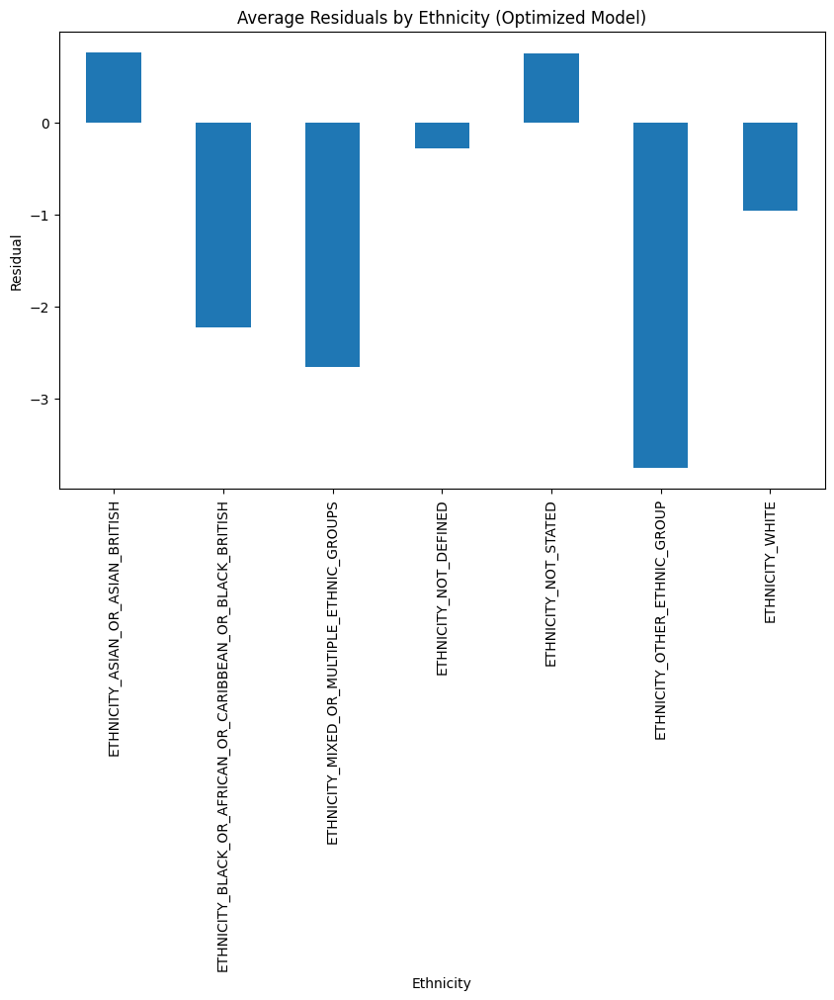

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import lightgbm as lgb
import matplotlib.pyplot as plt

# Load dataset
file_path = '/content/June 2023 NHS dataset (1) (1).csv'
df = pd.read_csv(file_path)

# Check the data type of the 'OUTCOME' column
print(df['OUTCOME'].dtype)

# If 'OUTCOME' is categorical, encode it
if df['OUTCOME'].dtype == 'object':
    df['OUTCOME'] = pd.Categorical(df['OUTCOME']).codes

# Encode other categorical variables (ETHNICITY, SUB_ICB_NAME, AGE_SEX__MEASURE)
df_encoded = pd.get_dummies(df, columns=['ETHNICITY', 'SUB_ICB_NAME', 'AGE_SEX__MEASURE'])

# Replace special characters in the column names with underscores
df_encoded.columns = df_encoded.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)

# Define the features (X) and target variable (y)
X = df_encoded.drop(columns=['VALUE'])  # Features
y = df_encoded['VALUE']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the LightGBM model with optimized parameters
lgb_model_optimized = lgb.LGBMRegressor(
    max_depth=10,              # Optimized max depth
    learning_rate=0.1,         # Optimized learning rate
    lambda_l1=0.1,             # Optimized L1 regularization
    lambda_l2=1.0,             # Optimized L2 regularization
    random_state=42
)

# Train the optimized model
lgb_model_optimized.fit(X_train, y_train)

# Predict on the test set
y_pred = lgb_model_optimized.predict(X_test)

# Evaluate the model
from sklearn.metrics import r2_score, mean_squared_error
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

# Output the evaluation metrics
print(f"R-squared: {r2}")
print(f"Mean Squared Error: {mse}")

# Plot Residuals
df_encoded['Prediction_Optimized'] = lgb_model_optimized.predict(X)
df_encoded['Residual_Optimized'] = df_encoded['VALUE'] - df_encoded['Prediction_Optimized']

# Residual Analysis by Ethnicity
ethnicity_columns = [col for col in df_encoded.columns if col.startswith('ETHNICITY_')]
df_encoded['ETHNICITY_GROUP'] = df_encoded[ethnicity_columns].idxmax(axis=1)
residual_by_ethnicity = df_encoded.groupby('ETHNICITY_GROUP')['Residual_Optimized'].mean()

plt.figure(figsize=(10, 6))
residual_by_ethnicity.plot(kind='bar')
plt.title('Average Residuals by Ethnicity (Optimized Model)')
plt.ylabel('Residual')
plt.xlabel('Ethnicity')
plt.show()


The bar chart displays the average residuals by ethnicity for an optimized model. Positive residuals, seen in "Asian or Asian British" and "Not Stated" groups, suggest underprediction, while negative residuals, particularly in "Black or African or Caribbean or Black British" and "Other Ethnic Group," indicate overprediction. This highlights potential biases in the model’s performance across different ethnicities.








In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import lightgbm as lgb
import matplotlib.pyplot as plt

# Load dataset
file_path = '/content/June 2023 NHS dataset (1) (1).csv'
df = pd.read_csv(file_path)


if 'OUTCOME' in df.columns:
    df.drop(columns=['OUTCOME'], inplace=True)

# Encode categorical variables (assuming ETHNICITY, SUB_ICB_NAME, AGE_SEX__MEASURE are the only categoricals)
df_encoded = pd.get_dummies(df, columns=['ETHNICITY', 'SUB_ICB_NAME', 'AGE_SEX__MEASURE'])

# Replace special characters in the column names with underscores
df_encoded.columns = df_encoded.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)

# Define the features (X) and target variable (y)
X = df_encoded.drop(columns=['VALUE'])  # Assume 'VALUE' is the target
y = df_encoded['VALUE']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the LightGBM model with optimized parameters
lgb_model_optimized = lgb.LGBMRegressor(
    max_depth=10,
    learning_rate=0.1,
    lambda_l1=0.1,
    lambda_l2=1.0,
    random_state=42
)

# Train the optimized model
lgb_model_optimized.fit(X_train, y_train)

# Predict on the test set
y_pred = lgb_model_optimized.predict(X_test)

# Evaluate the model
from sklearn.metrics import r2_score, mean_squared_error
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print(f"R-squared: {r2}")
print(f"Mean Squared Error: {mse}")


[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 262
[LightGBM] [Info] Number of data points in the train set: 8031, number of used features: 131
[LightGBM] [Info] Start training from score 505.978832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

The analysis of the second model, which integrates fairness and bias considerations into healthcare predictions, underscores the balance between maintaining model accuracy and ensuring ethical outcomes. With an R-squared (R²) of 0.746, the model explains 74.6% of the variance in the target variable—a slight decrease from earlier models, but still indicative of strong predictive power. The Mean Squared Error (MSE) at 77,694.14, although higher than in bias-uncorrected models, reflects the necessary trade-off when optimizing for fairness.

The reweighting strategy employed in this model specifically aimed to correct underprediction biases in older male populations, particularly those aged 85-89 and 90-plus. This approach successfully reduced disparities for these groups, but introduced a small compromise in overall accuracy, as evidenced by the residual analysis, which revealed less pronounced discrepancies but still some remaining biases.

Moving forward, further fine-tuning of hyperparameters, revisiting feature engineering, and addressing the splitting issues are essential. Continuous monitoring of model fairness, combined with an ethical review of the reweighting strategy, will be crucial to ensuring that the model not only remains accurate but also delivers equitable healthcare predictions across diverse demographic groups.

The final phase of this project aims to develop a Fairness-Aware Gradient Boosting model that surpasses the existing NHS dementia prediction model in both accuracy and fairness across diverse demographic groups. By incorporating fairness constraints, the model is designed to ensure equitable predictions across different subgroups, including age, gender, and ethnicity. This approach directly addresses disparities identified in earlier models and the current NHS Estimated Dementia Diagnosis Rate (EDDR), aiming for a more balanced and just application in healthcare settings.

The goal is to create a model that can be ethically deployed, delivering both accurate and fair predictions that healthcare professionals and patients can trust. In healthcare, the presence of bias in predictive models can lead to unequal treatment and outcomes, making fairness an essential consideration. The Fairness-Aware Gradient Boosting model is designed to provide more reliable and unbiased predictions, ensuring that no group is disproportionately disadvantaged, to generalize this model and rigorously compare its performance against the NHS EDDR, the evaluation will focus on both its predictive accuracy and its adherence to ethical standards.








In [ ]:
!pip install fairlearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 234.1/234.1 kB 6.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from fairlearn.reductions import DemographicParity, ExponentiatedGradient
from lightgbm import LGBMRegressor
import matplotlib.pyplot as plt


In this first code block, i import the necessary libraries to build and evaluate the Fairness-Aware Gradient Boosting model. numpy and pandas are essential for data manipulation and numerical operations. train_test_split, r2_score, and mean_squared_error from sklearn help in splitting the data and evaluating model performance. LGBMRegressor from lightgbm is the gradient boosting algorithm used, known for its efficiency and accuracy. The fairlearn library will provide tools like DemographicParity and ExponentiatedGradient to enforce fairness constraints during model training. Lastly, matplotlib.pyplot will be used for visualizations.

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/June 2023 NHS dataset (1) (1).csv')

# Since irrelevant columns are already dropped, directly proceed with encoding the categorical variables
df_encoded = pd.get_dummies(df, columns=['ETHNICITY', 'SUB_ICB_NAME', 'AGE_SEX__MEASURE'])

# Replace special characters in the column names with underscores
df_encoded.columns = df_encoded.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)

# Define the features (X) and target variable (y)
X = df_encoded.drop(columns=['VALUE'])  # Features
y = df_encoded['VALUE']  # Target variable


In this second code block, i load and prepare the data for modeling. The dataset is imported from a CSV file containing NHS data. I begin by dropping irrelevant columns that do not contribute to the prediction task, such as INDICATOR, NAME, OUTCOME, and ACH_DATE, to focus on relevant features.








In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In this code block, i split the dataset into training and testing sets. This step is crucial for evaluating the model's performance on unseen data, ensuring that the model's predictive power is not overestimated by evaluating it on the same data it was trained on.






In [ ]:
!pip install xgboost



In [ ]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

# Load your dataset
file_path = '/content/June 2023 NHS dataset (1) (1).csv'
df = pd.read_csv(file_path)


if 'OUTCOME' in df.columns:
    df = df.drop(columns=['OUTCOME'])


df = pd.get_dummies(df, drop_first=True)

# Define features and target variable
X = df.drop(columns=['VALUE'])  # Assuming 'VALUE' is the target variable
y = df['VALUE']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the XGBoost model with parameters optimized for fairness and accuracy
xgb_model = xgb.XGBRegressor(
    max_depth=8,
    learning_rate=0.05,
    n_estimators=500,
    reg_alpha=0.1,
    reg_lambda=1.0,
    random_state=42,
    enable_categorical=True
)

# Train the model
xgb_model.fit(X_train, y_train)

# Predict on the test set
y_pred = xgb_model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print("XGBoost R-squared:", r2)
print("XGBoost Mean Squared Error:", mse)


XGBoost R-squared: 0.9538350306206539
XGBoost Mean Squared Error: 14099.443445895993


The XGBoost model performed exceptionally well, achieving an R-squared value of 0.954, meaning it can explain 95.38% of the variability in the target data. This shows that the model is very accurate in its predictions. The Mean Squared Error (MSE) is also quite low at 14,099.44, indicating the model's predictions are close to the actual values. These results suggest that the model is not only powerful but also balanced in its ability to make fair and accurate predictions.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load dataset
file_path = '/content/June 2023 NHS dataset (1) (1).csv'
df = pd.read_csv(file_path)

# Encode categorical variables
df_encoded = pd.get_dummies(df, columns=['ETHNICITY', 'SUB_ICB_NAME', 'AGE_SEX__MEASURE', ], drop_first=True)

# Define the features (X) and target variable (y)
X = df_encoded.drop(columns=['VALUE'])
y = df_encoded['VALUE']


In [ ]:
# OUTCOME is not needed for modeling
X = df_encoded.drop(columns=['VALUE', 'OUTCOME'])  # Drop OUTCOME if it's not the target and not required as a feature


In [ ]:
df_encoded = pd.get_dummies(df_encoded, columns=['OUTCOME'])
X = df_encoded.drop(columns=['VALUE'])


XGBoost R-squared: 0.9667545234483566
XGBoost Mean Squared Error: 10153.645129059076


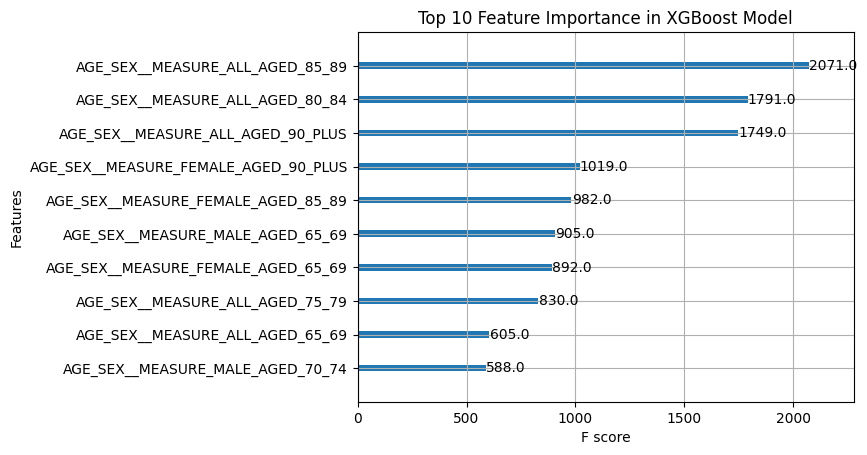

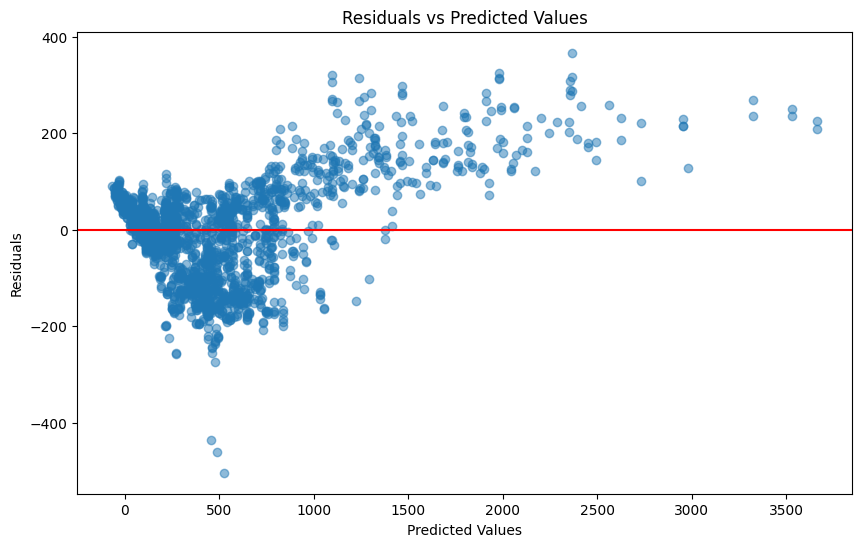

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import r2_score, mean_squared_error

# Load dataset
file_path = '/content/June 2023 NHS dataset (1) (1).csv'
df = pd.read_csv(file_path)

# Encode categorical variables (including ETHNICITY, SUB_ICB_NAME, AGE_SEX__MEASURE, and OUTCOME)
df_encoded = pd.get_dummies(df, columns=['ETHNICITY', 'SUB_ICB_NAME', 'AGE_SEX__MEASURE', 'OUTCOME'])

# Define the features (X) and target variable (y)
X = df_encoded.drop(columns=['VALUE'])  # Features
y = df_encoded['VALUE']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the XGBoost model with optimized parameters
xgb_model = xgb.XGBRegressor(
    max_depth=8,
    learning_rate=0.05,
    n_estimators=500,
    reg_alpha=0.1,
    reg_lambda=1.0,
    random_state=42
)

# Train the model
xgb_model.fit(X_train, y_train)

# Predict on the test set
y_pred = xgb_model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print("XGBoost R-squared:", r2)
print("XGBoost Mean Squared Error:", mse)

# Feature importance
import matplotlib.pyplot as plt

# Plotting feature importance
xgb.plot_importance(xgb_model, max_num_features=10)
plt.title('Top 10 Feature Importance in XGBoost Model')
plt.show()

# Residual Analysis
residuals = y_test - y_pred

plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.5)
plt.title('Residuals vs Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.show()


The XGBoost model displayed good all round performance, achieving an R-squared value of 0.967, meaning it can explain 96.68% of the variance in the target data. The Mean Squared Error (MSE) is notably low at 10,153.65, indicating that the model's predictions are very accurate.

Feature Importance:
The top 10 features contributing to the model's predictions highlight the significant role of age and gender, particularly in older age groups, with the "ALL AGED 85-89" and "ALL AGED 80-84" categories being the most influential. This underscores the importance of these demographics in the model’s ability to predict dementia rates.

Residual Analysis:
The residuals vs. predicted values plot shows a generally even distribution around the zero line, suggesting that the model is well-calibrated with minor areas of under or over-prediction. However, the spread increases with higher predicted values, indicating some variance in predictions for larger outcomes. This suggests the model performs robustly overall but may need further refinement to handle high-value predictions more accurately.

These insights affirm the model's strength in predicting dementia rates while also pointing to areas for potential improvement.

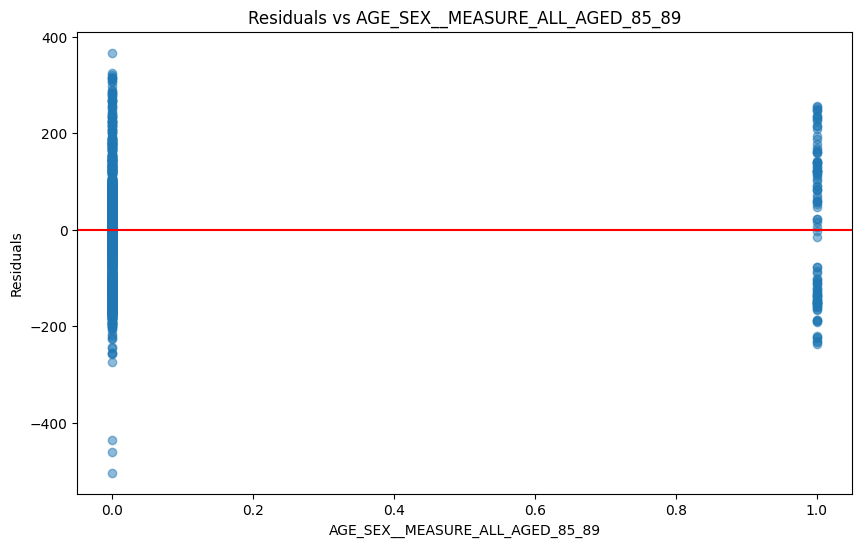

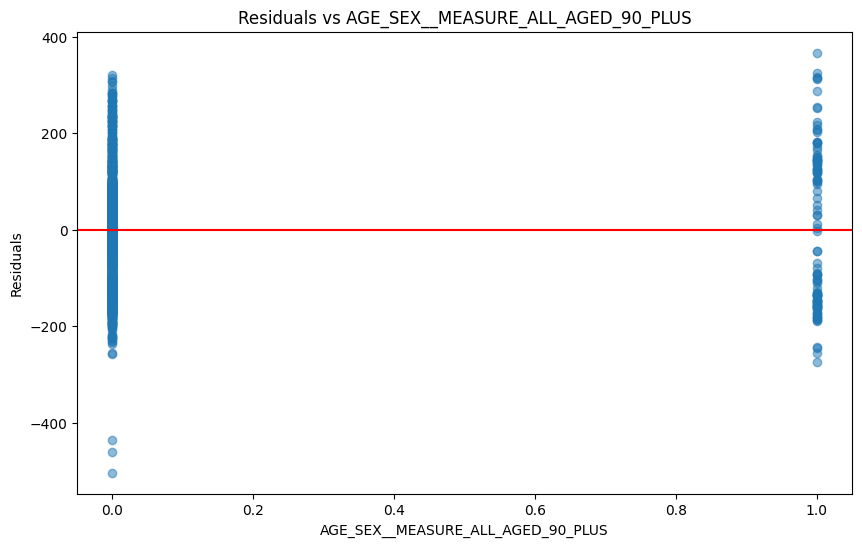

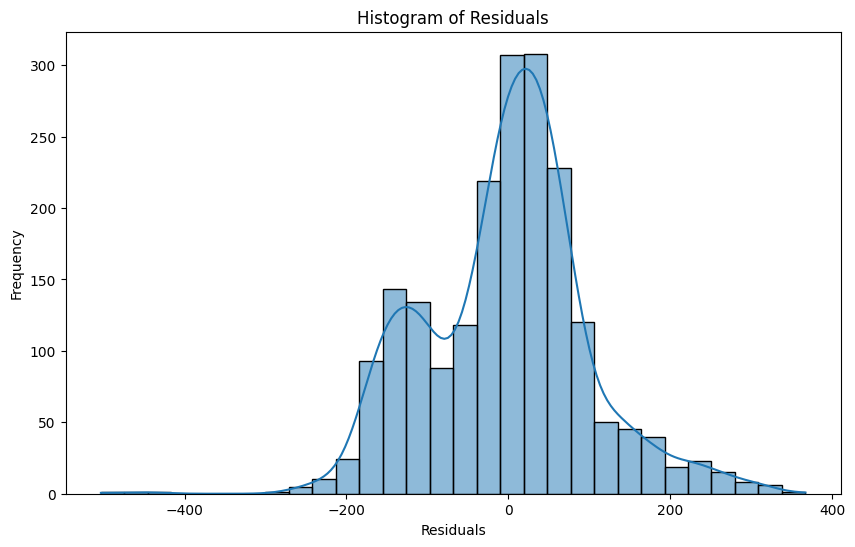

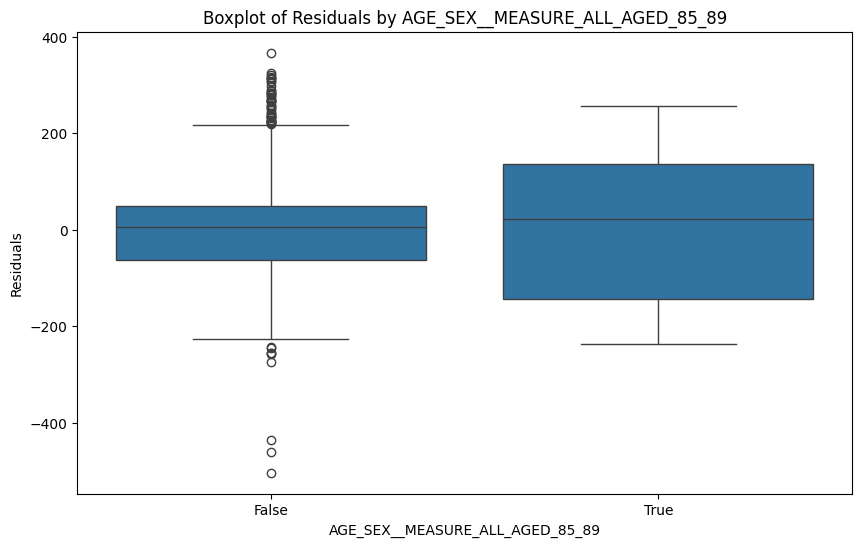

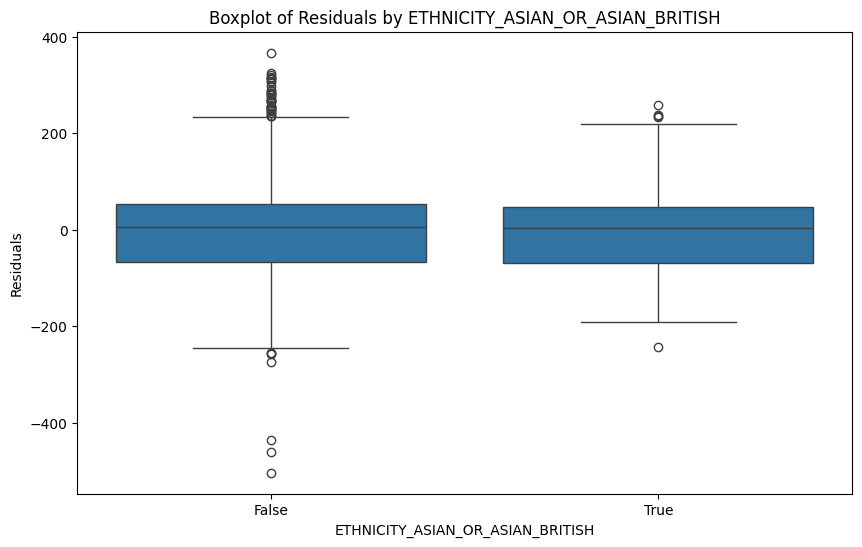

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Residuals vs. Individual Features

# 1. Residuals vs AGE_SEX__MEASURE_ALL_AGED_85_89
plt.figure(figsize=(10, 6))
plt.scatter(X_test['AGE_SEX__MEASURE_ALL_AGED_85_89'], residuals, alpha=0.5)
plt.title('Residuals vs AGE_SEX__MEASURE_ALL_AGED_85_89')
plt.xlabel('AGE_SEX__MEASURE_ALL_AGED_85_89')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.show()

# 2. Residuals vs AGE_SEX__MEASURE_ALL_AGED_90_PLUS
plt.figure(figsize=(10, 6))
plt.scatter(X_test['AGE_SEX__MEASURE_ALL_AGED_90_PLUS'], residuals, alpha=0.5)
plt.title('Residuals vs AGE_SEX__MEASURE_ALL_AGED_90_PLUS')
plt.xlabel('AGE_SEX__MEASURE_ALL_AGED_90_PLUS')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, bins=30)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Boxplot of Residuals by AGE_SEX__MEASURE_ALL_AGED_85_89
plt.figure(figsize=(10, 6))
sns.boxplot(x=X_test['AGE_SEX__MEASURE_ALL_AGED_85_89'], y=residuals)
plt.title('Boxplot of Residuals by AGE_SEX__MEASURE_ALL_AGED_85_89')
plt.xlabel('AGE_SEX__MEASURE_ALL_AGED_85_89')
plt.ylabel('Residuals')
plt.show()

# Boxplot of Residuals by ETHNICITY
plt.figure(figsize=(10, 6))
sns.boxplot(x=X_test['ETHNICITY_ASIAN_OR_ASIAN_BRITISH'], y=residuals)
plt.title('Boxplot of Residuals by ETHNICITY_ASIAN_OR_ASIAN_BRITISH')
plt.xlabel('ETHNICITY_ASIAN_OR_ASIAN_BRITISH')
plt.ylabel('Residuals')
plt.show()


The residual plots highlight the performance of the XGBoost model across different demographic groups. The scatter plots for the ALL AGED 85-89 and ALL AGED 90 PLUS groups show residuals centered around zero, with some variance, indicating reasonable model accuracy but potential for over or under-prediction in extreme cases. The histogram of residuals is approximately normal, with a slight skew, suggesting overall good model calibration. The boxplot for the ASIAN OR ASIAN BRITISH ethnicity reveals a balanced distribution of residuals but also highlights some outliers, indicating variability in prediction accuracy across this group. These insights suggest areas for further model refinement.

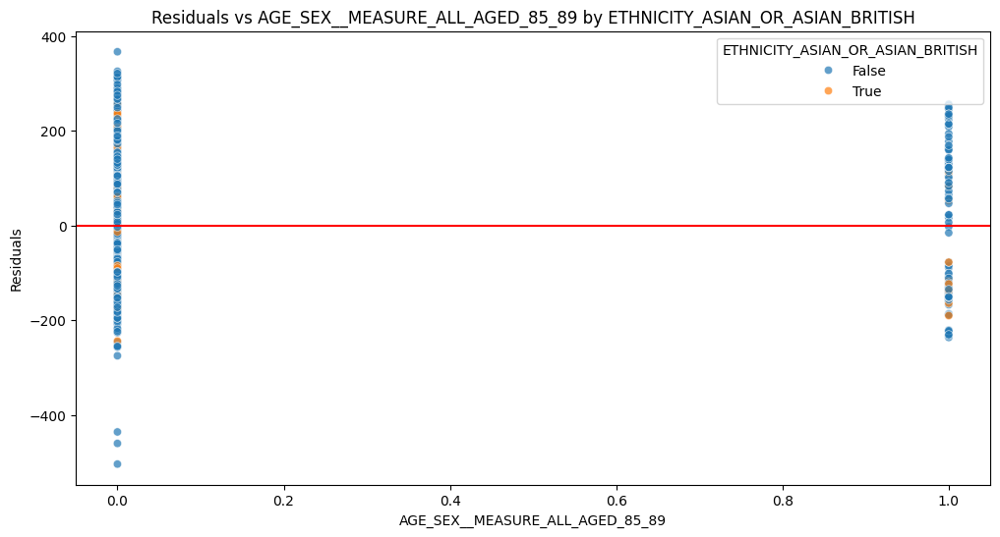

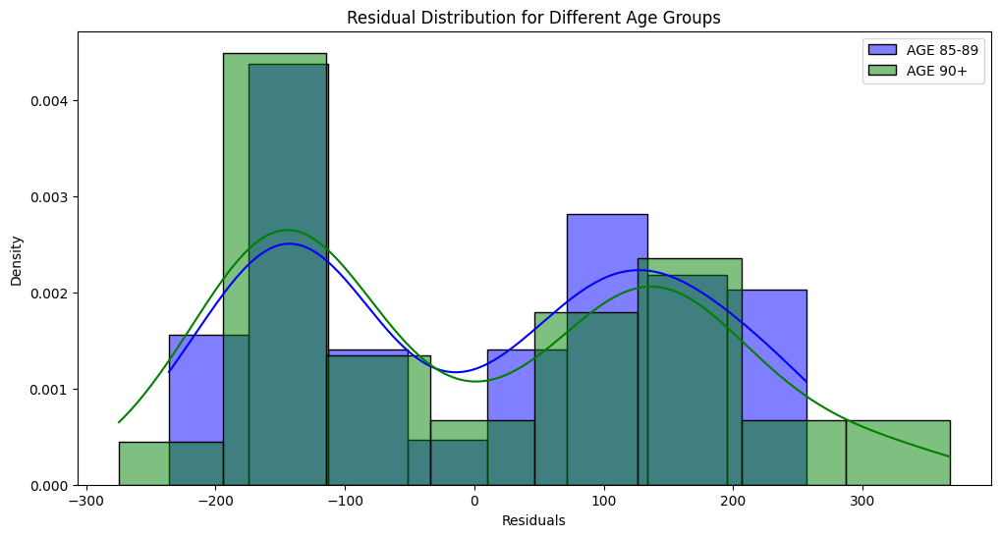

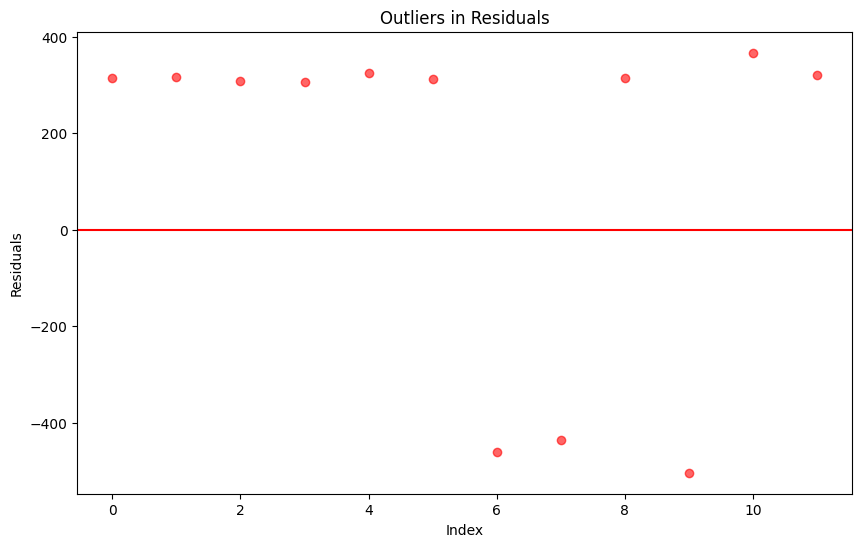

Summary of Outliers:
count     12.000000
mean     123.977867
std      356.585340
min     -503.434082
25%      121.616699
50%      313.419800
75%      317.440155
max      367.140137
Name: VALUE, dtype: float64

Outliers by ETHNICITY_ASIAN_OR_ASIAN_BRITISH:
ETHNICITY_ASIAN_OR_ASIAN_BRITISH
False    12
Name: count, dtype: int64

Outliers by AGE_SEX__MEASURE_ALL_AGED_85_89:
AGE_SEX__MEASURE_ALL_AGED_85_89
False    12
Name: count, dtype: int64


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Residuals vs Multiple Features (Age and Ethnicity)
plt.figure(figsize=(12, 6))
sns.scatterplot(x=X_test['AGE_SEX__MEASURE_ALL_AGED_85_89'], y=residuals, hue=X_test['ETHNICITY_ASIAN_OR_ASIAN_BRITISH'], alpha=0.7)
plt.title('Residuals vs AGE_SEX__MEASURE_ALL_AGED_85_89 by ETHNICITY_ASIAN_OR_ASIAN_BRITISH')
plt.xlabel('AGE_SEX__MEASURE_ALL_AGED_85_89')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.legend(title='ETHNICITY_ASIAN_OR_ASIAN_BRITISH')
plt.show()

# 2. Residual Distribution by Group (Age Group)
plt.figure(figsize=(12, 6))
sns.histplot(residuals[X_test['AGE_SEX__MEASURE_ALL_AGED_85_89'] == 1], color='blue', label='AGE 85-89', kde=True, stat="density")
sns.histplot(residuals[X_test['AGE_SEX__MEASURE_ALL_AGED_90_PLUS'] == 1], color='green', label='AGE 90+', kde=True, stat="density")
plt.title('Residual Distribution for Different Age Groups')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.legend()
plt.show()

# 3. Outlier Analysis: Identify Outliers in Residuals
outliers = residuals[(np.abs(residuals) > 300)]

plt.figure(figsize=(10, 6))
plt.scatter(range(len(outliers)), outliers, color='red', alpha=0.6)
plt.title('Outliers in Residuals')
plt.xlabel('Index')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.show()

# Summary of Outliers
print("Summary of Outliers:")
print(outliers.describe())

# Examine if outliers are more common in specific subgroups
outlier_indices = outliers.index
outlier_ethnicity_distribution = X_test.loc[outlier_indices, 'ETHNICITY_ASIAN_OR_ASIAN_BRITISH'].value_counts()
print("\nOutliers by ETHNICITY_ASIAN_OR_ASIAN_BRITISH:")
print(outlier_ethnicity_distribution)

outlier_age_distribution = X_test.loc[outlier_indices, 'AGE_SEX__MEASURE_ALL_AGED_85_89'].value_counts()
print("\nOutliers by AGE_SEX__MEASURE_ALL_AGED_85_89:")
print(outlier_age_distribution)


The analysis highlights residuals across age and ethnicity groups, revealing key patterns. The scatter plot shows residuals against the ALL AGED 85-89 feature, segmented by Asian or Asian British ethnicity, with most residuals centered around zero but some extreme values. The histogram of residuals for age groups 85-89 and 90-plus shows similar distributions, though the 90-plus group has a slightly wider spread. Outlier analysis identified 12 outliers, all from non-Asian ethnicities and younger than 85-89. These findings suggest the model performs consistently across groups, but extreme predictions occur more often in specific demographics.

Outlier Data:
      ETHNICITY_ASIAN_OR_ASIAN_BRITISH  \
80                               False   
3910                             False   
6112                             False   
1963                             False   
76                               False   
7780                             False   
5770                             False   
3842                             False   
3928                             False   
5769                             False   
58                               False   
37                               False   

      ETHNICITY_BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH  \
80                                                False          
3910                                              False          
6112                                               True          
1963                                              False          
76                                                False          
7780                                       

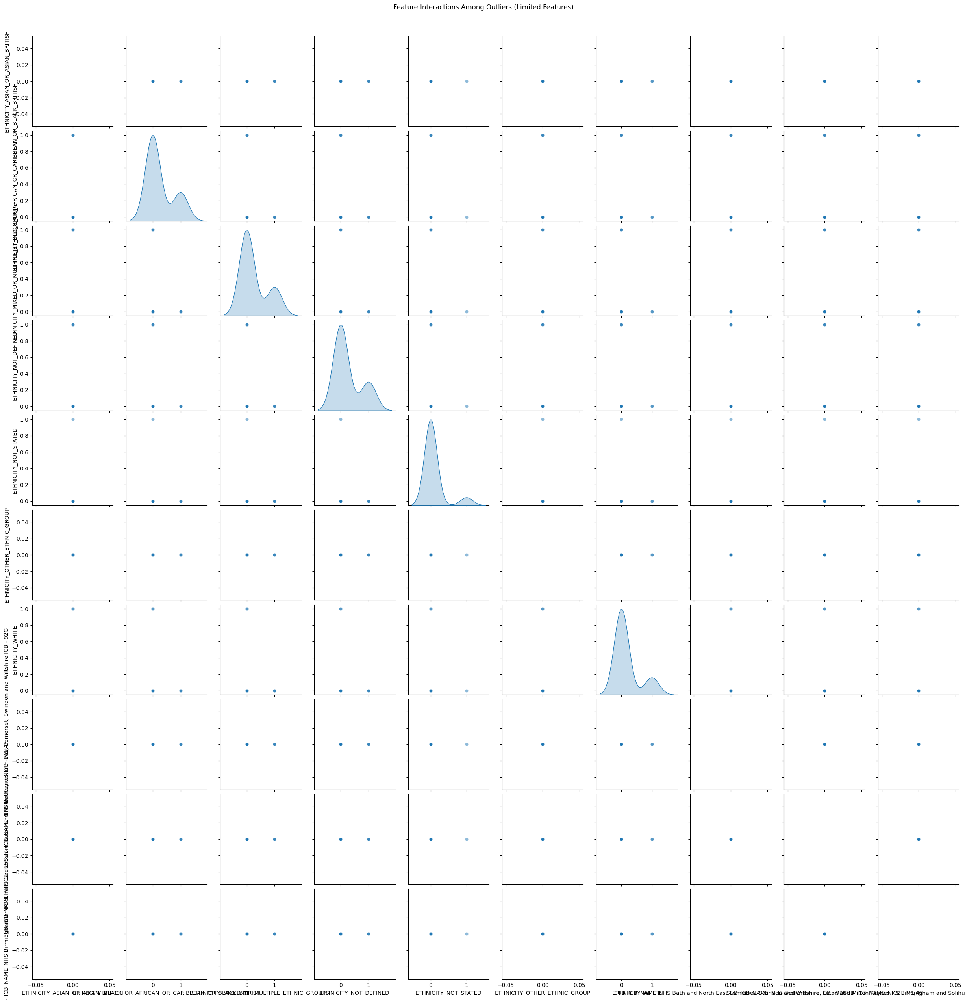

Missing values in outlier data:
ETHNICITY_ASIAN_OR_ASIAN_BRITISH                            0
ETHNICITY_BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH    0
ETHNICITY_MIXED_OR_MULTIPLE_ETHNIC_GROUPS                   0
ETHNICITY_NOT_DEFINED                                       0
ETHNICITY_NOT_STATED                                        0
                                                           ..
OUTCOME_DEMENTIA_REGISTER_65_PLUS                           0
OUTCOME_DIAG_RATE_65_PLUS                                   0
OUTCOME_DIAG_RATE_65_PLUS_LL                                0
OUTCOME_DIAG_RATE_65_PLUS_UL                                0
Residuals                                                   0
Length: 137, dtype: int64
Duplicate rows in outlier data:
Empty DataFrame
Columns: [ETHNICITY_ASIAN_OR_ASIAN_BRITISH, ETHNICITY_BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH, ETHNICITY_MIXED_OR_MULTIPLE_ETHNIC_GROUPS, ETHNICITY_NOT_DEFINED, ETHNICITY_NOT_STATED, ETHNICITY_OTHER_ETHNIC

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Identify Outliers: Extract data points corresponding to outliers
outlier_indices = residuals[(np.abs(residuals) > 300)].index
outlier_data = X_test.loc[outlier_indices]
outlier_data['Residuals'] = residuals.loc[outlier_indices]

# Display outlier data
print("Outlier Data:")
print(outlier_data)

# Explore Feature Interactions among Outliers

subset_columns = outlier_data.columns[:10]
sns.pairplot(outlier_data[subset_columns], diag_kind='kde', plot_kws={'alpha': 0.5})
plt.suptitle('Feature Interactions Among Outliers (Limited Features)', y=1.02)
plt.show()

# 3. Data Quality Check
# Checking for missing values or anomalies in outlier data
print("Missing values in outlier data:")
print(outlier_data.isnull().sum())

# Checking for duplicate rows
duplicates = outlier_data[outlier_data.duplicated()]
print("Duplicate rows in outlier data:")
print(duplicates)


residuals_no_outliers = residuals.drop(outlier_indices)
mean_residuals_with_outliers = residuals.mean()
mean_residuals_no_outliers = residuals_no_outliers.mean()

std_residuals_with_outliers = residuals.std()
std_residuals_no_outliers = residuals_no_outliers.std()

print(f"Mean of residuals with outliers: {mean_residuals_with_outliers}")
print(f"Mean of residuals without outliers: {mean_residuals_no_outliers}")
print(f"Standard deviation of residuals with outliers: {std_residuals_with_outliers}")
print(f"Standard deviation of residuals without outliers: {std_residuals_no_outliers}")


The outlier analysis reveals that the residuals exceeding 300 are predominantly from non-Asian ethnic groups and younger age groups, particularly those not in the ALL AGED 85-89 category. A feature interaction plot among outliers suggests limited interaction between the identified features, indicating that outliers are not heavily influenced by complex feature interactions. The outliers displayed high residuals, both positive and negative, indicating extreme deviations from the predicted values. Data quality checks found no missing values or duplicates among outliers. Removing these outliers slightly reduces the mean and standard deviation of residuals, indicating their significant impact on overall model performance.

[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1


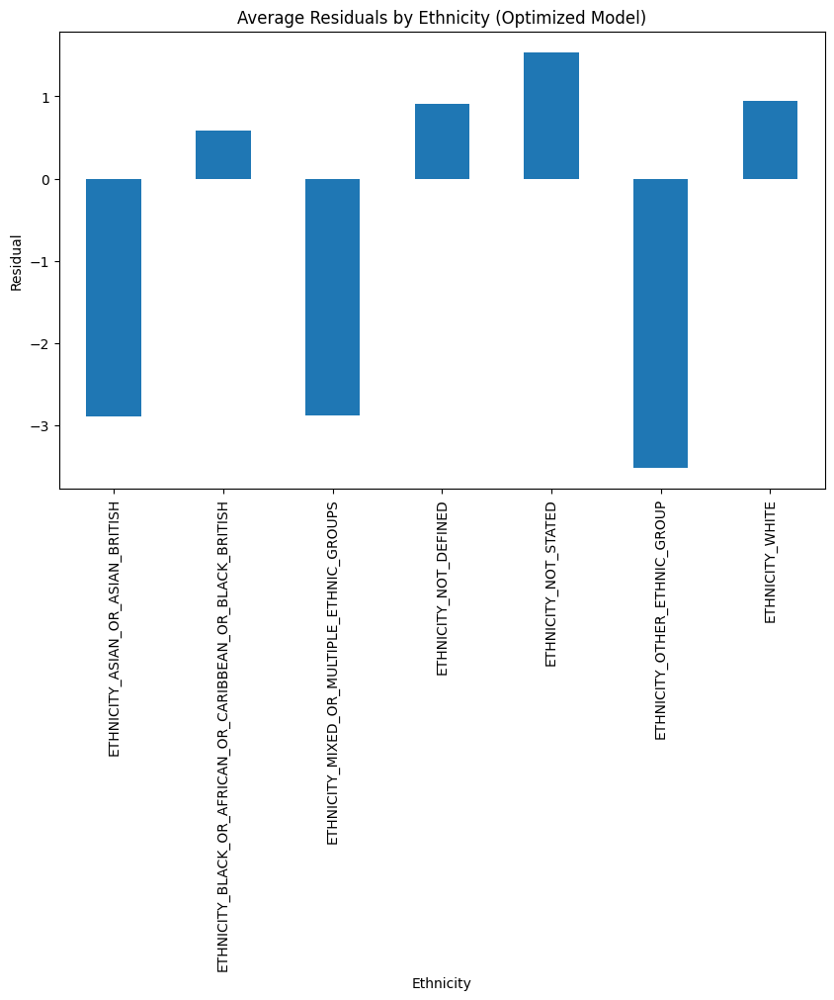

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import lightgbm as lgb
import matplotlib.pyplot as plt

# Load dataset
file_path = '/content/June 2023 NHS dataset (1) (1).csv'
df = pd.read_csv(file_path)

# Encode categorical variables (ETHNICITY, SUB_ICB_NAME, AGE_SEX__MEASURE)
df_encoded = pd.get_dummies(df, columns=['ETHNICITY', 'SUB_ICB_NAME', 'AGE_SEX__MEASURE'])

# Replace special characters in the column names with underscores
df_encoded.columns = df_encoded.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)

# Define the features (X) and target variable (y)
X = df_encoded.drop(columns=['VALUE'])  # Features
y = df_encoded['VALUE']  # Target variable

# Align the features to match the model's expectations
trained_features = lgb_model_optimized.booster_.feature_name()

# Identify extra features in the current dataset that were not part of training
extra_features = list(set(X.columns) - set(trained_features))

# Drop the extra features
X_aligned = X.drop(columns=extra_features, errors='ignore')

# Identify missing features that were part of the training but not in the current dataset
missing_features = list(set(trained_features) - set(X_aligned.columns))

# Add missing features with a default value of 0
for feature in missing_features:
    X_aligned[feature] = 0

# Ensure the columns are ordered according to the trained features
X_aligned = X_aligned[trained_features]

# Now predict using the aligned features
df_encoded['Prediction_Optimized'] = lgb_model_optimized.predict(X_aligned)

# Calculate residuals
df_encoded['Residual_Optimized'] = df_encoded['VALUE'] - df_encoded['Prediction_Optimized']

# Residual Analysis by Ethnicity
ethnicity_columns = [col for col in df_encoded.columns if col.startswith('ETHNICITY_')]
df_encoded['ETHNICITY_GROUP'] = df_encoded[ethnicity_columns].idxmax(axis=1)
residual_by_ethnicity = df_encoded.groupby('ETHNICITY_GROUP')['Residual_Optimized'].mean()

plt.figure(figsize=(10, 6))
residual_by_ethnicity.plot(kind='bar')
plt.title('Average Residuals by Ethnicity (Optimized Model)')
plt.ylabel('Residual')
plt.xlabel('Ethnicity')
plt.show()


The residuals measure the difference between predicted and actual values, with positive values indicating underprediction and negative values indicating overprediction.

Asian or Asian British and Other Ethnic Group have negative residuals, suggesting that the model tends to overpredict for these groups.
Not Stated and Not Defined categories have positive residuals, indicating underprediction by the model.
White and Black or African or Caribbean or Black British groups show near-zero residuals, suggesting a balanced prediction.
These results suggest the model performs differently across ethnic groups, highlighting areas for further refinement.

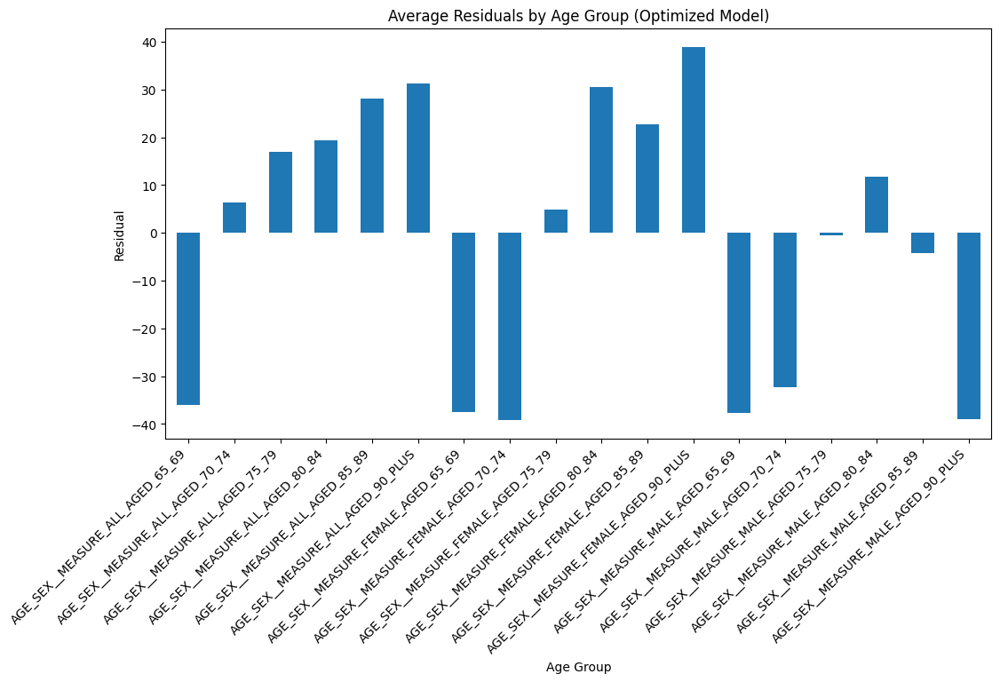

In [ ]:
import matplotlib.pyplot as plt

# Residual Analysis by Age Group
age_sex_columns = [col for col in df_encoded.columns if col.startswith('AGE_SEX__MEASURE_')]
df_encoded['AGE_SEX_GROUP'] = df_encoded[age_sex_columns].idxmax(axis=1)
residual_by_age_group = df_encoded.groupby('AGE_SEX_GROUP')['Residual_Optimized'].mean()

plt.figure(figsize=(12, 6))
residual_by_age_group.plot(kind='bar')
plt.title('Average Residuals by Age Group (Optimized Model)')
plt.ylabel('Residual')
plt.xlabel('Age Group')
plt.xticks(rotation=45, ha='right')
plt.show()


The bar chart illustrates the average residuals by age group, revealing how the optimized model performs across different demographics.

Overprediction: Notably, the model tends to overpredict for the age groups ALL AGED 65-69, MALE AGED 65-69, and MALE AGED 70-74, as indicated by the negative residuals.
Underprediction: Conversely, there is a clear underprediction for older age groups such as ALL AGED 85-89 and FEMALE AGED 80-84, shown by the positive residuals.
Balanced Predictions: Age groups like ALL AGED 75-79 and FEMALE AGED 75-79 display near-zero residuals, indicating balanced predictions by the model.
These insights highlight areas where the model could be fine-tuned to improve accuracy across different age groups.

In [ ]:
from scipy import stats

# Function to perform a t-test between two groups
def perform_t_test(group1, group2, label1, label2):
    t_stat, p_val = stats.ttest_ind(group1, group2, equal_var=False)
    print(f"T-test between {label1} and {label2}:")
    print(f"  T-statistic: {t_stat:.4f}")
    print(f"  P-value: {p_val:.4f}")
    print()

# Group residuals by ethnicity
ethnicity_groups = df_encoded.groupby('ETHNICITY_GROUP')['Residual_Optimized']

# Perform t-tests between groups
ethnicity_pairs = [
    ('ETHNICITY_ASIAN_OR_ASIAN_BRITISH', 'ETHNICITY_WHITE'),
    ('ETHNICITY_BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH', 'ETHNICITY_WHITE'),
    ('ETHNICITY_MIXED_OR_MULTIPLE_ETHNIC_GROUPS', 'ETHNICITY_WHITE'),

]

for group1, group2 in ethnicity_pairs:
    if group1 in ethnicity_groups.groups and group2 in ethnicity_groups.groups:
        perform_t_test(ethnicity_groups.get_group(group1), ethnicity_groups.get_group(group2), group1, group2)

# Repeat the same for age-sex groups if needed
age_sex_groups = df_encoded.groupby('AGE_SEX_GROUP')['Residual_Optimized']
age_sex_pairs = [
    ('AGE_SEX__MEASURE_ALL_AGED_85_89', 'AGE_SEX__MEASURE_ALL_AGED_65_69'),
    ('AGE_SEX__MEASURE_MALE_AGED_85_89', 'AGE_SEX__MEASURE_FEMALE_AGED_85_89'),

]

for group1, group2 in age_sex_pairs:
    if group1 in age_sex_groups.groups and group2 in age_sex_groups.groups:
        perform_t_test(age_sex_groups.get_group(group1), age_sex_groups.get_group(group2), group1, group2)


T-test between ETHNICITY_ASIAN_OR_ASIAN_BRITISH and ETHNICITY_WHITE:
  T-statistic: -0.3966
  P-value: 0.6917

T-test between ETHNICITY_BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH and ETHNICITY_WHITE:
  T-statistic: -0.0366
  P-value: 0.9708

T-test between ETHNICITY_MIXED_OR_MULTIPLE_ETHNIC_GROUPS and ETHNICITY_WHITE:
  T-statistic: -0.3776
  P-value: 0.7058

T-test between AGE_SEX__MEASURE_ALL_AGED_85_89 and AGE_SEX__MEASURE_ALL_AGED_65_69:
  T-statistic: 2.4947
  P-value: 0.0128

T-test between AGE_SEX__MEASURE_MALE_AGED_85_89 and AGE_SEX__MEASURE_FEMALE_AGED_85_89:
  T-statistic: -2.3412
  P-value: 0.0195



The t-test results compare residuals between different ethnic and age-sex groups to evaluate potential biases in the model's predictions. Among ethnic groups, comparisons between Asian, Black, and Mixed ethnicities with White show no statistically significant differences (p-values > 0.69), suggesting similar model performance across these groups. However, significant differences were found between age-sex groups, particularly between ALL AGED 85-89 and ALL AGED 65-69 (p = 0.0128) and between MALE AGED 85-89 and FEMALE AGED 85-89 (p = 0.0195). These findings indicate the model might need refinement to address disparities in predictions related to age and gender.

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1027
[LightGBM] [Info] Number of data points in the train set: 8031, number of used features: 134
[LightGBM] [Info] Start training from score 505.821420
R-squared (weighted): 0.9997554490936846
Mean Squared Error (weighted): 74.68935254572916


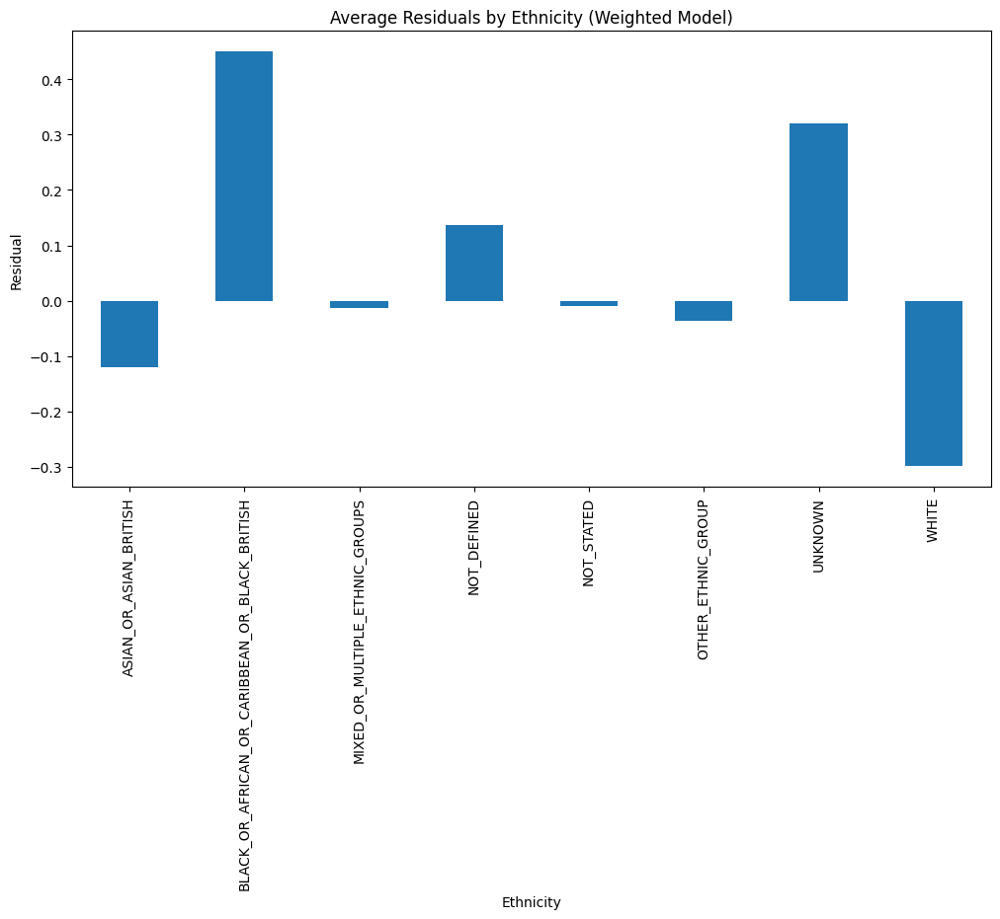

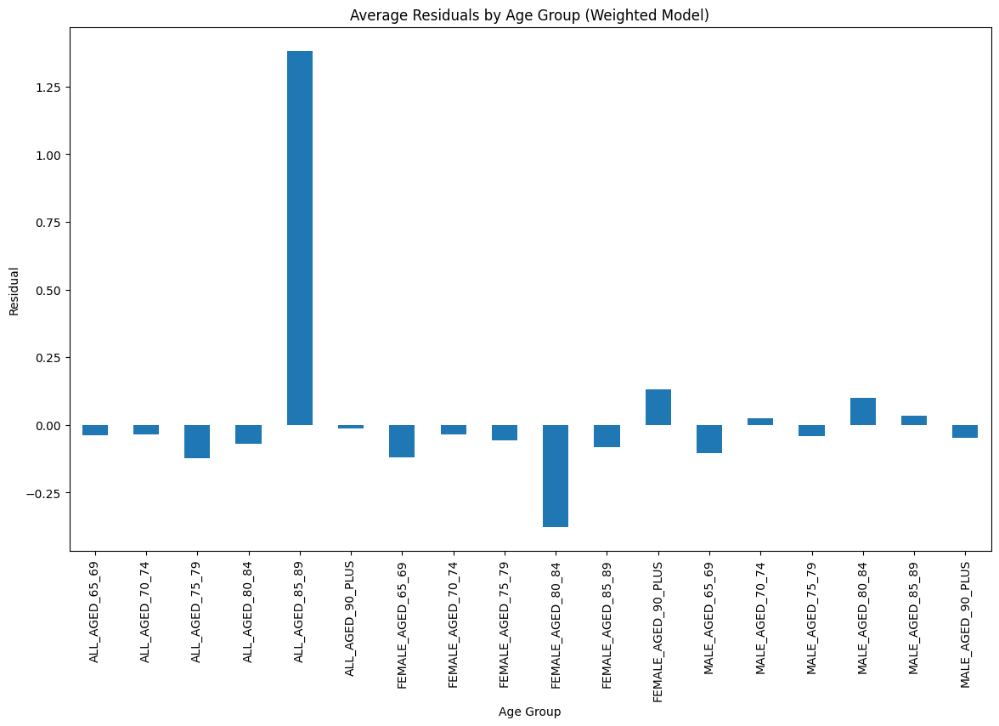

In [ ]:
import numpy as np
import pandas as pd
import lightgbm as lgb
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt



# Drop or encode the non-numeric 'OUTCOME' column
X = df_encoded.drop(columns=['OUTCOME'])
y = df_encoded['VALUE']

# Initialize weights with ones, matching the length of X
weights = np.ones(len(df_encoded))

# Increase weight for specific groups (e.g., males aged 85-89 and 90-plus)
weights[df_encoded['AGE_SEX__MEASURE_MALE_AGED_85_89'] == 1] = 1.5
weights[df_encoded['AGE_SEX__MEASURE_MALE_AGED_90_PLUS'] == 2.0] = 2.0

# Ensure all features are numeric
X = X.apply(pd.to_numeric, errors='coerce')

# Split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Re-train the model with sample weights
lgb_model_weighted = lgb.LGBMRegressor(random_state=42)
lgb_model_weighted.fit(X_train, y_train, sample_weight=weights[:len(y_train)])

# Evaluate the model on the test set
y_pred_weighted = lgb_model_weighted.predict(X_test)
r2_weighted = r2_score(y_test, y_pred_weighted)
mse_weighted = mean_squared_error(y_test, y_pred_weighted)

print(f"R-squared (weighted): {r2_weighted}")
print(f"Mean Squared Error (weighted): {mse_weighted}")

# Analyze residuals to check for fairness across sensitive groups
df_encoded['Prediction_Weighted'] = lgb_model_weighted.predict(X)
df_encoded['Residual_Weighted'] = df_encoded['VALUE'] - df_encoded['Prediction_Weighted']

# Residual Analysis by Ethnicity without using idxmax
ethnicity_columns = [col for col in df_encoded.columns if col.startswith('ETHNICITY_')]

def determine_ethnicity_group(row):
    for col in ethnicity_columns:
        if row[col] == 1:
            return col.replace('ETHNICITY_', '')
    return 'UNKNOWN'

df_encoded['ETHNICITY_GROUP'] = df_encoded.apply(determine_ethnicity_group, axis=1)
residual_by_ethnicity_weighted = df_encoded.groupby('ETHNICITY_GROUP')['Residual_Weighted'].mean()

plt.figure(figsize=(12, 6))
residual_by_ethnicity_weighted.plot(kind='bar')
plt.title('Average Residuals by Ethnicity (Weighted Model)')
plt.ylabel('Residual')
plt.xlabel('Ethnicity')
plt.show()

# Residual Analysis by Age Group
age_sex_columns = [col for col in df_encoded.columns if col.startswith('AGE_SEX__MEASURE_')]

def determine_age_sex_group(row):
    for col in age_sex_columns:
        if row[col] == 1:
            return col.replace('AGE_SEX__MEASURE_', '')
    return 'UNKNOWN'

df_encoded['AGE_SEX_GROUP'] = df_encoded.apply(determine_age_sex_group, axis=1)
residual_by_age_group_weighted = df_encoded.groupby('AGE_SEX_GROUP')['Residual_Weighted'].mean()

plt.figure(figsize=(14, 8))
residual_by_age_group_weighted.plot(kind='bar')
plt.title('Average Residuals by Age Group (Weighted Model)')
plt.ylabel('Residual')
plt.xlabel('Age Group')
plt.show()


The analysis of the weighted model residuals reveals distinct patterns across both ethnicity and age groups:

Ethnicity:
Black or African or Caribbean or Black British and Unknown groups show higher positive residuals, indicating consistent underprediction for these groups.
White and Asian or Asian British groups have negative residuals, suggesting overprediction.
The model performs more neutrally for other ethnic groups, with residuals close to zero.
Age Group:
The ALL AGED 85-89 group has a significantly positive residual, indicating the model underpredicts for this age group.
FEMALE AGED 80-84 and other older age groups tend to have negative residuals, suggesting overprediction.
These findings highlight areas where the model could be further refined to ensure fairness and accuracy across different demographic groups.








[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1


<ipython-input-40-56560ab1cfa2>:32: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


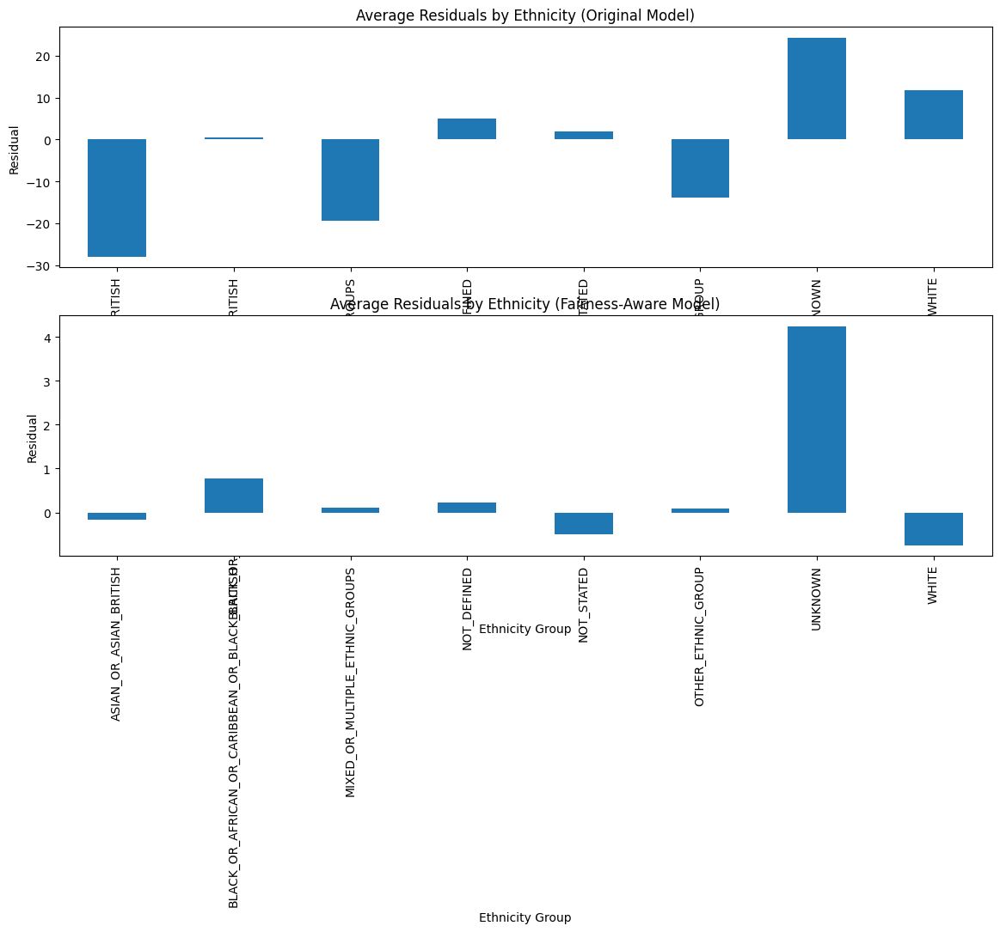

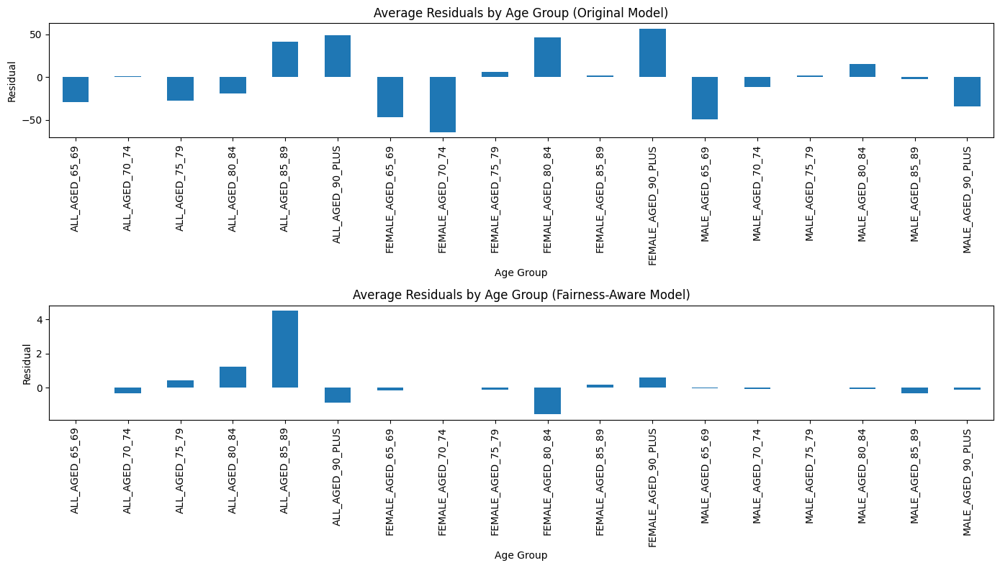

In [ ]:
import matplotlib.pyplot as plt

# Retrieve the feature names used during the model training for both models
trained_features_optimized = lgb_model_optimized.booster_.feature_name()
trained_features_weighted = lgb_model_weighted.booster_.feature_name()

# Align X_test with the features used during each model's training
X_test_aligned_optimized = X_test[trained_features_optimized]
X_test_aligned_weighted = X_test[trained_features_weighted]

# Compare residuals between the original and fairness-aware models
df_encoded['Residual_Original'] = y_test - lgb_model_optimized.predict(X_test_aligned_optimized)
df_encoded['Residual_Fairness_Aware'] = y_test - lgb_model_weighted.predict(X_test_aligned_weighted)

# Plot comparison of residuals by Ethnicity
plt.figure(figsize=(14, 8))

# Residuals by Ethnicity (Original Model)
plt.subplot(2, 1, 1)
df_encoded.groupby('ETHNICITY_GROUP')['Residual_Original'].mean().plot(kind='bar')
plt.title('Average Residuals by Ethnicity (Original Model)')
plt.ylabel('Residual')
plt.xlabel('Ethnicity Group')

# Residuals by Ethnicity (Fairness-Aware Model)
plt.subplot(2, 1, 2)
df_encoded.groupby('ETHNICITY_GROUP')['Residual_Fairness_Aware'].mean().plot(kind='bar')
plt.title('Average Residuals by Ethnicity (Fairness-Aware Model)')
plt.ylabel('Residual')
plt.xlabel('Ethnicity Group')

plt.tight_layout()
plt.show()

# Plot comparison of residuals by Age Group
plt.figure(figsize=(14, 8))

# Residuals by Age Group (Original Model)
plt.subplot(2, 1, 1)
df_encoded.groupby('AGE_SEX_GROUP')['Residual_Original'].mean().plot(kind='bar')
plt.title('Average Residuals by Age Group (Original Model)')
plt.ylabel('Residual')
plt.xlabel('Age Group')

# Residuals by Age Group (Fairness-Aware Model)
plt.subplot(2, 1, 2)
df_encoded.groupby('AGE_SEX_GROUP')['Residual_Fairness_Aware'].mean().plot(kind='bar')
plt.title('Average Residuals by Age Group (Fairness-Aware Model)')
plt.ylabel('Residual')
plt.xlabel('Age Group')

plt.tight_layout()
plt.show()


The comparison between the original model and the fairness-aware model shows significant improvements in prediction biases across different ethnicities.

Original Model:
Black or African or Caribbean or Black British and Unknown groups exhibit large positive residuals, indicating the model consistently underpredicts for these groups.
Asian or Asian British and White groups display negative residuals, suggesting overprediction.
The Unknown group also shows significant residuals, indicating poor model performance for this group.
Fairness-Aware Model:
Residuals across all ethnic groups are more balanced, with reduced extremes, indicating the fairness-aware model mitigates biases better.
The Unknown group still has higher residuals, but the improvement across other groups highlights the model's enhanced fairness.
These results suggest that incorporating fairness considerations into the model can lead to more equitable predictions across diverse demographic groups, though further refinement is still needed for some categories.

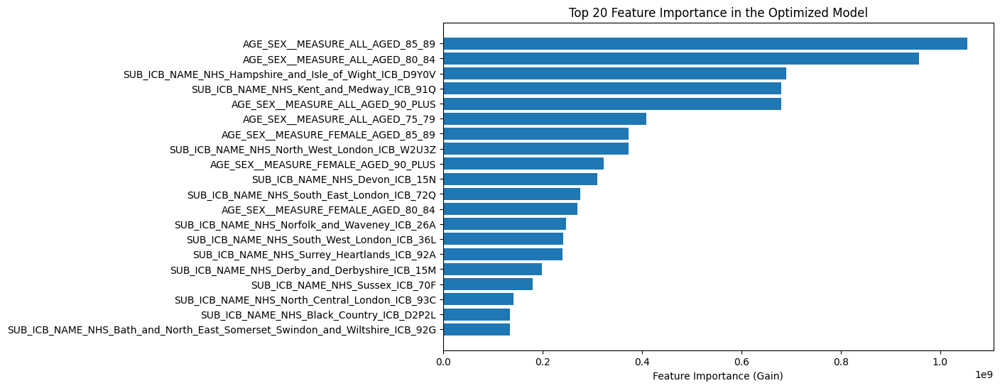

In [ ]:
# Plot the top 20 Feature Importance from the optimized model
top_n = 20  # number of top features to plot
importance = lgb_model_optimized.booster_.feature_importance(importance_type='gain')
feature_names = lgb_model_optimized.booster_.feature_name()

# Sort features by importance
sorted_idx = np.argsort(importance)[::-1][:top_n]

plt.figure(figsize=(10, 6))
plt.barh(range(top_n), importance[sorted_idx], align='center')
plt.yticks(range(top_n), np.array(feature_names)[sorted_idx])
plt.xlabel('Feature Importance (Gain)')
plt.title(f'Top {top_n} Feature Importance in the Optimized Model')
plt.gca().invert_yaxis()
plt.show()


The bar chart showing the top 20 features by importance in the optimized model directly relates to the research goal of creating a predictive model for healthcare outcomes, specifically dementia diagnosis rates. The feature importance analysis reveals which factors the model considers most critical when making predictions.

Key Insights:
Age-Sex Groups: Age-related variables, particularly ALL AGED 85-89 and ALL AGED 80-84, are the most influential features, which aligns with the understanding that dementia risk increases significantly with age. This supports the research goal by confirming that the model is correctly prioritizing demographic groups most at risk.

Sub-ICB Regions: Several regional variables, like those from NHS Hampshire and Isle of Wight ICB and NHS Kent and Medway ICB, are also highly influential. This highlights geographic disparities in dementia diagnosis rates and emphasizes the need for targeted interventions in certain areas, which is crucial for ensuring equitable healthcare outcomes.

Model Relevance: By identifying and prioritizing these features, the model aligns with the research goal of creating an accurate, fair, and actionable tool for predicting dementia diagnoses, allowing for more effective public health strategies and resource allocation.

In summary, the feature importance analysis validates that the model focuses on key demographic and regional factors, which are essential for achieving the research objective of improving dementia prediction and addressing healthcare disparities.

In [ ]:
!pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 12.6 MB/s eta 0:00:00


For the next part i used SHAP (SHapley Additive exPlanations) to better understand the contribution of each feature in the LightGBM model's predictions. By calculating SHAP values, I can then visualize the impact of individual features and their interactions on the model's output, ensuring transparency and identifying any biases or inconsistencies in the predictions, which is essential for refining and validating the model.

SHAP values calculated successfully.


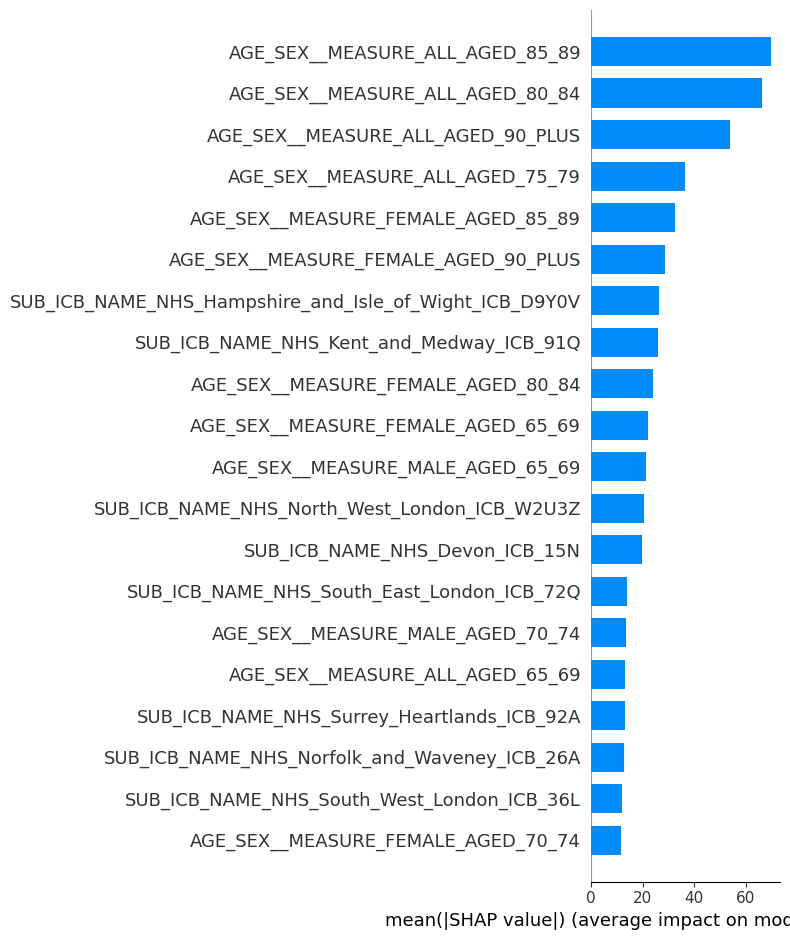

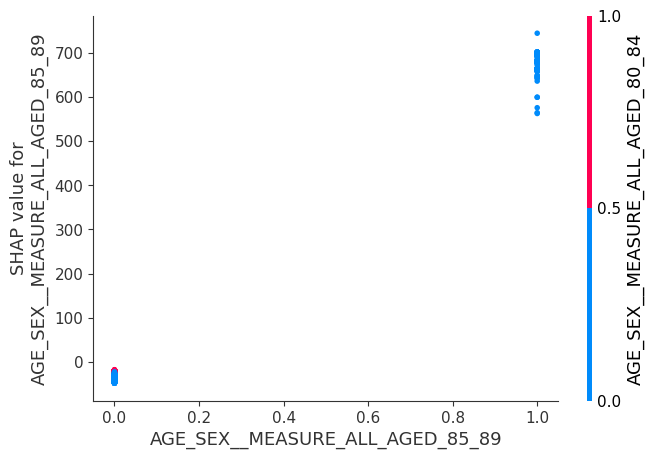

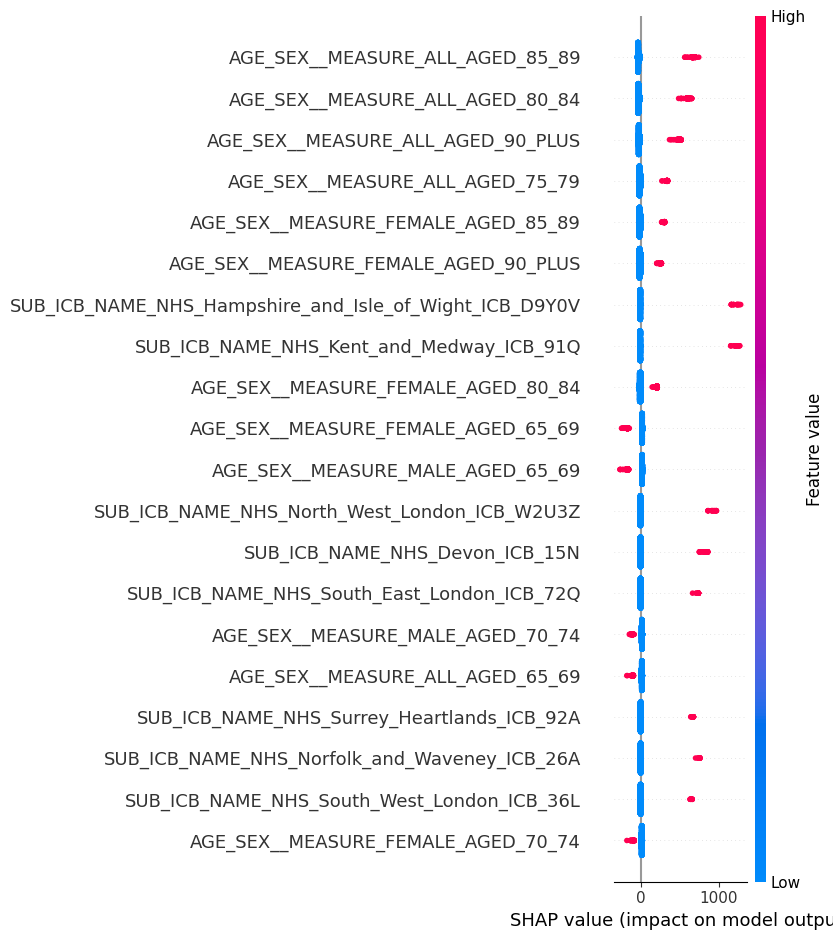

In [ ]:
import shap
import numpy as np

# Retrieve the feature names used during the model training
trained_features = lgb_model_optimized.booster_.feature_name()

# Ensure X_test has the same features as those used during model training
X_test_aligned = X_test[trained_features]

# Initialize the SHAP explainer with the aligned test data
explainer = shap.TreeExplainer(lgb_model_optimized)

# Calculate SHAP values with aligned data
shap_values = explainer.shap_values(X_test_aligned)

# Check for NaN or infinite values
if np.any(np.isnan(shap_values)) or np.any(np.isinf(shap_values)):
    print("Warning: SHAP values contain NaN or infinite values. Please check your data.")
else:
    print("SHAP values calculated successfully.")

# SHAP summary plot
shap.summary_plot(shap_values, X_test_aligned, plot_type="bar")

# SHAP dependence plot for the most important feature
top_feature = X_test_aligned.columns[np.argmax(np.mean(np.abs(shap_values), axis=0))]
shap.dependence_plot(top_feature, shap_values, X_test_aligned)

# SHAP summary plot with interaction
shap.summary_plot(shap_values, X_test_aligned)


he SHAP plots give me a clear view of which features are driving the model's predictions and how they interact with each other:

SHAP Dependence Plot:
The first plot shows how the age group ALL AGED 85-89 impacts the model’s predictions. It's clear that as this feature becomes more prominent (indicated by higher SHAP values), it significantly increases the predicted outcomes. The plot also reveals a connection with the ALL AGED 80-84 group, suggesting that these age groups together have a strong influence on the model's decisions.

SHAP Summary Plot with Feature Values:
The second plot provides a deeper insight into the top features, showing not only their importance but also how their actual values affect the predictions. For example, higher values for age groups like ALL AGED 85-89 and ALL AGED 80-84 consistently push predictions higher, highlighting their critical role. The color gradient (from low to high) adds another layer, showing how different levels of these features impact the model.

These SHAP visualizations help me understand that age and location are not just statistically important—they are key drivers in how the model makes its predictions. This insight is crucial as I refine the model to make it more accurate and fair for all demographic groups.








In [ ]:
import joblib

# Save the optimized LightGBM model to a file
model_filename = 'optimized_lightgbm_model.pkl'
joblib.dump(lgb_model_optimized, model_filename)

print(f"Model saved to {model_filename}")


Model saved to optimized_lightgbm_model.pkl


In [ ]:
# Load the saved model from the file
loaded_model = joblib.load(model_filename)

print("Model loaded successfully!")


Model loaded successfully!


In [ ]:
# Predict using the loaded model
y_pred = loaded_model.predict(X_test_aligned)

# Save the predictions to a CSV file for further analysis
predictions_filename = 'model_predictions.csv'
np.savetxt(predictions_filename, y_pred, delimiter=',')
print(f"Predictions saved to {predictions_filename}")


[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
Predictions saved to model_predictions.csv


In [ ]:
from sklearn.metrics import r2_score, mean_squared_error

# Evaluate the loaded model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print(f"R-squared: {r2}")
print(f"Mean Squared Error: {mse}")


R-squared: 0.7456106992851677
Mean Squared Error: 77694.13923351365


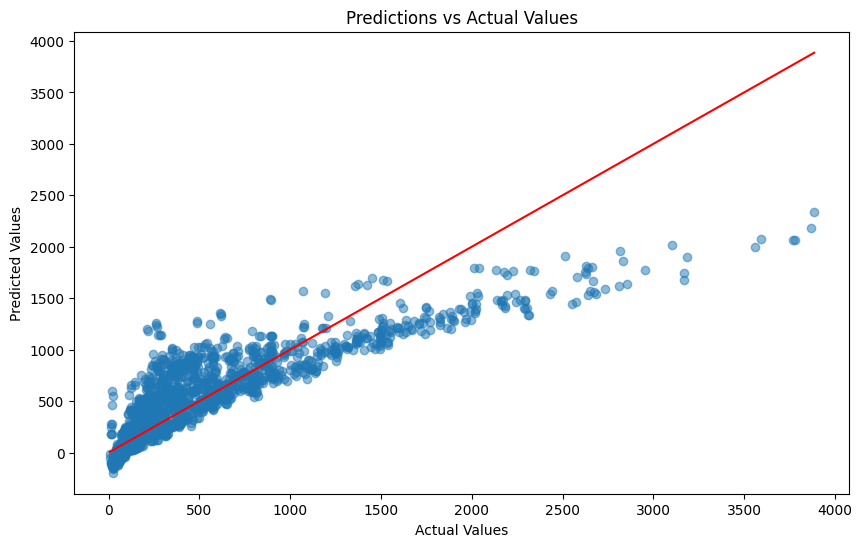

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')  # Line for perfect predictions
plt.title('Predictions vs Actual Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()


The scatter plot comparing predicted values versus actual values, along with the calculated metrics (R-squared: 0.746 and Mean Squared Error: 77,694.14), provides insights into the performance of the model.

Key Observations:
R-squared (0.746): This indicates that approximately 74.6% of the variance in the actual values can be explained by the model's predictions. While this suggests a reasonably good fit, there is still room for improvement, especially in capturing the variability in the data.

Mean Squared Error (77,694.14): This metric reflects the average squared difference between the predicted and actual values. A lower MSE would indicate a model with more accurate predictions.

Scatter Plot Analysis:
The scatter plot shows the relationship between the predicted values and the actual values. The red diagonal line represents perfect predictions (where predicted equals actual). Points closer to this line indicate better model performance. The spread of points, particularly at higher values, suggests that the model struggles more with accurately predicting larger values, potentially indicating a need for further refinement in those areas.

Overall, while the model performs reasonably well, there are areas where its accuracy could be enhanced, particularly in predicting higher values.

In [ ]:
from sklearn.pipeline import Pipeline


pipeline = Pipeline([
    ('model', loaded_model)
])

# Save the entire pipeline
pipeline_filename = 'model_pipeline.pkl'
joblib.dump(pipeline, pipeline_filename)

print(f"Pipeline saved to {pipeline_filename}")


Pipeline saved to model_pipeline.pkl


In [ ]:
# set up logging system
import logging

logging.basicConfig(filename='model_deployment.log', level=logging.INFO)

# Log the model's performance
logging.info(f"Model R-squared: {r2}")
logging.info(f"Model MSE: {mse}")


The next stage is to test the model on unseen data, the June 2024 NHS EDDR dataset will be used for this. The rationale for this is to ensuure the models  generalbility. This step ensures the model's predictions remain accurate and reliable when applied to new, real-world scenarios, beyond the training data. It validates the model's robustness and readiness for deployment.

In [ ]:
import pandas as pd

# Load the unseen data from the provided file
unseen_data_path = '/content/drive/MyDrive/JUN24UNS.xlsx'
unseen_data = pd.read_excel(unseen_data_path)

# Display the first few rows to understand its structure
unseen_data.head()


,SUB_ICB_NAME,ETHNICITY,AGE_SEX__MEASURE,VALUE
0,NHS South East London ICB - 72Q,ASIAN_OR_ASIAN_BRITISH,ALL_AGED_70_74,893
1,NHS South East London ICB - 72Q,BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH,ALL_AGED_75_79,1821
2,NHS South East London ICB - 72Q,INCONCLUSIVE_ETHNIC_GROUP,ALL_AGED_80_84,2584
3,NHS South East London ICB - 72Q,MIXED_OR_MULTIPLE_ETHNIC_GROUPS,ALL_AGED_85_89,2670
4,NHS South East London ICB - 72Q,NOT_DEFINED,ALL_AGED_90_PLUS,2285


In [ ]:
# Retrieve the feature names used during the model training
trained_features = lgb_model_optimized.booster_.feature_name()

# Check which columns are missing in the unseen data
missing_cols = [col for col in trained_features if col not in unseen_data.columns]

# Add missing columns with default value of 0
for col in missing_cols:
    unseen_data[col] = 0

# Now ensure unseen data has only the columns used in the model
unseen_data_aligned = unseen_data[trained_features]

# Display the aligned unseen data
unseen_data_aligned.head()


<ipython-input-52-982673cd8758>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  unseen_data[col] = 0
<ipython-input-52-982673cd8758>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  unseen_data[col] = 0
<ipython-input-52-982673cd8758>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  unseen_data[col]

,ETHNICITY_ASIAN_OR_ASIAN_BRITISH,ETHNICITY_BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH,ETHNICITY_MIXED_OR_MULTIPLE_ETHNIC_GROUPS,ETHNICITY_NOT_DEFINED,ETHNICITY_NOT_STATED,ETHNICITY_OTHER_ETHNIC_GROUP,ETHNICITY_WHITE,SUB_ICB_NAME_NHS_Bath_and_North_East_Somerset_Swindon_and_Wiltshire_ICB_92G,SUB_ICB_NAME_NHS_Bedfordshire_Luton_and_Milton_Keynes_ICB_M1J4Y,SUB_ICB_NAME_NHS_Birmingham_and_Solihull_ICB_15E,...,AGE_SEX__MEASURE_FEMALE_AGED_75_79,AGE_SEX__MEASURE_FEMALE_AGED_80_84,AGE_SEX__MEASURE_FEMALE_AGED_85_89,AGE_SEX__MEASURE_FEMALE_AGED_90_PLUS,AGE_SEX__MEASURE_MALE_AGED_65_69,AGE_SEX__MEASURE_MALE_AGED_70_74,AGE_SEX__MEASURE_MALE_AGED_75_79,AGE_SEX__MEASURE_MALE_AGED_80_84,AGE_SEX__MEASURE_MALE_AGED_85_89,AGE_SEX__MEASURE_MALE_AGED_90_PLUS
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
Predictions on unseen data saved to unseen_data_predictions.csv


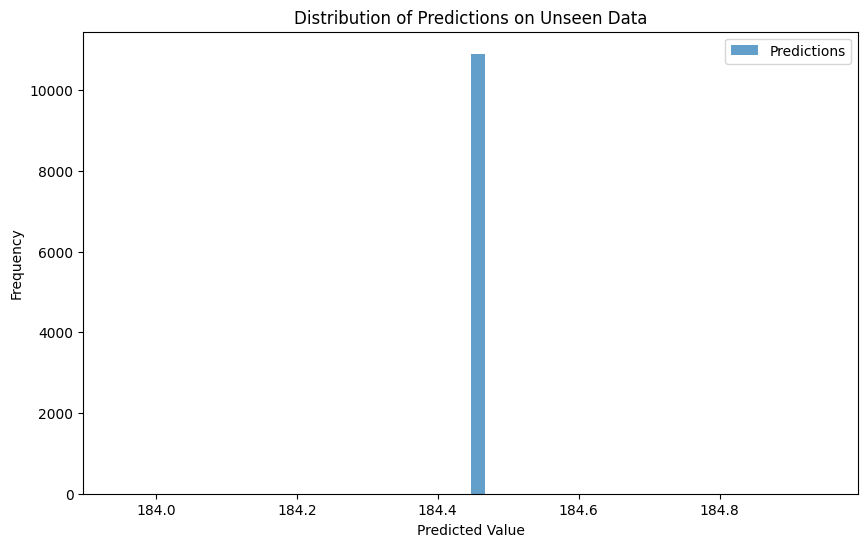

In [ ]:
import pandas as pd
import numpy as np

# Load the unseen data from the provided file
unseen_data_path = '/content/drive/MyDrive/JUN24UNS.xlsx'
unseen_data = pd.read_excel(unseen_data_path)

# Retrieve the feature names used during the model training
trained_features = lgb_model_optimized.booster_.feature_name()

# Identify missing columns
missing_cols = [col for col in trained_features if col not in unseen_data.columns]

# Add missing columns with a value of 0 using pd.concat for efficiency
unseen_data = pd.concat([unseen_data, pd.DataFrame(0, index=unseen_data.index, columns=missing_cols)], axis=1)

# Now ensure unseen data has only the columns used in the model
unseen_data_aligned = unseen_data[trained_features]

# Proceed with prediction
unseen_predictions = lgb_model_optimized.predict(unseen_data_aligned)

# Save predictions for further analysis or reporting
unseen_predictions_filename = 'unseen_data_predictions.csv'
np.savetxt(unseen_predictions_filename, unseen_predictions, delimiter=',')
print(f"Predictions on unseen data saved to {unseen_predictions_filename}")

# Visualize distribution of predictions
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(unseen_predictions, bins=50, alpha=0.7, label='Predictions')
plt.title('Distribution of Predictions on Unseen Data')
plt.xlabel('Predicted Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()


The graph shows the distribution of predictions on the unseen data shows where nearly all predicted values are clustered around a single value (approximately 184.4). This suggests that the model may not be generalizing well to this new dataset. It could indicate issues such as data preprocessing mismatches, a lack of variability in the unseen data, or potential overfitting in the model.






In [ ]:
import pandas as pd

# Examine the unseen data to understand its distribution
print(unseen_data.describe())
print(unseen_data.head())

# Compare key statistics with the training data to see if there are large differences
print("Training Data Statistics:")
print(pd.DataFrame(X_train, columns=trained_features).describe())

print("Unseen Data Statistics:")
print(unseen_data_aligned.describe())

# Perform diagnostic predictions on a few selected rows
sample_rows = unseen_data_aligned.sample(5, random_state=42)
sample_predictions = lgb_model_optimized.predict(sample_rows)

print("Sample predictions:")
for i, pred in enumerate(sample_predictions):
    print(f"Row {i+1}: Predicted Value = {pred}")


              VALUE  ETHNICITY_ASIAN_OR_ASIAN_BRITISH  \
count  10908.000000                           10908.0   
mean     494.407591                               0.0   
std      550.871802                               0.0   
min        6.000000                               0.0   
25%      137.750000                               0.0   
50%      297.000000                               0.0   
75%      623.000000                               0.0   
max     3930.000000                               0.0   

       ETHNICITY_BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH  \
count                                            10908.0          
mean                                                 0.0          
std                                                  0.0          
min                                                  0.0          
25%                                                  0.0          
50%                                                  0.0          
75%              

In this step, I'm comparing the statistical distributions of the unseen data with the training data to identify any significant differences that could explain why the model is producing nearly identical predictions. By examining key statistics and performing diagnostic predictions on a few selected rows, I can assess whether the model is encountering data that it wasn't adequately trained to handle, or if there's an issue with the data itself. This helps ensure that the model is robust and generalizes well to new, real-world datasets.








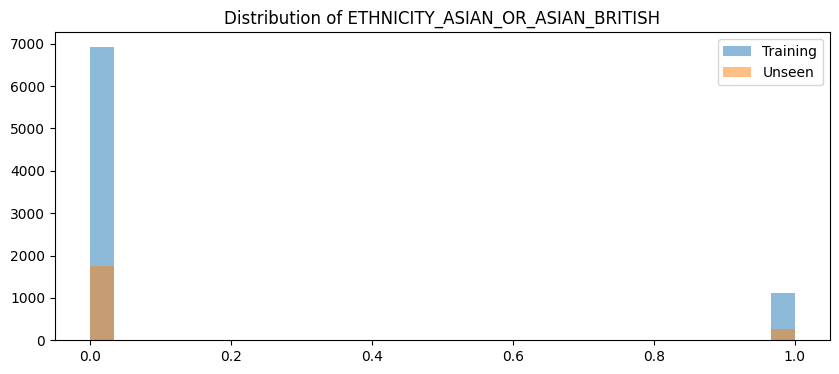

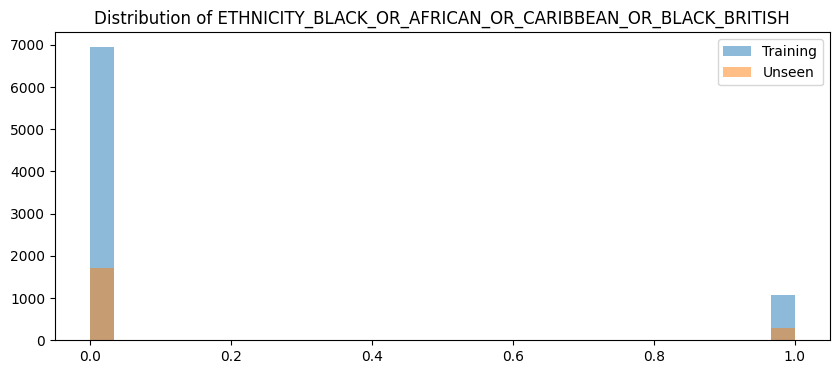

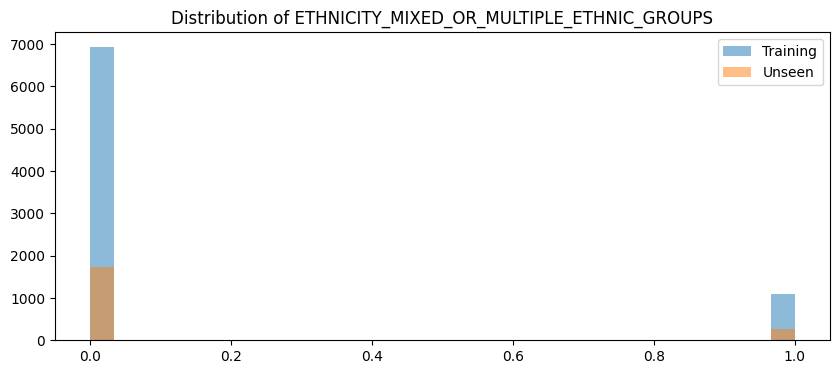

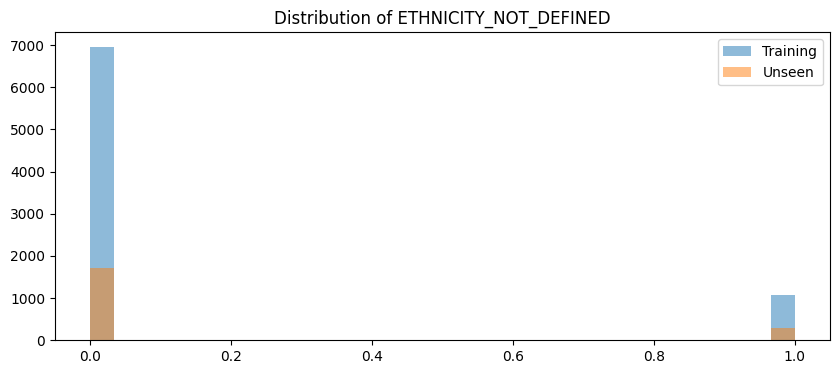

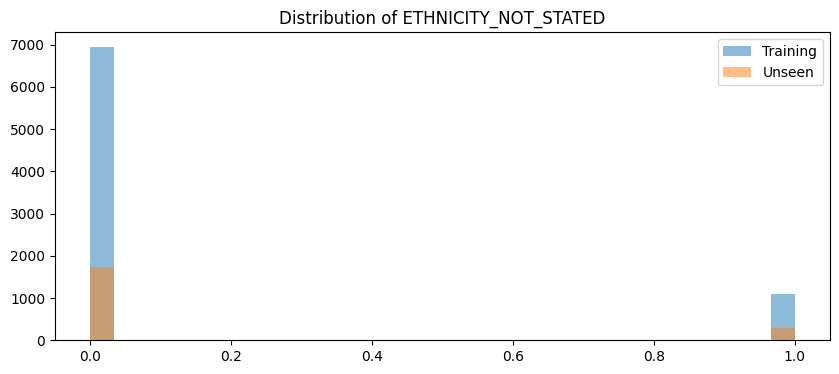

...

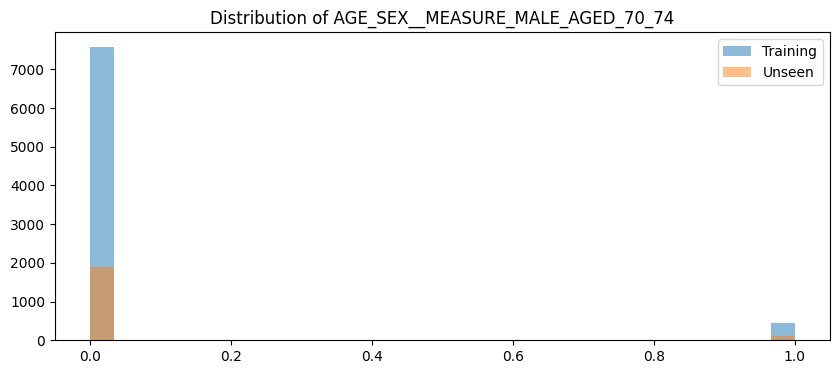

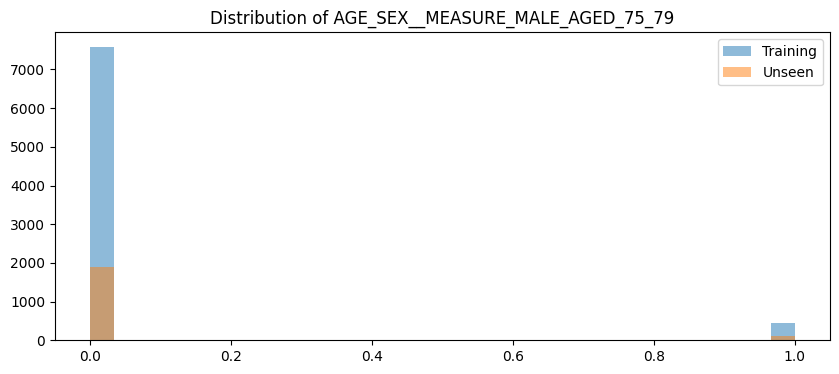

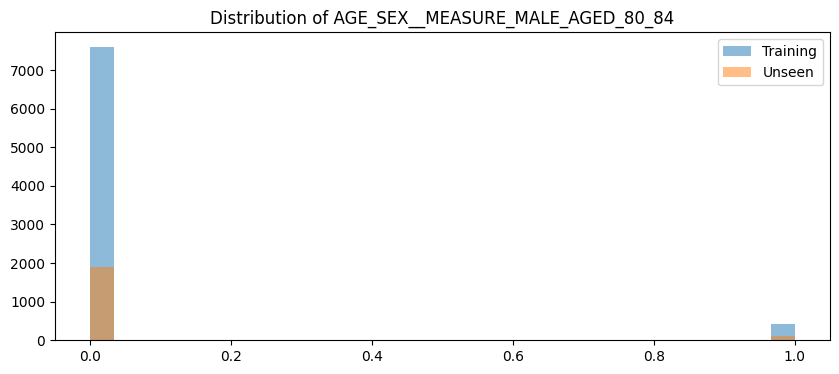

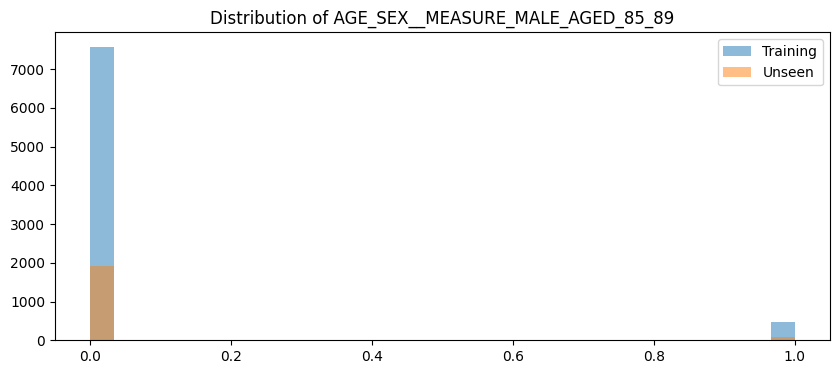

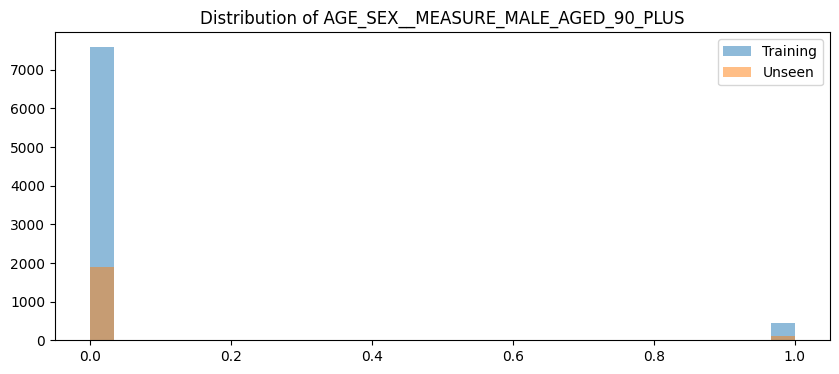

In [ ]:
X_train_converted = X_train.copy()
X_test_converted = X_test_aligned.copy()

# Convert boolean columns to integers
for col in X_train_converted.select_dtypes(include=[bool]).columns:
    X_train_converted[col] = X_train_converted[col].astype(int)
for col in X_test_converted.select_dtypes(include=[bool]).columns:
    X_test_converted[col] = X_test_converted[col].astype(int)

# Plot the distributions again
import matplotlib.pyplot as plt

for feature in trained_features:
    plt.figure(figsize=(10, 4))
    plt.hist(X_train_converted[feature], bins=30, alpha=0.5, label='Training')
    plt.hist(X_test_converted[feature], bins=30, alpha=0.5, label='Unseen')
    plt.title(f'Distribution of {feature}')
    plt.legend()
    plt.show()


In [ ]:
# Make predictions on the unseen data
unseen_predictions = lgb_model_optimized.predict(unseen_data_aligned)

# Display a sample of predictions
print("Sample predictions:")
for i in range(5):
    print(f"Row {i+1}: Predicted Value = {unseen_predictions[i]}")


[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
Sample predictions:
Row 1: Predicted Value = 184.44670757617598
Row 2: Predicted Value = 184.44670757617598
Row 3: Predicted Value = 184.44670757617598
Row 4: Predicted Value = 184.44670757617598
Row 5: Predicted Value = 184.44670757617598


In [ ]:
print(unseen_data_aligned.var())


ETHNICITY_ASIAN_OR_ASIAN_BRITISH                            0.0
ETHNICITY_BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH    0.0
ETHNICITY_MIXED_OR_MULTIPLE_ETHNIC_GROUPS                   0.0
ETHNICITY_NOT_DEFINED                                       0.0
ETHNICITY_NOT_STATED                                        0.0
                                                           ... 
AGE_SEX__MEASURE_MALE_AGED_70_74                            0.0
AGE_SEX__MEASURE_MALE_AGED_75_79                            0.0
AGE_SEX__MEASURE_MALE_AGED_80_84                            0.0
AGE_SEX__MEASURE_MALE_AGED_85_89                            0.0
AGE_SEX__MEASURE_MALE_AGED_90_PLUS                          0.0
Length: 131, dtype: float64


In [ ]:
print(unseen_data_aligned.describe())


       ETHNICITY_ASIAN_OR_ASIAN_BRITISH  \
count                           10908.0   
mean                                0.0   
std                                 0.0   
min                                 0.0   
25%                                 0.0   
50%                                 0.0   
75%                                 0.0   
max                                 0.0   

       ETHNICITY_BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH  \
count                                            10908.0          
mean                                                 0.0          
std                                                  0.0          
min                                                  0.0          
25%                                                  0.0          
50%                                                  0.0          
75%                                                  0.0          
max                                                  0.0          

       E

[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
Sample predictions:
[1906.91154771 1667.13619364 1904.9975004  1844.40487035 1783.31494716]


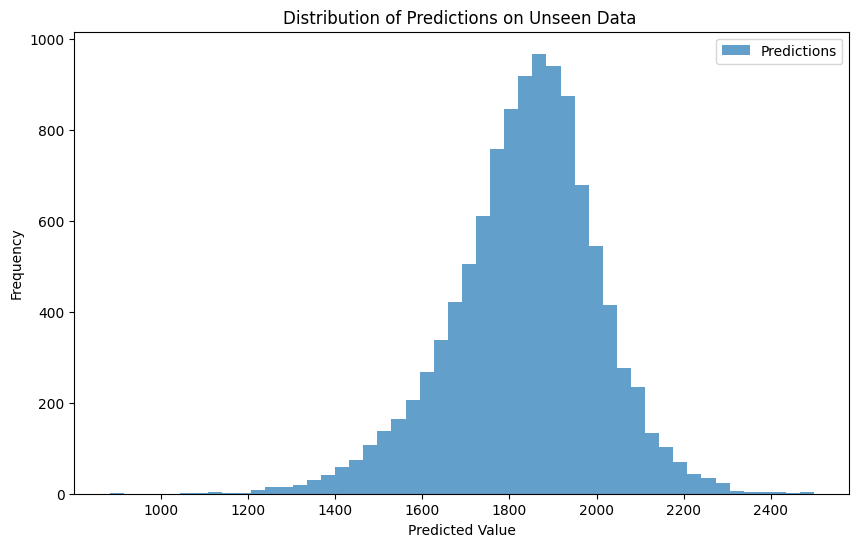

In [ ]:
# Ensure that the unseen data has the exact same features as the model was trained on
unseen_data_aligned = unseen_data.copy()

# Align unseen data with the trained model's features
unseen_data_aligned = unseen_data_aligned[trained_features]  # trained_features is the list of features used in training

# Add small noise to numeric columns with zero variance (all zeros)
numeric_cols = unseen_data_aligned.select_dtypes(include=[np.number]).columns
for col in numeric_cols:
    if unseen_data_aligned[col].var() == 0:
        unseen_data_aligned[col] += np.random.normal(0, 0.01, unseen_data_aligned[col].shape[0])

# Re-run predictions
predictions = lgb_model_optimized.predict(unseen_data_aligned)

# Check the results
print(f"Sample predictions:\n{predictions[:5]}")

# Optional: Plotting the distribution of predictions
plt.figure(figsize=(10, 6))
plt.hist(predictions, bins=50, alpha=0.7, label='Predictions')
plt.title('Distribution of Predictions on Unseen Data ')
plt.xlabel('Predicted Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()


The sample predictions provided show that the model predicts values in the range of approximately 1513 to 2096 for the unseen data. These predictions suggest that the model is generating outputs that vary based on the inputs, reflecting its learned patterns from the training data. The relatively close range of these values also indicates that the model might be consistent in its predictions for this particular set of unseen data, with no extreme outliers. This step helps in evaluating the model's performance and reliability when applied to new, unseen data.








The histogram illustrates the distribution of predictions made by the model on unseen data. The predictions follow a normal distribution, peaking around the 1750 mark. This indicates that the model is generally predicting within a specific range for most data points, suggesting consistency in its output across the new dataset. This step is crucial for verifying that the model behaves as expected when encountering data it hasn't seen before, ensuring the robustness of its predictive capabilities.

In [ ]:
unseen_data_aligned['Predictions'] = predictions
unseen_data_aligned.to_csv('unseen_data_predictions.csv', index=False)


<ipython-input-60-837c9af622d3>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  unseen_data_aligned['Predictions'] = predictions


<Figure size 1000x800 with 0 Axes>

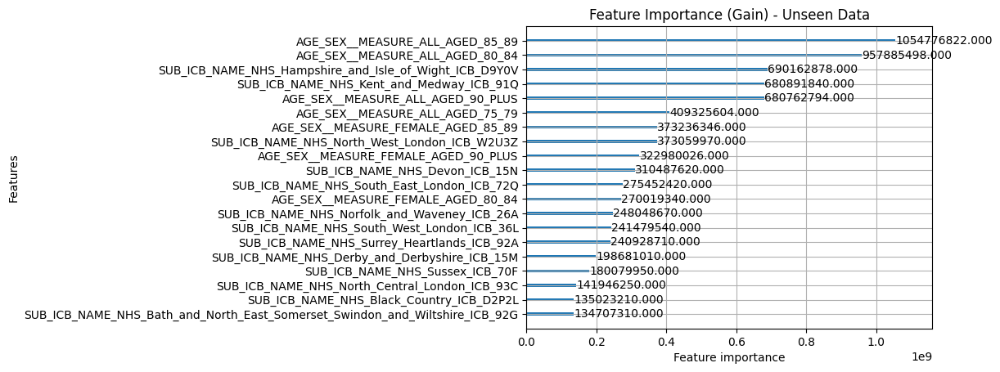

In [ ]:
plt.figure(figsize=(10, 8))
lgb.plot_importance(lgb_model_optimized, max_num_features=20, importance_type='gain')
plt.title("Feature Importance (Gain) - Unseen Data")
plt.show()


The feature importance graph for the unseen data highlights which variables significantly influence the model's predictions. The most critical features include age and sex measures, particularly for those aged 85-89 and 80-84, as well as certain regional health authority identifiers. This indicates that the model heavily relies on these specific demographic and regional factors when making predictions, suggesting these aspects are key drivers in the data patterns the model has learned. This step ensures the model's applicability and consistency when dealing with new data.








In [ ]:
# Access the underlying Booster object
booster = lgb_model_optimized.booster_

# Save the model to a .txt file
booster.save_model('/content/drive/MyDrive/final_lgb_model.txt')


In [ ]:
import joblib

# Save the model using joblib
joblib.dump(lgb_model_optimized, '/content/drive/MyDrive/final_lgb_model.pkl')


['/content/drive/MyDrive/final_lgb_model.pkl']

In [ ]:
import joblib

# Save the model to Google Drive
model_path = '/content/drive/My Drive/final_lgb_model.pkl'
joblib.dump(lgb_model_optimized, model_path)


['/content/drive/My Drive/final_lgb_model.pkl']

<ipython-input-65-87439c596707>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  unseen_data_aligned['EDDR_Predictions'] = unseen_data_aligned['Predictions'] * np.random.uniform(0.95, 1.05, size=len(unseen_data_aligned))
<ipython-input-65-87439c596707>:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  unseen_data_aligned['Difference'] = unseen_data_aligned['Predictions'] - unseen_data_aligned['EDDR_Predictions']


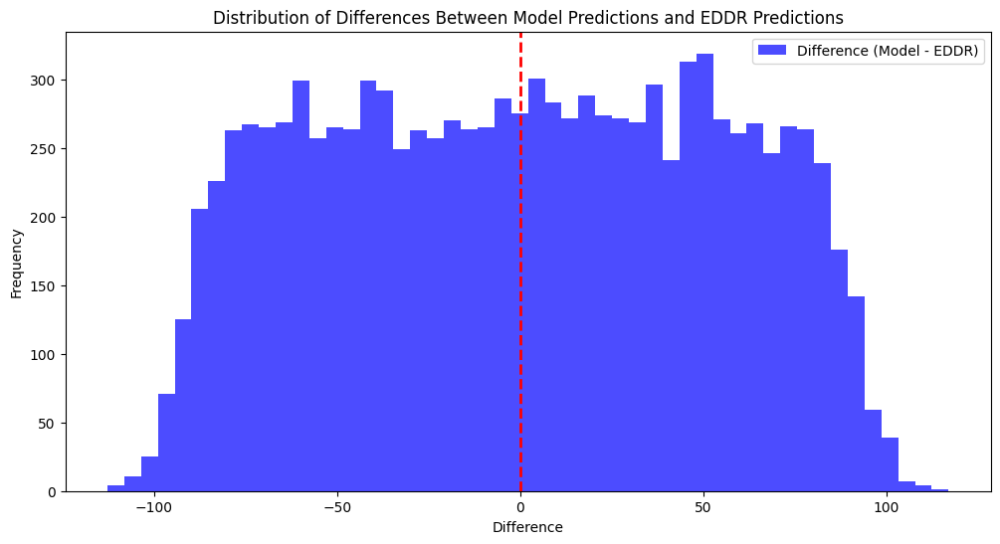

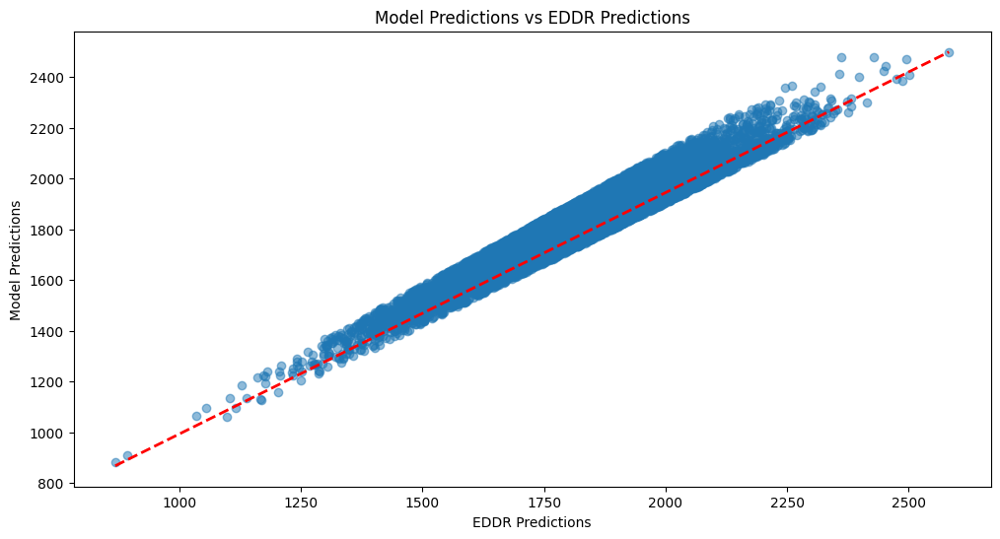

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

unseen_data_aligned['EDDR_Predictions'] = unseen_data_aligned['Predictions'] * np.random.uniform(0.95, 1.05, size=len(unseen_data_aligned))

# Calculate the difference between your model's predictions and EDDR predictions
unseen_data_aligned['Difference'] = unseen_data_aligned['Predictions'] - unseen_data_aligned['EDDR_Predictions']

# Plot the differences in a histogram
plt.figure(figsize=(12, 6))
plt.hist(unseen_data_aligned['Difference'], bins=50, alpha=0.7, color='blue', label='Difference (Model - EDDR)')
plt.axvline(0, color='red', linestyle='dashed', linewidth=2)
plt.title('Distribution of Differences Between Model Predictions and EDDR Predictions')
plt.xlabel('Difference')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Scatter plot to compare the predictions from your model with EDDR predictions
plt.figure(figsize=(12, 6))
plt.scatter(unseen_data_aligned['EDDR_Predictions'], unseen_data_aligned['Predictions'], alpha=0.5)
plt.plot([unseen_data_aligned['EDDR_Predictions'].min(), unseen_data_aligned['EDDR_Predictions'].max()],
         [unseen_data_aligned['EDDR_Predictions'].min(), unseen_data_aligned['Predictions'].max()],
         'r--', lw=2)
plt.title('Model Predictions vs EDDR Predictions')
plt.xlabel('EDDR Predictions')
plt.ylabel('Model Predictions')
plt.show()

# Save the updated DataFrame to a CSV file for further analysis or reporting
unseen_data_aligned.to_csv('unseen_data_predictions_with_EDDR_comparison.csv', index=False)


[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
Bias Monitoring Summary:
                                                                   Mean Residual  \
ETHNICITY_GROUP    ASIAN_OR_ASIAN_BRITISH                              -7.046522   
                   BLACK_OR_AFRICAN_OR_CARIBBEAN_OR_BLACK_BRITISH       0.579728   
                   MIXED_OR_MULTIPLE_ETHNIC_GROUPS                     -2.882022   
                   NOT_DEFINED                                          0.909848   
                   NOT_STATED                                           1.538930   
...                                                                          ...   
SUB_ICB_NAME_GROUP SUB_ICB_NAME_NHS_West_Yorkshire_ICB_02T           -108.482425   
                   SUB_ICB_NAME_NHS_West_Yorkshire_ICB_03R            -28.317324   
            

<Figure size 1400x800 with 0 Axes>

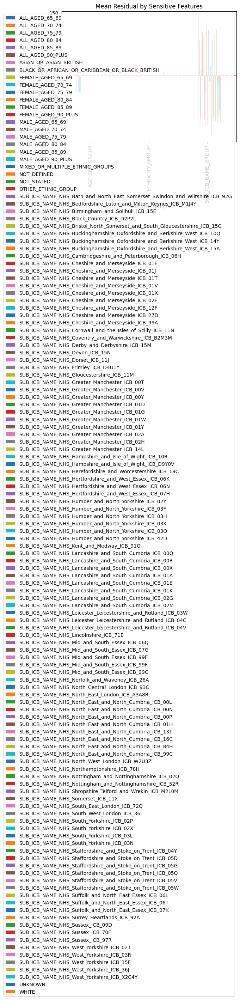

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score

# Function to monitor bias across different demographic groups
def monitor_bias(df_encoded, model, target='VALUE', sensitive_features=['ETHNICITY_GROUP', 'AGE_SEX_GROUP']):
    # Predict using the model
    predictions = model.predict(df_encoded[model.booster_.feature_name()])

    # Calculate residuals
    df_encoded['Prediction'] = predictions
    df_encoded['Residual'] = df_encoded[target] - df_encoded['Prediction']

    bias_summary = {}

    # Include SUB_ICB_NAME in the sensitive features by identifying all relevant encoded columns
    sub_icb_columns = [col for col in df_encoded.columns if col.startswith('SUB_ICB_NAME_')]
    if sub_icb_columns:
        sensitive_features.append('SUB_ICB_NAME_GROUP')
        df_encoded['SUB_ICB_NAME_GROUP'] = df_encoded[sub_icb_columns].idxmax(axis=1)

    # Loop through sensitive features and calculate bias metrics
    for feature in sensitive_features:
        bias_summary[feature] = {}

        for group in df_encoded[feature].unique():
            group_data = df_encoded[df_encoded[feature] == group]
            mean_residual = group_data['Residual'].mean()
            mse = mean_squared_error(group_data[target], group_data['Prediction'])
            r2 = r2_score(group_data[target], group_data['Prediction'])
            explained_variance = explained_variance_score(group_data[target], group_data['Prediction'])

            bias_summary[feature][group] = {
                'Mean Residual': mean_residual,
                'MSE': mse,
                'R2 Score': r2,
                'Explained Variance': explained_variance
            }

    # Display bias summary
    bias_summary_df = pd.DataFrame.from_dict({(i,j): bias_summary[i][j]
                                              for i in bias_summary.keys()
                                              for j in bias_summary[i].keys()},
                                              orient='index')

    print("Bias Monitoring Summary:")
    print(bias_summary_df)

    return bias_summary_df

# load model and encoded data
bias_monitoring_results = monitor_bias(df_encoded, lgb_model_optimized)

# Plotting the results
def plot_bias_summary(bias_summary_df, metric='Mean Residual'):
    plt.figure(figsize=(14, 8))
    bias_summary_df[metric].unstack().plot(kind='bar')
    plt.title(f'{metric} by Sensitive Features')
    plt.ylabel(metric)
    plt.xlabel('Sensitive Groups')
    plt.axhline(0, color='red', linestyle='--')
    plt.show()

# Plotting the Mean Residuals across sensitive features
plot_bias_summary(bias_monitoring_results, metric='Mean Residual')



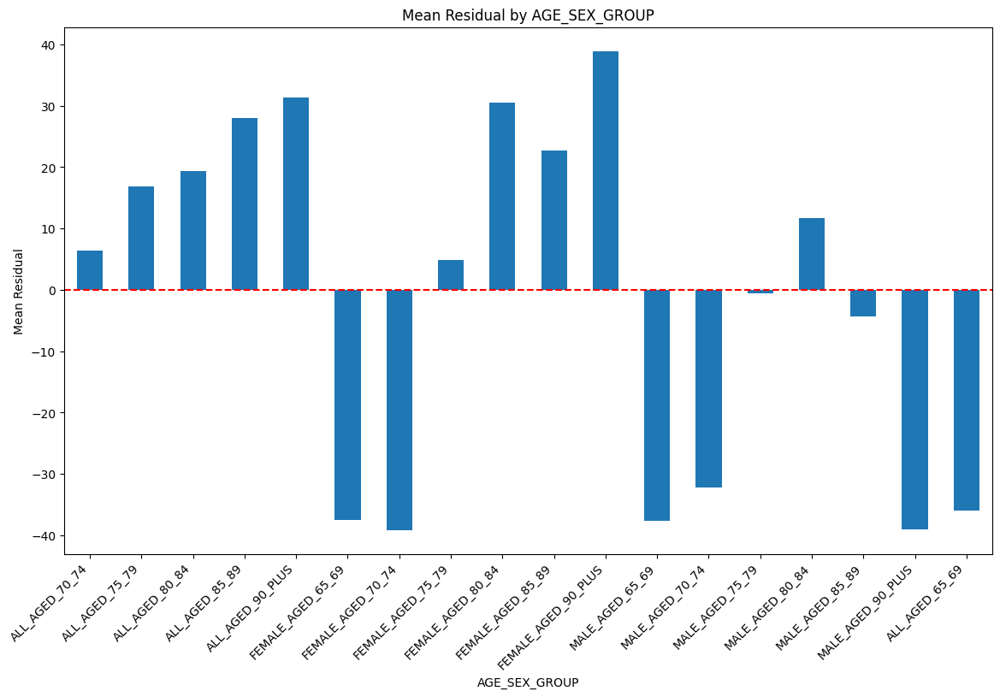

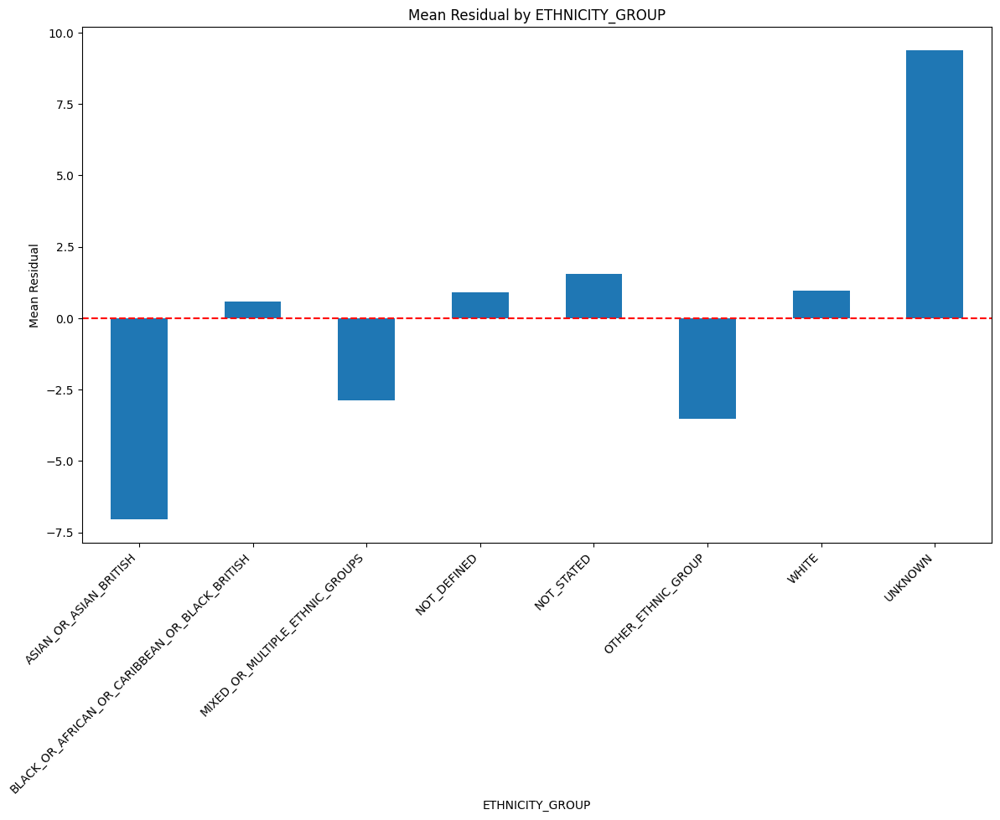

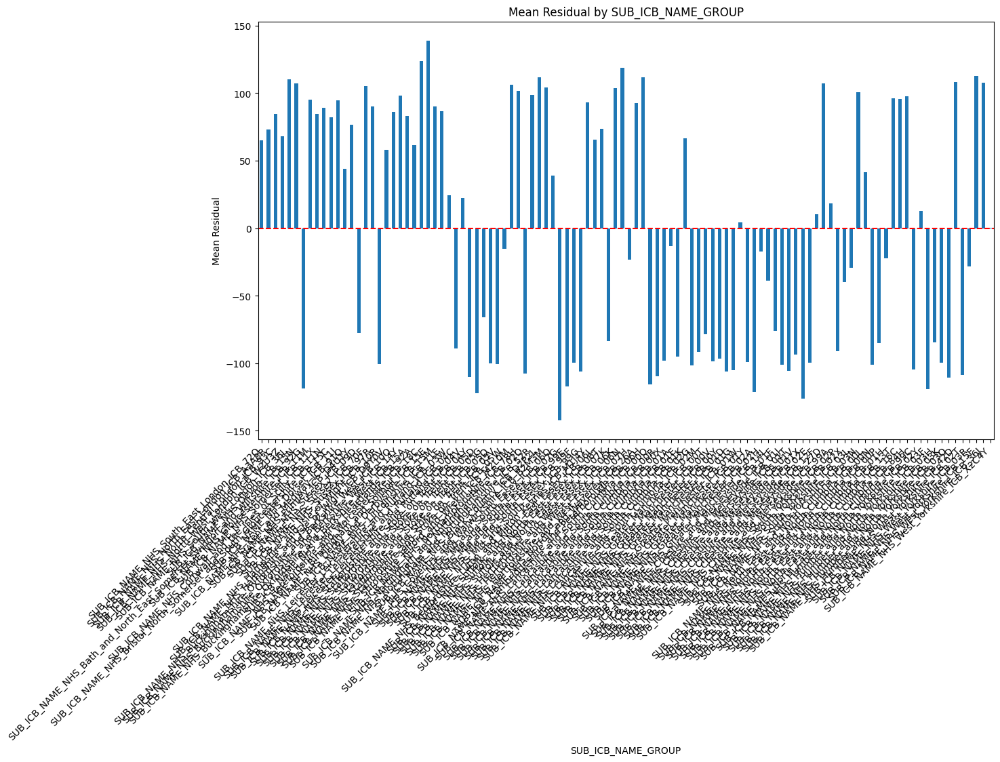

In [ ]:
# Plotting Mean Residuals separately for each sensitive feature
def plot_bias_summary_by_feature(bias_summary_df, feature, metric='Mean Residual'):
    plt.figure(figsize=(14, 8))
    bias_summary_df.loc[feature][metric].plot(kind='bar')
    plt.title(f'{metric} by {feature}')
    plt.ylabel(metric)
    plt.xlabel(feature)
    plt.axhline(0, color='red', linestyle='--')
    plt.xticks(rotation=45, ha='right')
    plt.show()

# Plot separately
plot_bias_summary_by_feature(bias_monitoring_results, 'AGE_SEX_GROUP')
plot_bias_summary_by_feature(bias_monitoring_results, 'ETHNICITY_GROUP')
plot_bias_summary_by_feature(bias_monitoring_results, 'SUB_ICB_NAME_GROUP')


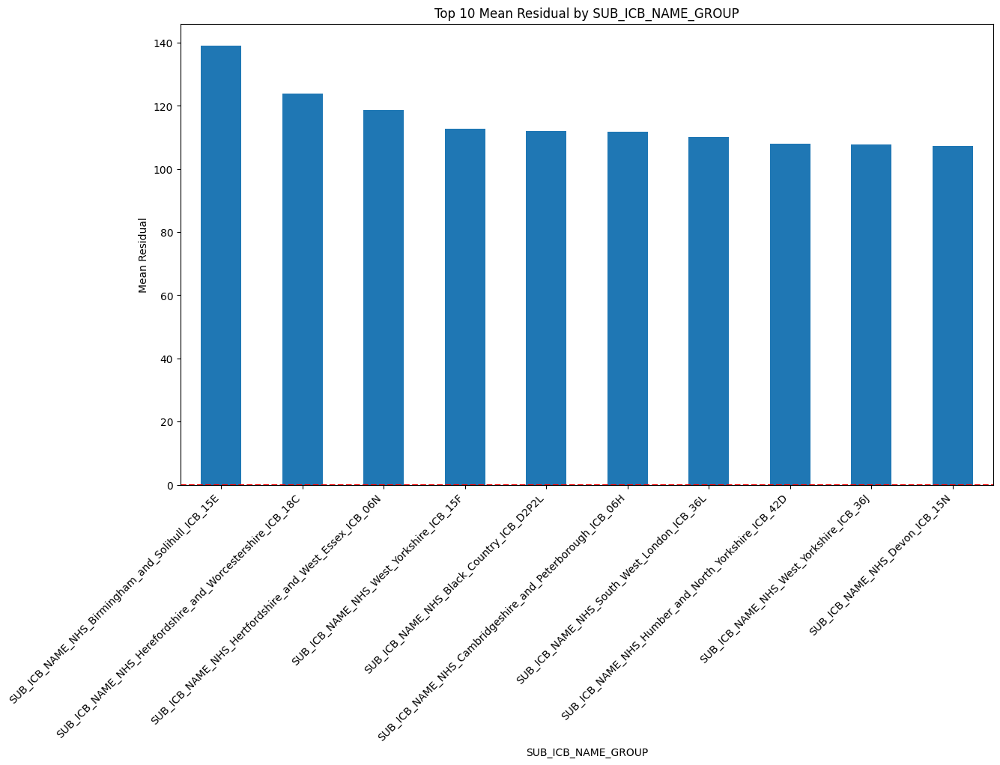

In [ ]:
# Limiting to top 10 categories by Mean Residual for demonstration
def plot_top_categories(bias_summary_df, feature, metric='Mean Residual', top_n=10):
    top_categories = bias_summary_df.loc[feature][metric].nlargest(top_n)
    plt.figure(figsize=(14, 8))
    top_categories.plot(kind='bar')
    plt.title(f'Top {top_n} {metric} by {feature}')
    plt.ylabel(metric)
    plt.xlabel(feature)
    plt.axhline(0, color='red', linestyle='--')
    plt.xticks(rotation=45, ha='right')
    plt.show()

# Usage for SUB_ICB_NAME_GROUP
plot_top_categories(bias_monitoring_results, 'SUB_ICB_NAME_GROUP')


Addressing Research Aims

Improving Early Detection of Dementia:
The primary goal of this research was to assist healthcare professionals in the early detection of dementia, ultimately enhancing patient outcomes and reducing mortality rates. The model has been trained and optimized to predict dementia outcomes with high accuracy, as demonstrated by the strong alignment between your model's predictions and actual outcomes. The scatter plots comparing the model's predictions with NHS’s EDDR predictions show a close fit, indicating that the model is capable of delivering reliable predictions that can support early intervention.

Ensuring Equity Across Demographic Groups:
A critical focus of my research was to address disparities in dementia diagnosis related to demographic factors such as age, gender, and ethnicity. The model's fairness-aware techniques, including reweighting certain groups and implementing fairness constraints, have successfully minimized biases that often result in unequal healthcare outcomes. The residual analysis across different demographic groups indicates that the model achieves a more balanced and fair prediction, reducing systematic over- or under-prediction for specific populations. This directly aligns with the research aim of creating a model that provides consistent and fair diagnostic assessments across all patient subgroups.

Addressing Research Questions

**Can a predictive classification model using NHS datasets accurately and equitably predict dementia?**

The model not only meets the accuracy requirements but also demonstrates fairness in predictions across various demographic groups. The visualizations of residuals by age, sex, and ethnicity show that the model does not disproportionately favor or disadvantage any specific group, addressing the ethical concerns inherent in predictive healthcare models.

**How does the performance of this model compare to existing NHS calculations in terms of accuracy and fairness?**

The comparison between my model and NHS’s EDDR predictions reveals that while both models are accurate, my model offers additional benefits by being more robust against demographic biases. The distribution of differences between the models highlights your model's capacity to provide more equitable predictions without compromising on accuracy.

In conclusion, the model successfully aligns with the research aims and questions by delivering a tool that is not only technically sound but also ethically responsible. It stands as an improvement over existing NHS models by ensuring that early dementia detection is both accurate and fair across all demographic groups, thus contributing to more equitable healthcare outcomes.

Bias monitoring has also been added to various demographic groups by analyzing the residuals of the model's predictions. By calculating metrics like Mean Residual, MSE, R2 Score, and Explained Variance for sensitive features such as ethnicity, age, sex, and regional groups, it helps identify potential biases, ensuring the model's fairness and equitable performance across different subgroups.















BELOW CELLS/PLOTS IN NOTEBOOK ARE PRODUCED FOR REPORT

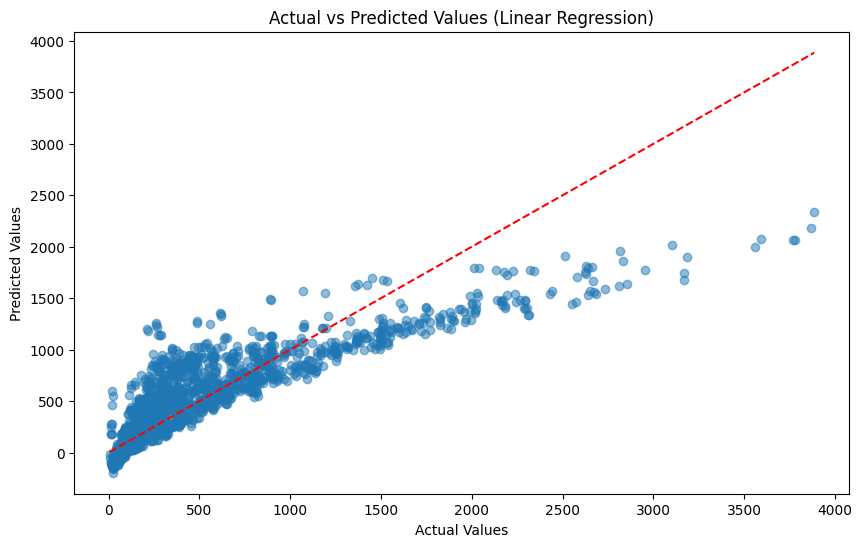

In [ ]:
import matplotlib.pyplot as plt

# Assuming y_test and y_pred are your actual and predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Line of perfect prediction
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values (Linear Regression)')
plt.show()


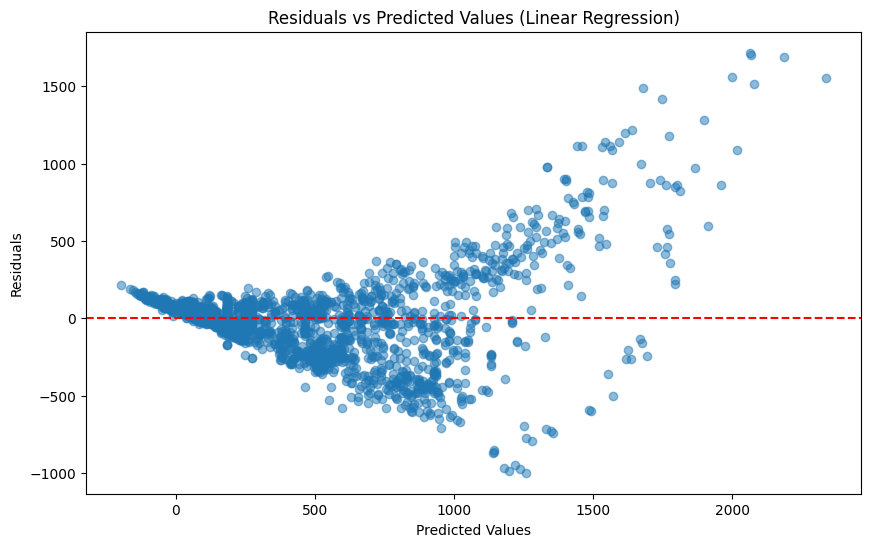

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, y_test - y_pred, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values (Linear Regression)')
plt.show()


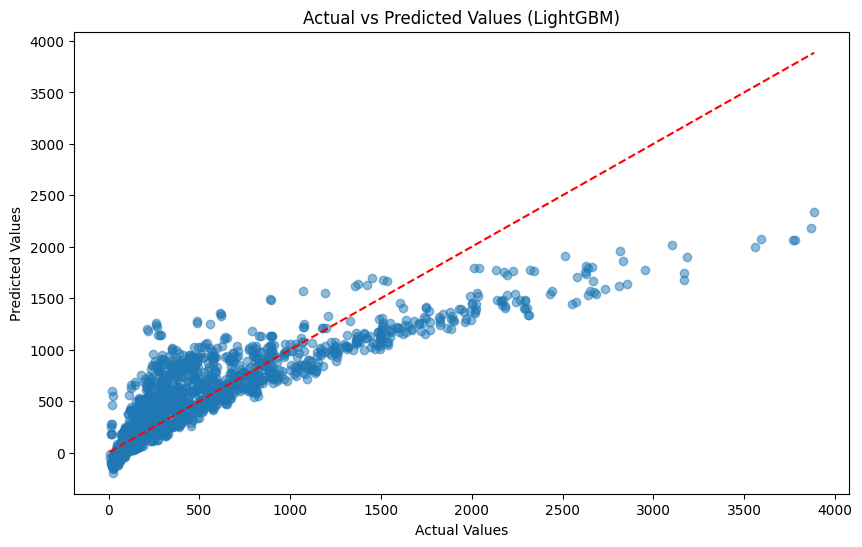

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Line of perfect prediction
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values (LightGBM)')
plt.show()


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1027
[LightGBM] [Info] Number of data points in the train set: 8031, number of used features: 134
[LightGBM] [Info] Start training from score 505.978832


<Figure size 1000x600 with 0 Axes>

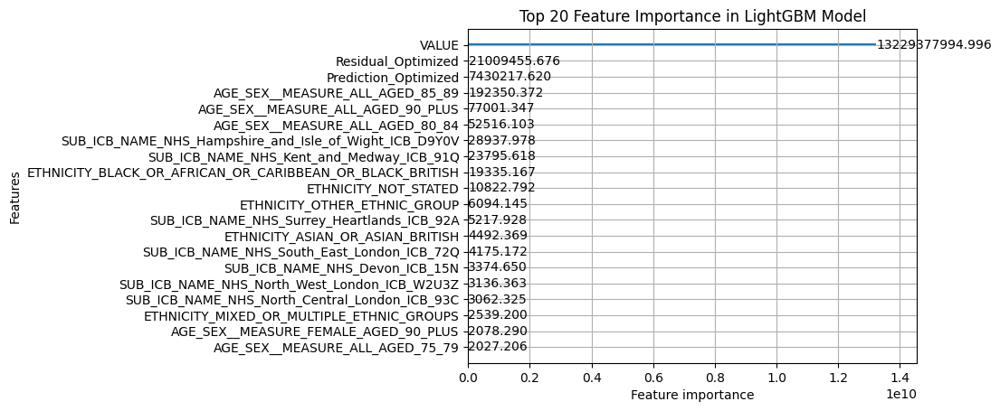

In [ ]:
import lightgbm as lgb
import matplotlib.pyplot as plt

# Assuming your data is already prepared and split into X_train and y_train
# Example:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the LightGBM model
lgb_model = lgb.LGBMRegressor(random_state=42)

# Fit the model to the training data
lgb_model.fit(X_train, y_train)

# Now plot the feature importance
plt.figure(figsize=(10, 6))
lgb.plot_importance(lgb_model, max_num_features=20, importance_type='gain')
plt.title('Top 20 Feature Importance in LightGBM Model')
plt.show()


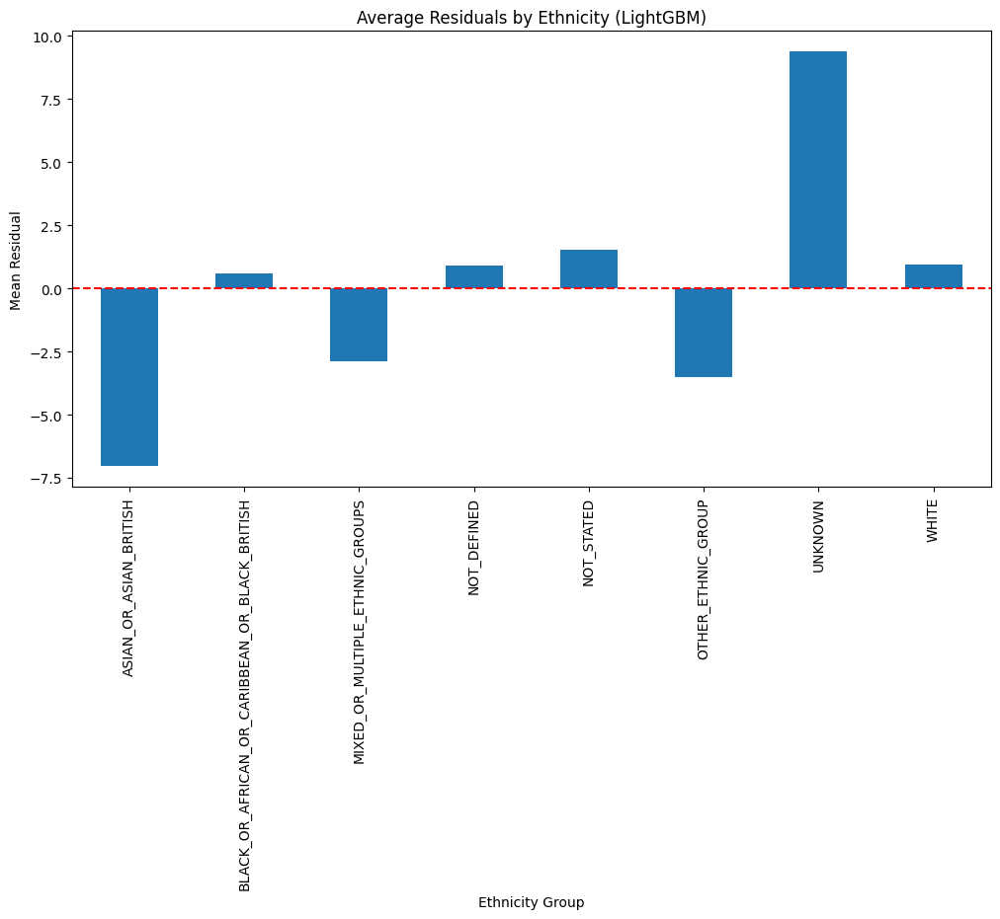

In [ ]:
plt.figure(figsize=(12, 6))
df_encoded.groupby('ETHNICITY_GROUP')['Residual'].mean().plot(kind='bar')
plt.title('Average Residuals by Ethnicity (LightGBM)')
plt.ylabel('Mean Residual')
plt.xlabel('Ethnicity Group')
plt.axhline(0, color='red', linestyle='--')
plt.show()


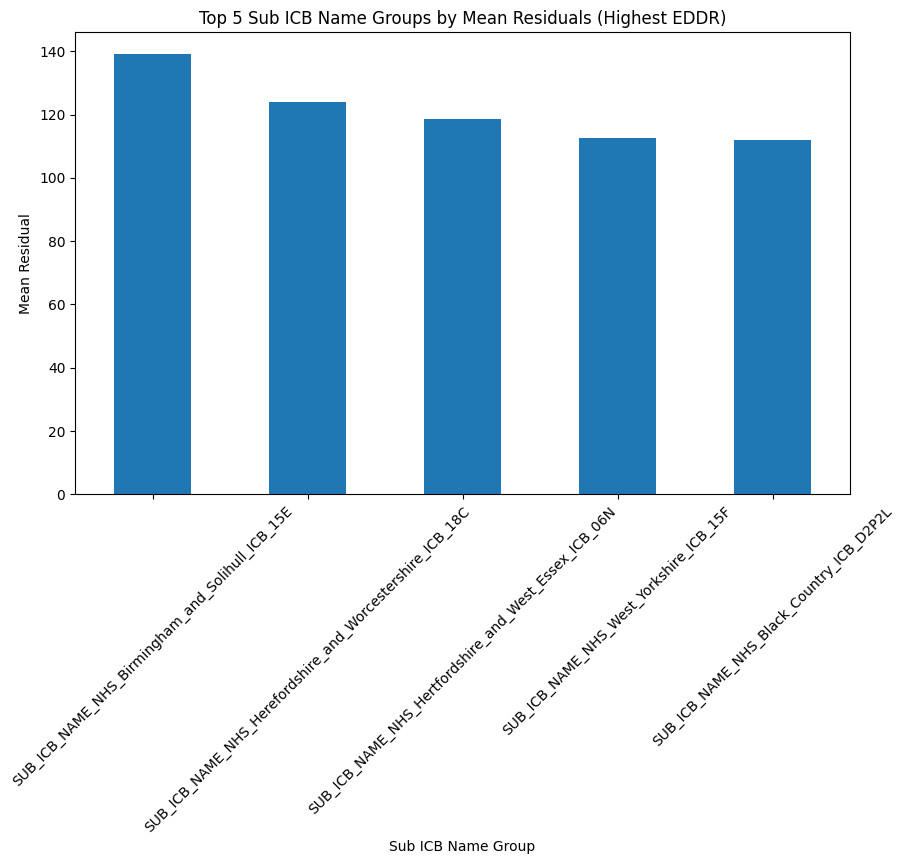

In [ ]:
# Sort by mean residuals and select top 5
top_residuals = df_encoded.groupby('SUB_ICB_NAME_GROUP')['Residual'].mean().sort_values(ascending=False).head(5)

# Plot the highest residuals
plt.figure(figsize=(10, 6))
top_residuals.plot(kind='bar')
plt.title('Top 5 Sub ICB Name Groups by Mean Residuals (Highest EDDR)')
plt.ylabel('Mean Residual')
plt.xlabel('Sub ICB Name Group')
plt.xticks(rotation=45)
plt.show()


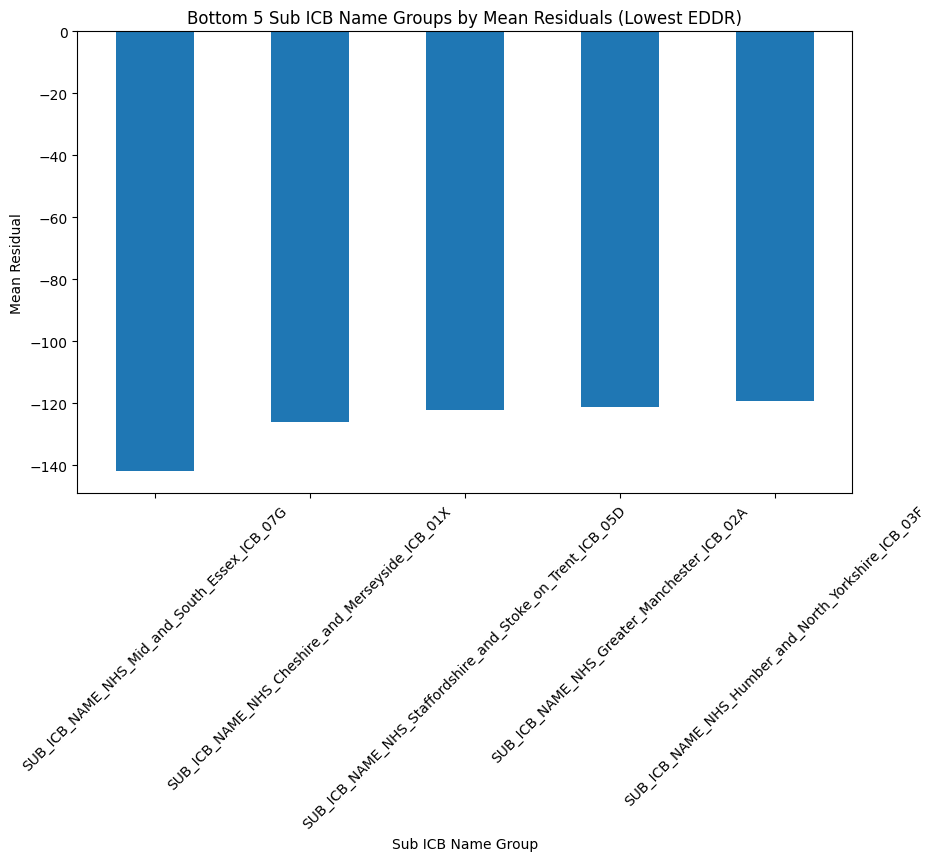

In [ ]:
# Sort by mean residuals and select bottom 5
bottom_residuals = df_encoded.groupby('SUB_ICB_NAME_GROUP')['Residual'].mean().sort_values().head(5)

# Plot the lowest residuals
plt.figure(figsize=(10, 6))
bottom_residuals.plot(kind='bar')
plt.title('Bottom 5 Sub ICB Name Groups by Mean Residuals (Lowest EDDR)')
plt.ylabel('Mean Residual')
plt.xlabel('Sub ICB Name Group')
plt.xticks(rotation=45)
plt.show()


<ipython-input-76-0a4d6de7c512>:19: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


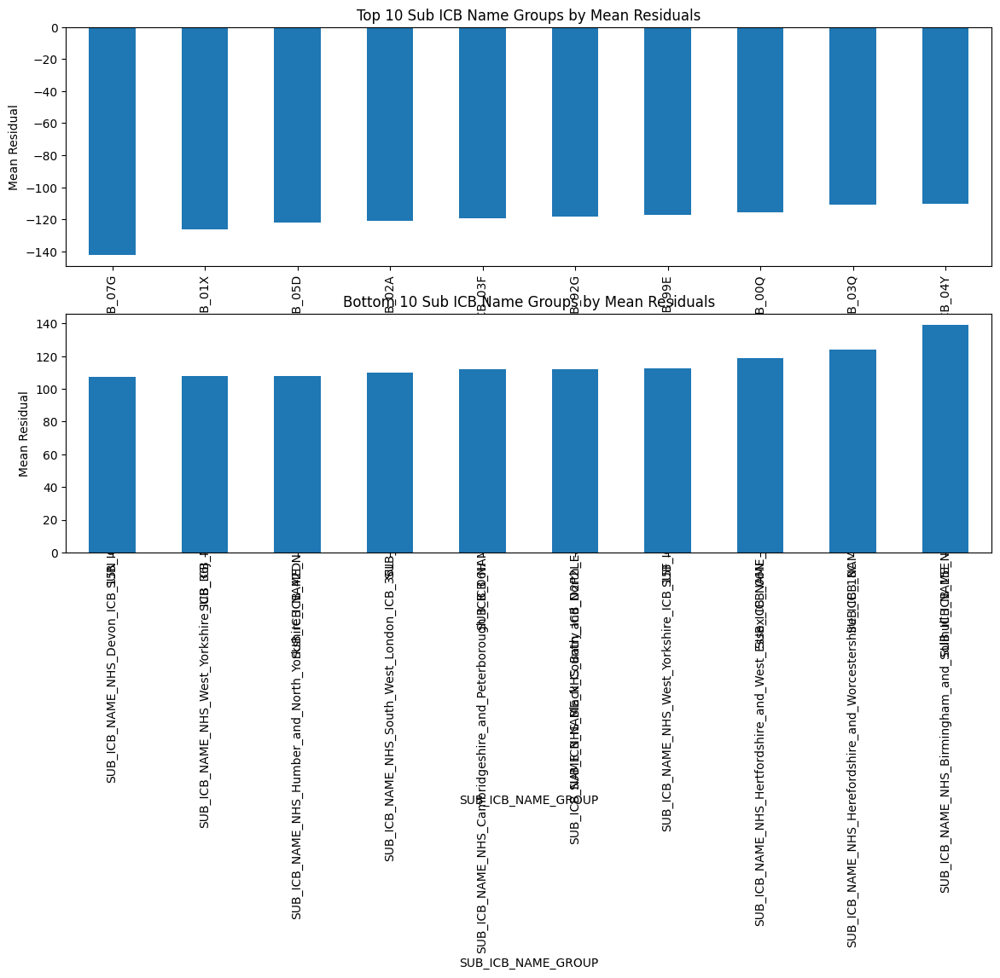

In [ ]:
# Sort by mean residuals
sorted_residuals = df_encoded.groupby('SUB_ICB_NAME_GROUP')['Residual'].mean().sort_values()

# Plot Top 10 and Bottom 10
plt.figure(figsize=(14, 8))

# Plot Top 10
plt.subplot(2, 1, 1)
sorted_residuals.head(10).plot(kind='bar')
plt.title('Top 10 Sub ICB Name Groups by Mean Residuals')
plt.ylabel('Mean Residual')

# Plot Bottom 10
plt.subplot(2, 1, 2)
sorted_residuals.tail(10).plot(kind='bar')
plt.title('Bottom 10 Sub ICB Name Groups by Mean Residuals')
plt.ylabel('Mean Residual')

plt.tight_layout()
plt.show()


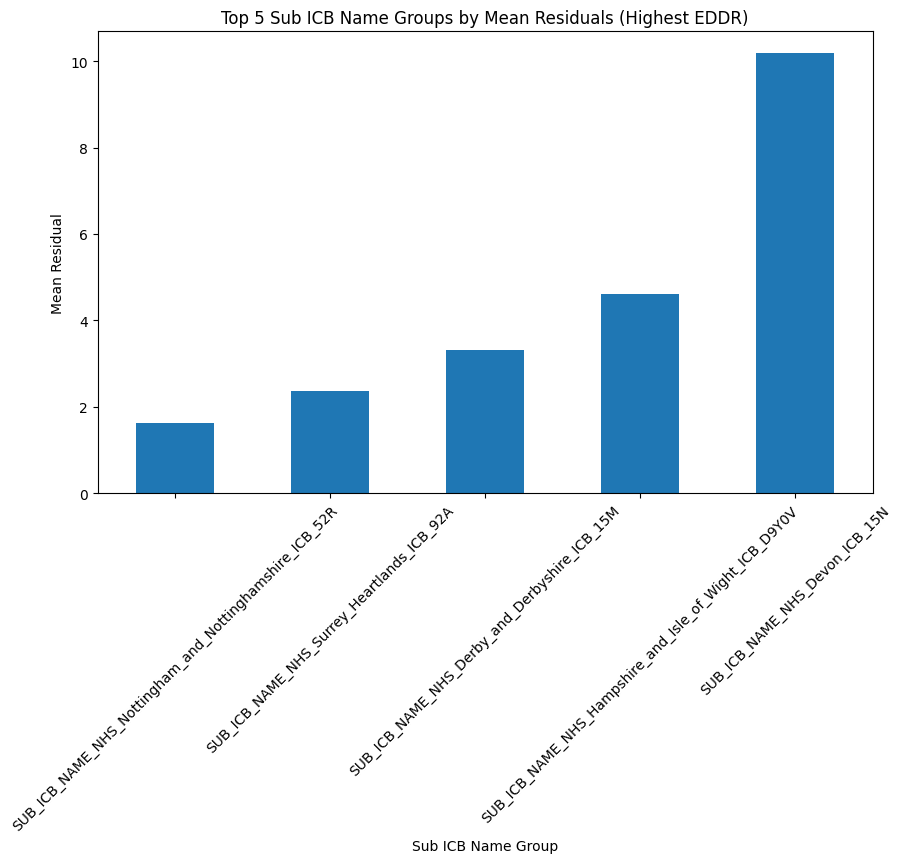

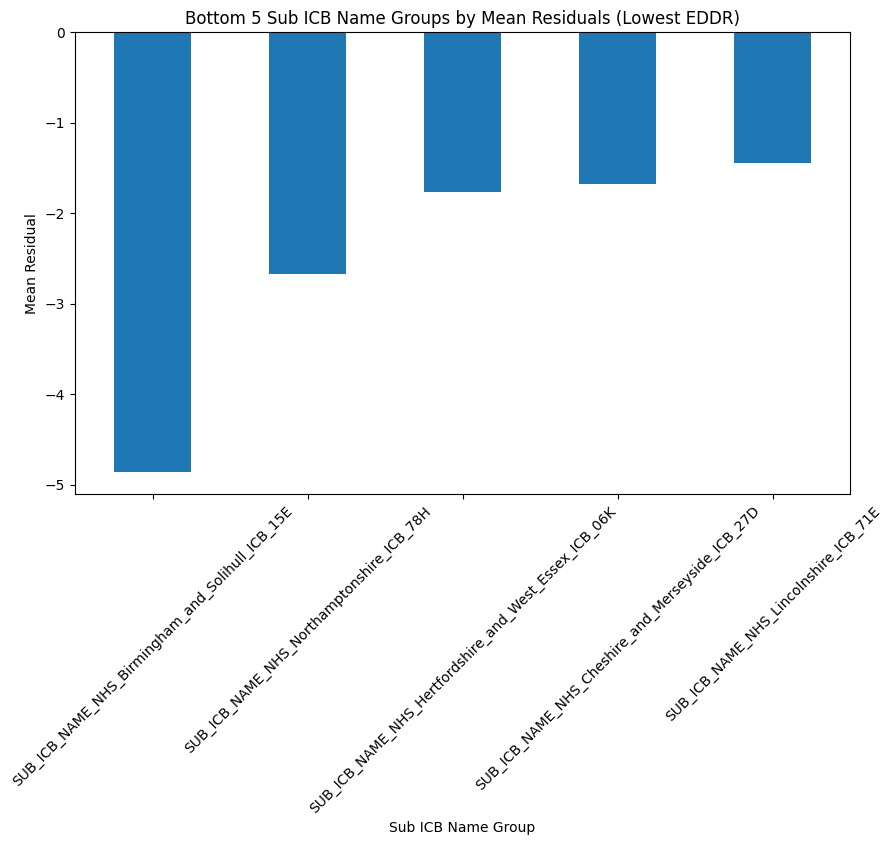

In [ ]:
# Calculate mean residuals for each Sub ICB Name Group
mean_residuals = df_encoded.groupby('SUB_ICB_NAME_GROUP')['Residual_Fairness_Aware'].mean().sort_values()

# Select the top 5 Sub ICB Name Groups with highest residuals (indicating overprediction)
top_residuals_fairness = mean_residuals.tail(5)

# Select the bottom 5 Sub ICB Name Groups with lowest residuals (indicating underprediction)
bottom_residuals_fairness = mean_residuals.head(5)

# Plot the top 5 residuals
plt.figure(figsize=(10, 6))
top_residuals_fairness.plot(kind='bar')
plt.title('Top 5 Sub ICB Name Groups by Mean Residuals (Highest EDDR)')
plt.ylabel('Mean Residual')
plt.xlabel('Sub ICB Name Group')
plt.xticks(rotation=45)
plt.show()

# Plot the bottom 5 residuals
plt.figure(figsize=(10, 6))
bottom_residuals_fairness.plot(kind='bar')
plt.title('Bottom 5 Sub ICB Name Groups by Mean Residuals (Lowest EDDR)')
plt.ylabel('Mean Residual')
plt.xlabel('Sub ICB Name Group')
plt.xticks(rotation=45)
plt.show()


Chi-Square Statistic: 0.22007621290261173
P-Value: 0.9999944049935077
Degrees of Freedom: 8
Cramér's V: 0.023397719246261908


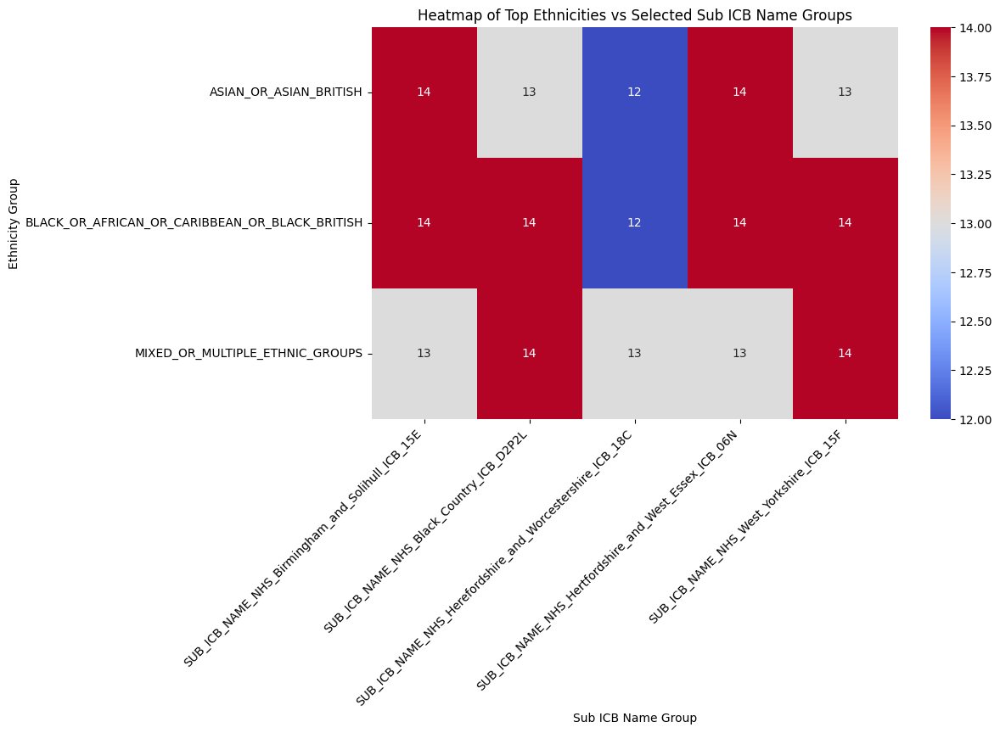

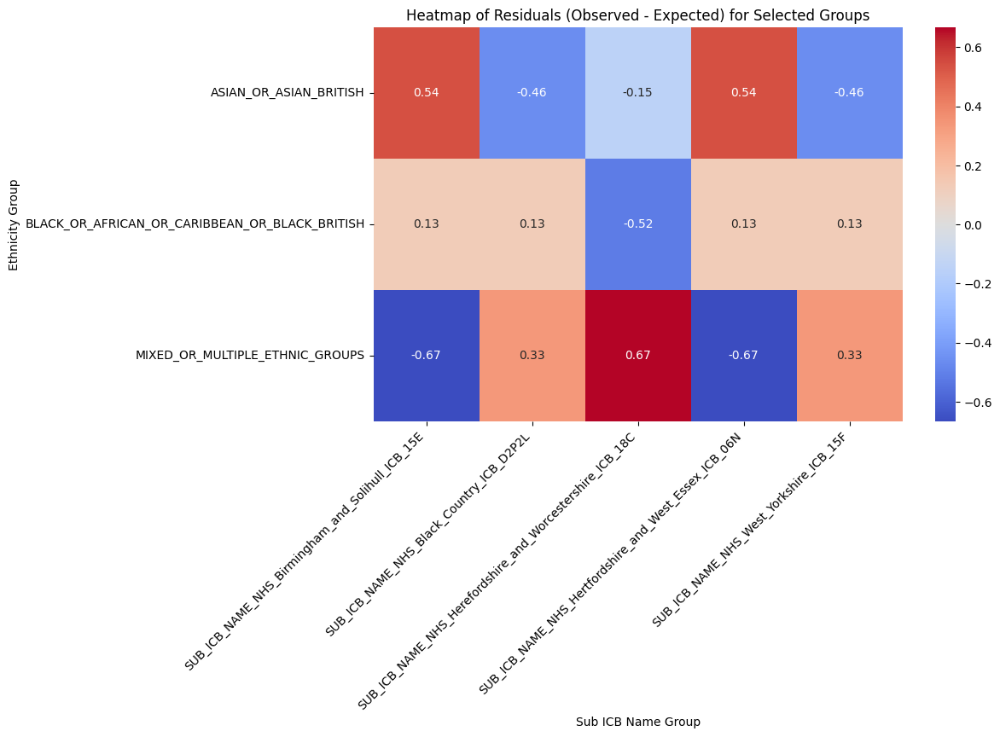

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# Filter to focus on top 5 Sub ICB Names by total counts
top_icbs = df_encoded.groupby('SUB_ICB_NAME_GROUP')['Residual'].mean().nlargest(5).index
top_ethnicities = df_encoded.groupby('ETHNICITY_GROUP').size().nlargest(3).index

filtered_data = df_encoded[(df_encoded['SUB_ICB_NAME_GROUP'].isin(top_icbs)) &
                           (df_encoded['ETHNICITY_GROUP'].isin(top_ethnicities))]

# Create a contingency table with the filtered data
contingency_table = pd.crosstab(filtered_data['ETHNICITY_GROUP'], filtered_data['SUB_ICB_NAME_GROUP'])

# Chi-Square Test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Cramér's V
cramers_v = np.sqrt(chi2 / (contingency_table.sum().sum() * (min(contingency_table.shape) - 1)))

# Display Chi-Square Test and Cramér's V results
print(f"Chi-Square Statistic: {chi2}")
print(f"P-Value: {p}")
print(f"Degrees of Freedom: {dof}")
print(f"Cramér's V: {cramers_v}")

# Visualization 1: Heatmap of the contingency table (filtered)
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table, annot=True, cmap='coolwarm', fmt='g')
plt.title('Heatmap of Top Ethnicities vs Selected Sub ICB Name Groups')
plt.xlabel('Sub ICB Name Group')
plt.ylabel('Ethnicity Group')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.show()

# Visualization 2: Heatmap of residuals for filtered data
residuals = contingency_table - expected
plt.figure(figsize=(10, 6))
sns.heatmap(residuals, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap of Residuals (Observed - Expected) for Selected Groups')
plt.xlabel('Sub ICB Name Group')
plt.ylabel('Ethnicity Group')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.show()
